## ***TEAM 10: DLAI project***
# Roger Aylagas, Aina Palacios, Laia Tarrés i Sònia Villar

First we need to do an installation of a library

In [1]:
!pip install beautifultable

We will import all libraries necessary to develop the project

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import random_split
from torch.autograd import Variable
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, utils

from IPython.display import display
from PIL import Image

import numpy as np
import math
from math import ceil

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

from beautifultable import BeautifulTable

if torch.cuda.is_available():
  torch.cuda.manual_seed_all(1)



print("Libraries imported successfully!")

Libraries imported successfully!


In the following piece of code the MNIST dataset is downloded to be able to work with it along all the project.

In [3]:
mnist_trainset = datasets.MNIST(root='./data', train=True, download=True, transform=transforms.Compose([
                                    transforms.ToTensor()
                                ]))
mnist_testset = datasets.MNIST(root='./data', train=False, download=True, transform=transforms.Compose([
                                    transforms.ToTensor()
                                ]))

0it [00:00, ?it/s]

9920512it [00:02, 3900062.24it/s]                            


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


0it [00:00, ?it/s]

32768it [00:00, 57896.43it/s]                           
0it [00:00, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw


1654784it [00:01, 964549.03it/s]                             
0it [00:00, ?it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw


8192it [00:00, 21806.96it/s]            

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw
Processing...
Done!


## Exercise 1 Autoencoder 

### What the exercise asked for:
Train a convolutional autoencoder on MNIST, study the influence of the bottleneck size and generate some images.

### The steps to be followed:
1. Load MNIST train and test sets. Split the original training data into 95% training and 5% validation data.
2. Implement a convolutional autoencoder (with separate Encoder and Decoder modules).
3. Train the convolutional autoencoder, with different bottleneck sizes. Plot the train and validation loss curves of all autoencoders in the same figure.
4. Compute the avg. image reconstruction error (MSE) of the trained models on the MNIST validation and test sets. Show the results in a table, including #params of each model.
5. Select one of the autoencoders and feed it 5 random MNIST images from the test set. Show them along with their reconstructions.
6. Generate 5 new images by injecting random values as input to the decoder. Show them.

Now we will create the validation set with 5% of the training data and so the 95% of the original training set will be used to train the networks

In [0]:
validation_split = 0.05
random_seed= 5 

dataset_size = len(mnist_trainset)
indices = list(range(dataset_size))
split = int(np.floor(validation_split * dataset_size))

# Shuffle dataset
torch.manual_seed(random_seed)
np.random.seed(random_seed)
np.random.shuffle(indices)

# Get samples indices
train_indices, val_indices = indices[split:], indices[:split]

# Creating PT data samplers
train_sampler = SubsetRandomSampler(train_indices)
valid_sampler = SubsetRandomSampler(val_indices)

First of all we will create the list of parameters for the encoder and decoder classes.

In [0]:
hparams = {
    'batch_size':64,
    'num_epochs':30,
    'test_batch_size':64,
    'num_classes':10,
    'learning_rate':1e-3,
    'pretrained_learning_rate': 1e-5,
    'log_interval':400,
}

hparams['device'] = 'cuda' if torch.cuda.is_available() else 'cpu'

With the parameters initialized we now create both the Encoder and the Decoder and then the full Convolutional Autoencoder. The design of this autoencoder is based on the Convolutional AutoEncoder for MNIST which can be found in this [link](https://github.com/udacity/deep-learning-v2-pytorch/blob/master/autoencoder/convolutional-autoencoder/Convolutional_Autoencoder_Solution.ipynb)

The structure of the Convolutional encoder consists of:
- One convolutional layer. With 16 filters of size 3x3 and padding 1
- One max pool layer, that reduces the image size by 2
- Another convolutional layer of 4 filters of size 3x3 and padding 1
- Another max pool layer
- A flatten layer to reshape the output matrix into a vector
- A final fully connected layer, to set the vector size to bottleneck

In [0]:
class ConvEncoder(nn.Module):
  def __init__(self,bottleneck):
    super().__init__()
    self.conv1 = nn.Conv2d(1, 16, 3, padding=1)  
    self.conv2 = nn.Conv2d(16, 4, 3, padding=1)
    self.relu = nn.ReLU()
    self.pool = nn.MaxPool2d(2, 2)
    self.flatten = nn.Flatten()
    self.mlp = nn.Sequential(
        nn.Linear(4*7*7,bottleneck), 
        nn.ReLU()
    )

  def forward(self, x):
    x = self.relu(self.conv1(x))
    x = self.pool(x)
    x = self.relu(self.conv2(x)) 
    x = self.pool(x)
    x= self.flatten(x) 
    x = self.mlp(x)
    return x

The decoder uses transposed convolutional layers to increase the width and height of the input layers. They work almost exactly the same as convolutional layers, but in reverse. A stride in the input layer results in a larger stride in the transposed convolution layer.

In the decoder is important to take into account that some checkerboard artifacts may appear. The solution of this (proposed [here](https://distill.pub/2016/deconv-checkerboard/)) can be done by using upsampling layers (such as nearest neighbout or bilinear).

The structure of the Convolutional decoder consists of:
- A final fully connected layer, to set the vector of size bottleneck to another vector size
- A reshape function to pass from vector to 2d
- A upsample layer with scale factor of 2
- One convolutional layer. With 16 filters of size 3x3 and padding 1
- Another upsample layer with scale factor of 2
- Another convolutional layer of 1 filters of size 3x3 and padding 1
- A sigmoid function




In [0]:
class ConvDecoder(nn.Module):
  def __init__(self,bottleneck):
    super().__init__()
    self.mlp = nn.Sequential(
        nn.Linear(bottleneck,4*7*7), 
        nn.ReLU()
    )
    self.relu = nn.ReLU()
    self.t_conv1 = nn.ConvTranspose2d(4, 16, 3, padding=1)
    self.t_conv2 = nn.ConvTranspose2d(16, 1, 3, padding=1)
    self.upsample= nn.UpsamplingBilinear2d(scale_factor=2)
    self.sigmoid = nn.Sigmoid()


  def forward(self, x):
    x = self.mlp(x)
    x = x.view(x.shape[0], 4, 7, 7)
    x = self.upsample(x)
    x = self.relu(self.t_conv1(x))
    x = self.upsample(x)
    x = self.sigmoid(self.t_conv2(x))
    return x

The autoencoder, named ConvAutoencoder, that joins the output of the encoder to the input of the decoder.

In [0]:
class ConvAutoencoder(nn.Module):
  def __init__(self, bottleneck):
    super().__init__()
    self.encoder = ConvEncoder(bottleneck)
    self.decoder = ConvDecoder(bottleneck)

  def forward(self, x):
    x = self.encoder(x)
    x = self.decoder(x)
    return x

To make the used architecture more clear, we have done a block diagram to better visualize it and understand it:
![texto alternativo](https://drive.google.com/uc?id=1gsOok35n2aEj-4Ib0z43p2rx7HO0MUTT)

With the autoencoder defined, we will now define the train function. For each epoch and for each image, the training loss is estimated; for each epoch, we will have also a validation loss.

In [0]:
def train(train_loader, validation_loader, network, optimizer, criterion, hparams):
  train_losses = []
  val_losses = []
  network.train()
  device = hparams['device']
  for epoch in range(hparams['num_epochs']):
    val_loss=0.0
    num=0
    for data in train_loader: 
      img, idx = data
      img= img.to(device)
      idx=idx.to(device)
      output = network(img)
      loss = criterion(output, img)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      train_losses.append(loss.item())
      num+=1
      if num % hparams['log_interval'] == 0:
        print('epoch [{}/{}], [{}/{} ({:.0f}%)]\tloss:{:.4f}'.format(epoch+1, hparams['num_epochs'], num * len(img), len(train_loader.sampler),
              100. * num / len(train_loader), loss.item()))

    network.eval()
    with torch.no_grad():
        for data in validation_loader:
            img, _ = data
            img= img.to(device)
            output = network(img)
            val_loss += criterion(output, img).item()
        val_loss /= len(validation_loader)
    val_losses.append(val_loss)
    print('\nValidation set: Loss: {:.4f} \n'.format(val_loss))

  return train_losses, val_losses

Now we create the three data loaders using the parameters defined above

In [0]:
train_loader = torch.utils.data.DataLoader(mnist_trainset,
                                           batch_size=hparams['batch_size'], 
                                           sampler=train_sampler)
validation_loader = torch.utils.data.DataLoader(mnist_trainset,
                                                batch_size=hparams['test_batch_size'],
                                                sampler=valid_sampler)
test_loader = torch.utils.data.DataLoader(mnist_testset,
                                          batch_size=hparams['test_batch_size'],
                                          shuffle=False)

We are now ready to train our convolutional autoencoder with different bottleneck sizes.

In [11]:
bottlenecks=[5, 10, 15, 20, 50]
criterion = nn.MSELoss()

networks = [None] * len(bottlenecks)
train_size = (1-validation_split)*dataset_size
n_steps = ceil(train_size/hparams['batch_size'])*hparams['num_epochs']
train_losses = np.empty((len(bottlenecks),n_steps))
val_losses = np.empty((len(bottlenecks), hparams['num_epochs']))

for i in range(len(bottlenecks)):
  network = ConvAutoencoder(bottlenecks[i])
  network.to(hparams['device'])
  optimizer = optim.Adam(network.parameters(),
                        lr=hparams['learning_rate'])

  train_losses_b,val_losses_b = train(train_loader, validation_loader, network, optimizer, criterion, hparams)
  networks[i]=network
  train_losses[i,:] = train_losses_b
  val_losses[i,:]= val_losses_b

epoch [1/30], [25600/57000 (45%)]	loss:0.0554
epoch [1/30], [51200/57000 (90%)]	loss:0.0566

Validation set: Loss: 0.0521 

epoch [2/30], [25600/57000 (45%)]	loss:0.0503
epoch [2/30], [51200/57000 (90%)]	loss:0.0491

Validation set: Loss: 0.0494 

epoch [3/30], [25600/57000 (45%)]	loss:0.0495
epoch [3/30], [51200/57000 (90%)]	loss:0.0488

Validation set: Loss: 0.0479 

epoch [4/30], [25600/57000 (45%)]	loss:0.0441
epoch [4/30], [51200/57000 (90%)]	loss:0.0464

Validation set: Loss: 0.0470 

epoch [5/30], [25600/57000 (45%)]	loss:0.0466
epoch [5/30], [51200/57000 (90%)]	loss:0.0469

Validation set: Loss: 0.0463 

epoch [6/30], [25600/57000 (45%)]	loss:0.0436
epoch [6/30], [51200/57000 (90%)]	loss:0.0490

Validation set: Loss: 0.0459 

epoch [7/30], [25600/57000 (45%)]	loss:0.0440
epoch [7/30], [51200/57000 (90%)]	loss:0.0461

Validation set: Loss: 0.0454 

epoch [8/30], [25600/57000 (45%)]	loss:0.0381
epoch [8/30], [51200/57000 (90%)]	loss:0.0496

Validation set: Loss: 0.0452 

epoch [9

In [17]:
from google.colab import drive
drive.mount('/content/gdrive')
#potser s'ha de canviar a la carpeta on estan totes les coses

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
#guardar els models
for i in range(len(bottlenecks)):
  model_save_name = 'networks_def_'+str(i)+'.pt'
  path = F"/content/gdrive/My Drive/MATT/DLAI/Projecte_DLAI/{model_save_name}"
  torch.save({
      'model_state_dict': networks[i].state_dict(), 
      'train_losses':train_losses[i,:],
      'val_losses':val_losses[i,:]},
      path)

In [0]:
#carregar els models si cal...
bottlenecks=[5, 10, 15, 20, 50]
networks = [None] * len(bottlenecks)
train_size = (1-validation_split)*dataset_size
n_steps = ceil(train_size/hparams['batch_size'])*hparams['num_epochs']
train_losses = np.empty((len(bottlenecks),n_steps))
val_losses = np.empty((len(bottlenecks), hparams['num_epochs']))

for i in range(len(bottlenecks)):
  networks[i]= ConvAutoencoder(bottlenecks[i])
  model_save_name = 'networks_def_'+str(i)+'.pt'
  path = F"/content/gdrive/My Drive/MATT/DLAI/Projecte_DLAI/{model_save_name}"
  checkpoint = torch.load(path)
  networks[i].load_state_dict(checkpoint['model_state_dict'])
  train_losses[i,:]=checkpoint['train_losses']
  val_losses[i,:]=checkpoint['val_losses']

Let's see how the training and validation loss evolution looks like for each bottleneck.

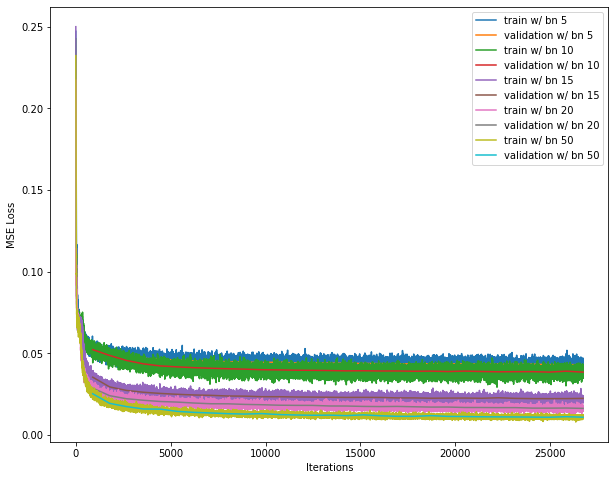

In [12]:
interval = ceil(train_size/hparams['batch_size'])
plt.figure(figsize=(10, 8))
plt.xlabel('Iterations')
plt.ylabel('MSE Loss')
for i in range(len(bottlenecks)):
  plt.plot(range(1,len(train_losses[i,:])+1),train_losses[i,:], label='train w/ bn '+str(bottlenecks[i]))
  plt.plot(range(1+interval,len(train_losses[i,:])+interval+1,interval),val_losses[i,:], label='validation w/ bn '+str(bottlenecks[i]))

plt.legend()

As we can see at the graph, if we increase the size of the bottleneck, the error is lower. 

That is because we have more parameters to represent the same data. Therefore, the network will have better performance.

Finally, we will estimate the training loss.

In [0]:
device = hparams['device']
test_losses = np.empty((len(bottlenecks)))
criterion = nn.MSELoss()
counter=0
for i in range(len(bottlenecks)):
  network=networks[i].to(device)
  network.eval()
  with torch.no_grad():
        for data in test_loader:
            img, _ = data
            img = img.to(device)
            output = network(img)
            test_losses[i] += criterion(output, img).item()
            counter+=1
  test_losses[i] /= counter

Now we plot the recently found losses into a table to have a better interpretation of the model.

In [14]:
def count_parameters(model):
  return sum(p.numel() for p in model.parameters() if p.requires_grad)

h0=["bottleneck size"]
h0.append("# params")
h0.append("test MSE")
h0.append("val MSE")

table = BeautifulTable()
table.column_headers = h0

for i in range(len(bottlenecks)):
  table.append_row([bottlenecks[i],count_parameters(networks[i]),test_losses[i], val_losses[i,-1]])

print(table)

+-----------------+----------+----------+---------+
| bottleneck size | # params | test MSE | val MSE |
+-----------------+----------+----------+---------+
|        5        |   3638   |  0.049   |  0.043  |
+-----------------+----------+----------+---------+
|       10        |   5603   |  0.025   |  0.039  |
+-----------------+----------+----------+---------+
|       15        |   7568   |  0.013   |  0.022  |
+-----------------+----------+----------+---------+
|       20        |   9533   |  0.012   |  0.016  |
+-----------------+----------+----------+---------+
|       50        |  21323   |  0.015   |  0.011  |
+-----------------+----------+----------+---------+


If we try to use a bottleneck size of 5 to encode 10 different numbers, the test error is considerably highter than using size 10

Let's see now how the reconstructed images look like, extracting one batch of the best network. 
If we search the minim argument of the validation losses, we will know witch bottleneck is better.


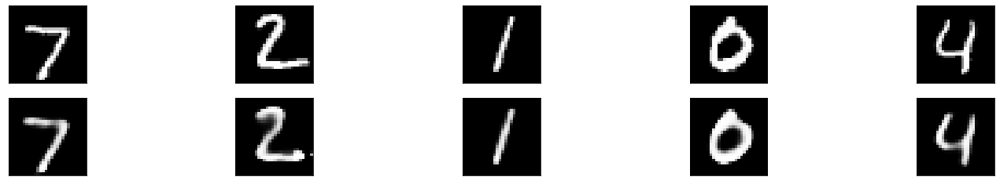

In [15]:
dataiter = iter(test_loader)
images, labels = dataiter.next()

min_valError_idx = np.argmin(val_losses[:,-1])
best_net=networks[min_valError_idx]
best_net.eval() 
best_net.to('cpu')
output = best_net(images)

images = images.numpy()


output = output.detach().numpy()

fig, axes = plt.subplots(nrows=2, ncols=5, sharex=True, sharey=True, figsize=(25,4))

for images, row in zip([images, output], axes):
    for img, ax in zip(images, row):
        ax.imshow(np.squeeze(img), cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

Now we will use the Decoder as an image generator. We inject random values to the decoder and create 5 new images. We will use the best bottleneck.

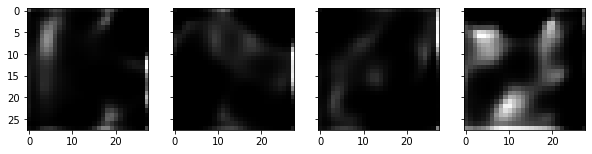

In [18]:
inputs_bottleneck = torch.randn(5,bottlenecks[min_valError_idx])

net = networks[min_valError_idx].to('cpu')
net.eval()
outputs= net.decoder(inputs_bottleneck).detach().cpu().numpy()

num_inputs = inputs_bottleneck.shape[0]
fig, axes = plt.subplots(nrows=1, ncols=num_inputs, sharex=True, sharey=True, figsize=(10,4))
for i in range(num_inputs):
  axes[i].imshow(np.squeeze(outputs[i]), cmap='gray')
fig.show() 

However, we have found that using the minimum bottleneck size achives slightly better results for reconstruction. That is because when injecting random values, it is more likely that the values are similar than the ones contained in the database if that vector is smaller. This is shown in the figure below:

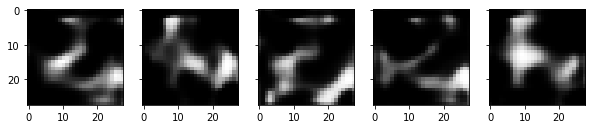

In [72]:
inputs_bottleneck = torch.randn(5,bottlenecks[0])

net = networks[0].to('cpu')
net.eval()
outputs= net.decoder(inputs_bottleneck).detach().cpu().numpy()

num_inputs = inputs_bottleneck.shape[0]
fig, axes = plt.subplots(nrows=1, ncols=num_inputs, sharex=True, sharey=True, figsize=(10,4))
for i in range(num_inputs):
  axes[i].imshow(np.squeeze(outputs[i]), cmap='gray')
fig.show() 

## Exercise 2 Transfer Learning

### What the exercise asked for:
Reuse autoencoder weights for pre-training and fine-tuning of a classifier trained on a small labeled subset of MNIST.

### The steps to be followed:
1. Select a subset of 100 images and their associated labels from the MNIST training data.
2. Select one of the previously trained autoencoders.
3. Create a digit (0-9) classification model reusing the encoder of the autoencoder and adding the needed fully connected (projection) layer.
4. Pre-training: use the weights of the autoencoder as initial values for the network weights and train a classification model on the subset of 100 samples.
5. Fine-tuning: do the same, but train the new projection layer with a normal learning rate and the reused part with a very low learning rate.
6. From scratch: train the model on the 100 samples without reusing the encoder weights at all.
7. Show the accuracy of the three models on the MNIST test set in a table.

New hparams are defined so it allowed us to play with different learning rates.

In [0]:
hparams = {
    'batch_size':128,
    'num_epochs':70,
    'test_batch_size':64,
    'num_classes':10,
    'learning_rate':1e-3,
    'pretrained_learning_rate': 1e-4,
    'log_interval':400,
}

hparams['device'] = 'cuda' if torch.cuda.is_available() else 'cpu'

First we select a subset of 100 images and its associated labels from the trainset from exercice 1

In [0]:
subset_train_indices = np.random.choice(train_indices,100)

subset_train_sampler = SubsetRandomSampler(subset_train_indices)

subset_train_loader = torch.utils.data.DataLoader(mnist_trainset,
                                           batch_size=hparams['batch_size'], 
                                           sampler=subset_train_sampler)

Then we define the classifier structure with the encoder from the previous autoencoder and a MLP to obtain a vector with size 10 with a score for each possible class.

In [0]:
class EncoderClassifier(nn.Module):
  def __init__(self, bottleneck):
    super().__init__()
    self.encoder = ConvEncoder(bottleneck)
    self.lin_proj = nn.Sequential(
      nn.Linear(bottleneck,200),
      nn.ReLU(),
      nn.Dropout(0.5),
      nn.Linear(200,100),
      nn.ReLU(),
      nn.Dropout(0.5),
      nn.Linear(100,10),
      nn.ReLU(),
      nn.LogSoftmax()
    )

  def forward(self, x):
    x = self.encoder(x)
    x = self.lin_proj(x)
    return x

Once the classifier is defined we define the train function.

In [0]:
def correct_predictions(predicted_batch, label_batch):
  pred = predicted_batch.argmax(dim=1, keepdim=True)
  acum = pred.eq(label_batch.view_as(pred)).sum().item()
  return acum

def train(train_loader, validation_loader, network, optimizer, criterion, hparams):
  train_losses = []
  val_losses = []
  test_acc = []
  network.train()
  device = hparams['device']
  for epoch in range(hparams['num_epochs']):
    val_loss=0.0
    num=0
    for data in train_loader:
      img, labels = data
      img = img.to(device)
      labels = labels.to(device)
      output = network(img)
      loss = criterion(output, labels)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      train_losses.append(loss.item())
      num+=1
      if num % hparams['log_interval'] == 0:
        print('epoch [{}/{}], [{}/{} ({:.0f}%)]\tloss:{:.4f}'.format(epoch+1, hparams['num_epochs'], num * len(data), len(train_loader.dataset),
              100. * num / len(train_loader), loss.item()))

    # Validation
    network.eval()
    acc = 0
    with torch.no_grad():
        for data in validation_loader:
            img, labels = data
            img = img.to(device)
            labels = labels.to(device)
            output = network(img)
            acc += correct_predictions(output, labels)
            val_loss += criterion(output, labels).item() # sum up batch loss
        val_loss /= len(validation_loader)
    val_losses.append(val_loss)
    test_acc.append(acc / len(validation_loader.sampler))
    print('\nValidation set: Loss: {:.4f} \n'.format(val_loss))
    print('\nValidation set: Accuracy: {:.4f} \n'.format(acc / len(validation_loader.sampler)))
  return train_losses, val_losses, test_acc

Using the pretrained weights from exercise 1 we will now train the new model for classification. First we have to find the best trained model, as we have used different bottleneck sizes. Once we have the best network, we get the encoder from it and use its weights.
Then we train the EncoderClassifier with the same learning rate for all the parameters.

In [33]:
min_valError_idx = np.argmin(val_losses[:,-1])
enc = networks[min_valError_idx].encoder

pretrained_classifier = EncoderClassifier(bottlenecks[min_valError_idx])
pretrained_classifier.encoder = enc
pretrained_classifier.to(hparams['device'])

optimizer = optim.Adam(pretrained_classifier.parameters(),
                        lr=hparams['learning_rate'])
criterion = nn.NLLLoss()

train_losses_pt,val_losses_pt, acc_pt= train(subset_train_loader, validation_loader, pretrained_classifier, optimizer, criterion, hparams)

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:92: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)



Validation set: Loss: 2.2837 


Validation set: Accuracy: 0.1360 


Validation set: Loss: 2.2270 


Validation set: Accuracy: 0.2180 


Validation set: Loss: 2.1731 


Validation set: Accuracy: 0.2947 


Validation set: Loss: 2.1005 


Validation set: Accuracy: 0.3453 


Validation set: Loss: 2.0276 


Validation set: Accuracy: 0.4123 


Validation set: Loss: 1.9668 


Validation set: Accuracy: 0.4267 


Validation set: Loss: 1.9131 


Validation set: Accuracy: 0.4370 


Validation set: Loss: 1.8606 


Validation set: Accuracy: 0.4540 


Validation set: Loss: 1.8064 


Validation set: Accuracy: 0.4733 


Validation set: Loss: 1.7583 


Validation set: Accuracy: 0.4830 


Validation set: Loss: 1.7103 


Validation set: Accuracy: 0.4940 


Validation set: Loss: 1.6545 


Validation set: Accuracy: 0.5150 


Validation set: Loss: 1.5953 


Validation set: Accuracy: 0.5283 


Validation set: Loss: 1.5387 


Validation set: Accuracy: 0.5503 


Validation set: Loss: 1.4839 


Validation set:

Now we will fine-tune the classification layer training each part of the model with different learning rates. The pre-trained part from exercise 1 will be trained with a very low learning rate, as it is near the optimum point, whereas the new classification layer will be trained with a normal learning rate.

In [34]:
finetuned_classifier = EncoderClassifier(bottlenecks[min_valError_idx])
finetuned_classifier.encoder = enc

finetuned_classifier.to(hparams['device'])
optimizer = optim.Adam([{'params': finetuned_classifier.encoder.parameters(),
                         'lr': hparams['pretrained_learning_rate']},
                        {'params': finetuned_classifier.lin_proj.parameters()}],
                        lr = hparams['learning_rate'])
criterion = nn.NLLLoss()

train_losses_ft,val_losses_ft, acc_ft = train(subset_train_loader, validation_loader, finetuned_classifier, optimizer, criterion, hparams)

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:92: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)



Validation set: Loss: 2.3917 


Validation set: Accuracy: 0.1570 


Validation set: Loss: 2.1952 


Validation set: Accuracy: 0.2033 


Validation set: Loss: 2.1007 


Validation set: Accuracy: 0.2700 


Validation set: Loss: 2.0113 


Validation set: Accuracy: 0.3297 


Validation set: Loss: 1.9055 


Validation set: Accuracy: 0.4180 


Validation set: Loss: 1.8152 


Validation set: Accuracy: 0.4497 


Validation set: Loss: 1.7441 


Validation set: Accuracy: 0.4693 


Validation set: Loss: 1.6708 


Validation set: Accuracy: 0.4890 


Validation set: Loss: 1.5848 


Validation set: Accuracy: 0.5223 


Validation set: Loss: 1.4935 


Validation set: Accuracy: 0.5543 


Validation set: Loss: 1.4163 


Validation set: Accuracy: 0.5880 


Validation set: Loss: 1.3672 


Validation set: Accuracy: 0.6067 


Validation set: Loss: 1.3368 


Validation set: Accuracy: 0.6117 


Validation set: Loss: 1.3093 


Validation set: Accuracy: 0.6137 


Validation set: Loss: 1.2807 


Validation set:

For the last model, we define the model from scratch and train it using the 100 samples.

In [35]:
scratch_classifier = EncoderClassifier(bottlenecks[min_valError_idx])
scratch_classifier.to(hparams['device'])

optimizer = optim.Adam(scratch_classifier.parameters(),
                        lr=hparams['learning_rate'])
criterion = nn.NLLLoss()

train_losses_sc,val_losses_sc, acc_sc = train(subset_train_loader, validation_loader, scratch_classifier, optimizer, criterion, hparams)

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:92: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)



Validation set: Loss: 2.3033 


Validation set: Accuracy: 0.0943 


Validation set: Loss: 2.3030 


Validation set: Accuracy: 0.1113 


Validation set: Loss: 2.3026 


Validation set: Accuracy: 0.1113 


Validation set: Loss: 2.3022 


Validation set: Accuracy: 0.1113 


Validation set: Loss: 2.3017 


Validation set: Accuracy: 0.1113 


Validation set: Loss: 2.3011 


Validation set: Accuracy: 0.1113 


Validation set: Loss: 2.3005 


Validation set: Accuracy: 0.1113 


Validation set: Loss: 2.3000 


Validation set: Accuracy: 0.1113 


Validation set: Loss: 2.2990 


Validation set: Accuracy: 0.1113 


Validation set: Loss: 2.2978 


Validation set: Accuracy: 0.1113 


Validation set: Loss: 2.2964 


Validation set: Accuracy: 0.1113 


Validation set: Loss: 2.2944 


Validation set: Accuracy: 0.1113 


Validation set: Loss: 2.2921 


Validation set: Accuracy: 0.1113 


Validation set: Loss: 2.2891 


Validation set: Accuracy: 0.1113 


Validation set: Loss: 2.2855 


Validation set:

Let's compare now the accuracy results of all the previous models for the test data

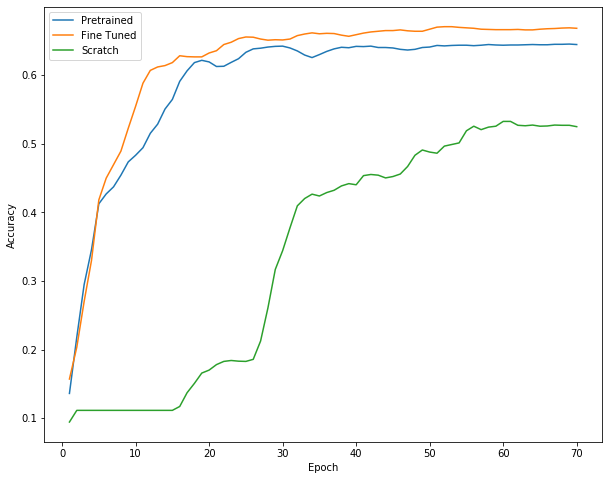

In [36]:
plt.figure(figsize=(10, 8))
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.plot(range(1,len(acc_pt)+1),acc_pt, label='Pretrained')
plt.plot(range(1,len(acc_pt)+1),acc_ft, label='Fine Tuned')
plt.plot(range(1,len(acc_pt)+1),acc_sc, label='Scratch')
plt.legend()

We have obtained the expected results!

When using transfer learning and fine tunning, the convergence is much faster and the performance overpasses the accuracy of the networks trained from scratch or pretrained. Despite that, initializing the net with pretrained weigths improves the performance with respect from training from scratch

In [0]:
def test(test_loader, network, hparams):
  device = hparams['device']
  network=network.to(device)
  network.eval()
  correct = 0
  total = 0
  test_acc = 0.0
  with torch.no_grad():
    for data in test_loader:
      images,labels=data
      labels = labels.to(device)
      images = images.to(device)
      outputs = network(images)
      _, predicted = torch.max(outputs.data, 1)
      total += len(labels)
      correct += torch.eq(predicted, labels).sum()
  test_acc=correct.item()/total
  return test_acc


In [40]:
pretrained_test_acc=test(test_loader, pretrained_classifier,hparams)
finetuned_test_acc=test(test_loader, finetuned_classifier,hparams)
scratch_test_acc=test(test_loader, scratch_classifier,hparams)

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:92: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


We show the table of the accuracies depending on the model used

In [41]:
def count_parameters(model):
  return sum(p.numel() for p in model.parameters() if p.requires_grad)

h0=["Model type"]
h0.append("test accuracy")
h0.append("val accuracy")

table = BeautifulTable()
table.column_headers = h0

h1=['Pretrained', pretrained_test_acc, acc_pt[-1]]
table.append_row(h1)
h1=['Finetuned', finetuned_test_acc, acc_ft[-1]]
table.append_row(h1)
h1=['Scratch', scratch_test_acc, acc_sc[-1]]
table.append_row(h1)

print(table)

+------------+---------------+--------------+
| Model type | test accuracy | val accuracy |
+------------+---------------+--------------+
| Pretrained |     0.641     |    0.644     |
+------------+---------------+--------------+
| Finetuned  |     0.681     |    0.668     |
+------------+---------------+--------------+
|  Scratch   |     0.514     |    0.525     |
+------------+---------------+--------------+


## Optional exercise: Varionational Autoencoder


Definition of the hyperparameters that will be used

In [0]:
hparams = {
    'batch_size':64,
    'num_epochs':10,
    'test_batch_size':64,
    'learning_rate':1e-3,
    'log_interval':400,
}

hparams['device'] = 'cuda' if torch.cuda.is_available() else 'cpu'

A Varionational autoencoder is a modification of the autoencoder, which allows turning the deterministic bottleneck into a stochastic bottleneck, with isotropic Gaussian as distribution for the latent variables. 

In our case, the Gaussian distribution we want has mean=0 and variance=1.

To do so, We have to redefine the encoder so that the output of the encoder is no longer a vector of bottleneck size, but the mean and variance of said vector.

Then, for the input of the decoder, we have to generate a gaussian vector, using a linear combination of this mean and variance computed with an standard normal gaussian vector generated in the encoder. This way we expect the decoder to learn how to generate output images using gaussian vectors.

As said in above, we want our decoder to produce gaussian vectors with a probability distribution function as similar as a standard normal. To learn how to do it, we add a regularization term to the loss which is computed using the KL Divergence between the actual gaussian distribution generated by the encoder and the desired standard normal

So in the end the loss is composed of two terms: the reconstruction loss + the KL Divergence

Declaration of the Convolutional Encoder with the added layers to compute the mean and variance of the gaussian distribution which output will have size = 'z_dim'

In [0]:
class ConvEncoder(nn.Module):
  def __init__(self,bottleneck, z_dim):
    super().__init__()
    self.conv1 = nn.Conv2d(1, 16, 3, padding=1)  
    self.conv2 = nn.Conv2d(16, 4, 3, padding=1)
    self.relu = nn.ReLU()
    self.pool = nn.MaxPool2d(2, 2)
    
    self.mlp = nn.Sequential(
        nn.Linear(4*7*7,bottleneck),
        nn.ReLU()
    )

    self.mu = nn.Linear(bottleneck, z_dim)
    self.var = nn.Linear(bottleneck, z_dim)

  def forward(self, x):
    x = self.relu(self.conv1(x))
    x = self.pool(x)
    x = self.relu(self.conv2(x)) 
    x = self.pool(x)
    x= x.view(x.shape[0], -1)
    x = self.mlp(x)
    
    z_mu = self.mu(x)
    z_var = self.var(x)

    return z_mu, z_var

Declaration of the Convolutional Decoder. Now the input of the decoder is a gaussian vector with size = 'z_dim'

In [0]:
class ConvDecoder(nn.Module):
  def __init__(self,bottleneck,z_dim):
    super().__init__()
    self.mlp = nn.Sequential(
        nn.Linear(bottleneck,4*7*7),
        nn.ReLU()
    )
    self.relu = nn.ReLU()
    self.mlp_0 = nn.Sequential(
        nn.Linear(z_dim,bottleneck),
        nn.ReLU()
    )

    self.t_conv1 = nn.ConvTranspose2d(4, 16, 3, padding=1)
    self.t_conv2 = nn.ConvTranspose2d(16, 1, 3, padding=1)
    self.upsample= nn.UpsamplingBilinear2d(scale_factor=2)
    self.sigmoid = nn.Sigmoid()

  def forward(self, x):
    x = self.mlp_0(x)
    x = self.mlp(x)
    x = x.view(x.shape[0], 4, 7, 7)
    x = self.upsample(x)
    x = self.relu(self.t_conv1(x))
    x = self.upsample(x)
    x = self.sigmoid(self.t_conv2(x))
    return x

The Variational AutoEncoder is declared with an encoder and a decoder. The forward contains a regularization part where a gaussian vector is created using the learnned parameters (mean and variance) so it fits the desired distribution

In [0]:
class VAE(nn.Module):
  def __init__(self, bottleneck, z_dim):
    super().__init__()
    self.encoder = ConvEncoder(bottleneck, z_dim)
    self.decoder = ConvDecoder(bottleneck, z_dim)

  def forward(self, x):
    z_mu, z_var = self.encoder(x)

    std = torch.exp(z_var / 2)
    eps = torch.randn_like(std)
    x_sample = eps.mul(std).add_(z_mu)

    x = self.decoder(x_sample)
    return x, z_mu, z_var

To make the encoder more clear, we have drawn the block diagram:
![texto alternativo](https://drive.google.com/uc?id=1r9RUacRN6xkLA43ntwSWiC61KgGRWepq)

Definition of the training function using the loss explained above

In [0]:
def train(train_loader, validation_loader, network, criterion, hparams):
  train_losses = []
  val_losses = []
  network.train()
  device = hparams['device']
  for epoch in range(hparams['num_epochs']):
    val_loss=0.0
    num=0
    for data in train_loader:
      img, idx = data
      img= img.to(device)
      idx=idx.to(device)

      output, z_mu, z_var = network(img)

      recon_loss = F.binary_cross_entropy(output, img, size_average=False)
      kl_loss = 0.5 * torch.sum(torch.exp(z_var) + z_mu**2 - 1.0 - z_var)
      loss = (recon_loss + kl_loss)/ hparams['batch_size']

      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      train_losses.append(loss.item())
      num+=1
      if num % hparams['log_interval'] == 0:
        print('epoch [{}/{}], [{}/{} ({:.0f}%)]\tloss:{:.4f}'.format(epoch+1, hparams['num_epochs'], num * len(img), len(train_loader.sampler),
              100. * num / len(train_loader), loss.item()))

    network.eval()
    with torch.no_grad():
        for data in validation_loader:
            img, _ = data
            img= img.to(device)
            output, z_mu, z_var = network(img)
            
            recon_loss = F.binary_cross_entropy(output, img, size_average=False)
            kl_loss = 0.5 * torch.sum(torch.exp(z_var) + z_mu**2 - 1.0 - z_var)
            vali_loss = (recon_loss + kl_loss)/ hparams['batch_size']
            val_loss += vali_loss.item()
        val_loss /= len(validation_loader)
    val_losses.append(val_loss)
    print('\nValidation set: Loss: {:.4f} \n'.format(val_loss))
    
  return train_losses, val_losses

Training of the VAE using the ADAM optimizer.

In [47]:
bottleneck=50
z_dim = 30
network_unica = VAE(bottleneck,z_dim)
network_unica.to(hparams['device'])
optimizer = optim.Adam(network_unica.parameters(),
                        lr=hparams['learning_rate'])
train_losses_b,val_losses_b = train(train_loader, validation_loader, network_unica, optimizer, hparams)

/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:43: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


epoch [1/10], [25600/57000 (45%)]	loss:185.7069
epoch [1/10], [51200/57000 (90%)]	loss:167.2387

Validation set: Loss: 163.1144 

epoch [2/10], [25600/57000 (45%)]	loss:146.8199
epoch [2/10], [51200/57000 (90%)]	loss:142.3557

Validation set: Loss: 139.4791 

epoch [3/10], [25600/57000 (45%)]	loss:137.4680
epoch [3/10], [51200/57000 (90%)]	loss:130.2703

Validation set: Loss: 131.6489 

epoch [4/10], [25600/57000 (45%)]	loss:130.6631
epoch [4/10], [51200/57000 (90%)]	loss:125.9930

Validation set: Loss: 126.4142 

epoch [5/10], [25600/57000 (45%)]	loss:116.8091
epoch [5/10], [51200/57000 (90%)]	loss:119.0151

Validation set: Loss: 123.8492 

epoch [6/10], [25600/57000 (45%)]	loss:119.3454
epoch [6/10], [51200/57000 (90%)]	loss:132.0210

Validation set: Loss: 121.5295 

epoch [7/10], [25600/57000 (45%)]	loss:127.2961
epoch [7/10], [51200/57000 (90%)]	loss:121.9958

Validation set: Loss: 120.4934 

epoch [8/10], [25600/57000 (45%)]	loss:118.8608
epoch [8/10], [51200/57000 (90%)]	loss:123

Plot of the training and loss evolution along the training steps

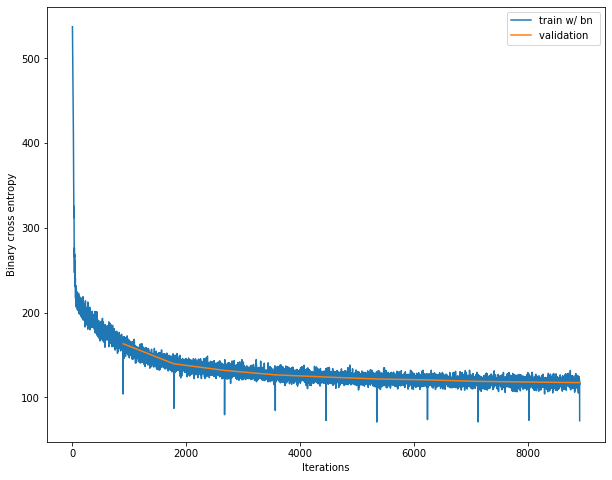

In [48]:
train_size = (1-validation_split)*dataset_size
n_steps = ceil(train_size/hparams['batch_size'])*hparams['num_epochs']
interval = ceil(train_size/hparams['batch_size'])
plt.figure(figsize=(10, 8))
plt.xlabel('Iterations')
plt.ylabel('Binary cross entropy')
train_losses=train_losses_b
val_losses= val_losses_b
plt.plot(range(1,len(train_losses)+1),train_losses, label='train w/ bn ')
plt.plot(range(1+interval,len(train_losses)+interval+1,interval),val_losses, label='validation ')

plt.legend()

Visualization of some results from the inference of MNIST images through the trained network.

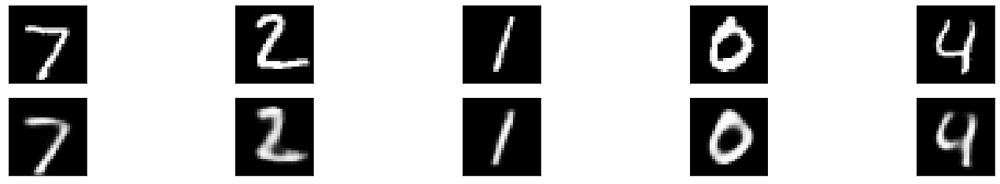

In [49]:
dataiter = iter(test_loader)
images, labels = dataiter.next()

best_net=network_unica
best_net.eval() 
best_net.to('cpu')
output,m,v = best_net(images)
images = images.numpy()
output = output.detach().numpy()

fig, axes = plt.subplots(nrows=2, ncols=5, sharex=True, sharey=True, figsize=(25,4))

for images, row in zip([images, output], axes):
    for img, ax in zip(images, row):
        ax.imshow(np.squeeze(img), cmap='gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

Visualization of some image reconstruction using the decoder of the VAE from the inference of standard normal noise vectors. Our objective has been accomplished, the images now look much more like handwritten digits than at the end of exercise 1, but they don't look like actual digits.

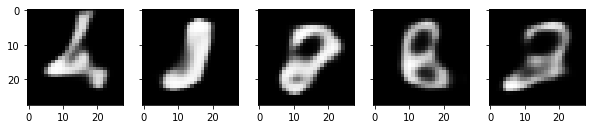

In [50]:
inputs_bottleneck = torch.randn(5,30)

net = network_unica.to('cpu')
net.eval()
outputs= net.decoder(inputs_bottleneck).detach().cpu().numpy()

num_inputs = inputs_bottleneck.shape[0]
fig, axes = plt.subplots(nrows=1, ncols=num_inputs, sharex=True, sharey=True, figsize=(10,4))
for i in range(num_inputs):
  axes[i].imshow(np.squeeze(outputs[i]), cmap='gray')
fig.show() 

## Optional exercise: Conditional Generative Adversial Networks

As was proposed, we started this exercise starting from the lab session number 10. In the lab, we created a generative adversial network, that from noise learned to generate images that looked like the ones present in the mnist dataset.

In this exercise, the goal was to have a **conditional** generative adversial network. So not only the networks is able to generate images that look like the ones in the mnist dataset, but they are also conditioned to a certain label, a certain number. So when you inject in the network a noise vector and a label, the network returns that digit handwritten.

To do so, we first declare some useful functions that we will use throught the exercise.

In [0]:
def norm_noise(size):
    return torch.cuda.FloatTensor(size, 100).normal_()

def random_label(size):
  return torch.cuda.LongTensor(size,1).random_(0, 10)

def init_weights(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1 or classname.find('BatchNorm') != -1:
        m.weight.data.normal_(0.00, 0.02)
  
def display_batch_images(img, imtype=np.uint8, unnormalize=True, nrows=None, mean=0.5, std=0.5):
    # select a sample or create grid if img is a batch
    if len(img.shape) == 4:
        nrows = nrows if nrows is not None else int(math.sqrt(img.size(0)))
        img = utils.make_grid(img, nrow=nrows)

    # unnormalize
    img = img.cpu().float()
    img = (img*std+mean)*255

    # to numpy
    image_numpy = img.numpy()
    image_numpy = np.transpose(image_numpy, (1, 2, 0))
    display(Image.fromarray(image_numpy.astype(imtype))) 

Then, we load the database the same way that it is done in the laboratory. It is reshaping the images to 32x32 and normalizing them.

In [0]:
def mnist():
    tf = transforms.Compose(
        [
            transforms.Resize(32, interpolation=0),
            transforms.ToTensor(),
            transforms.Normalize((0.5,), (.5,))
        ])
    return datasets.MNIST(root='./data/', train=True, transform=tf, download=True)

We then proceed to generate the data_loader using the whole train dataset.

In [0]:
hparams['batch_size']=100
data_loader = torch.utils.data.DataLoader(mnist(), batch_size=hparams['batch_size'], shuffle=True)

In generative adversial networks, the network consists on two main blocks: the generator and the discriminator

The generator is the one that is generating new images from noise and the label. From the vanilla GAN, we have added the label, and concatenated it after the noise.

In [0]:
class Generator(torch.nn.Module):
    
    def __init__(self):
        super(Generator, self).__init__()
        
        self.flatten=nn.Flatten()

        self.label_emb = nn.Embedding(10, 10)
        
        self.fc = torch.nn.Linear(100+10, 1024*4*4)

        self._conv1 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=1024, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )
        self._conv2 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )
        self._conv3 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=256, out_channels=1, kernel_size=4, stride=2, padding=1, bias=False),
            torch.nn.Tanh()
        )

    def forward(self, noise, labels): 
        x = self.flatten(noise)
        c = self.label_emb(labels)
        c = c.view(c.shape[0],-1)
        x = torch.cat([x, c], 1)
        x = self.fc(x)
        x = self._conv1(x.view(x.shape[0], 1024, 4, 4))
        x = self._conv2(x)
        return self._conv3(x)

The discriminator has two tasks: first to decide wheather the input image is from the database (real) or generated in the generator (fake) and second to decide if the image corresponds to the label.

To do so, we have also added the label, so it is concatenated after the image is passed through the convolutional network structure, and before the fully connected layer, specified for classification.

In [0]:
class Discriminator(torch.nn.Module):
    
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.flatten=nn.Flatten()

        self.label_emb = nn.Embedding(10, 10)


        self._conv_pre_1 = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self._conv_pre_2 = nn.Sequential(
            nn.Conv2d(in_channels=10, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self._conv1 = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self._conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self._conv3 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        self._fc = nn.Sequential(
            nn.Linear(512*4*4+10, 1),
            nn.Sigmoid()
        )

    def forward(self, x, labels):
        x = self._conv1(x)
        x = self._conv2(x)
        x = self._conv3(x)
        x = self.flatten(x)
        c = self.label_emb(labels)
        c = c.view(c.shape[0],-1)
        x = torch.cat([x, c], 1)
        x = self._fc(x)
        return x

In the following step, the whole model is declared. 
The model is formed by a generator and a discriminator. The generator generates images from noise and labels and tries to fool the discriminator that distinguishes between real and fake images.

As we have previously said, the input of the model is the noise and labels, so the output is a image that looks like the ones in the dataset conditioned to a certain label.

To acheive this behaviour, we had to add a third loss when optimizing the network. 
This third loss consist on passing through the discriminator some real samples with fake labels, so it learns to optimize for the true labels, and discriminate against the fake labels. 

In [0]:
class Model:    
    def __init__(self, batch_size):
        self._create_networks()
        self._create_optimizer()
        self._init_criterion(batch_size)
        
    def _create_networks(self):
        # create networks
        self._generator = Generator()
        self._discriminator = Discriminator()
        
        # init weights
        self._generator.apply(init_weights)
        self._discriminator.apply(init_weights)
        
        # move to cuda
        self._generator.cuda()
        self._discriminator.cuda()
        
    def _create_optimizer(self):
        # generator optimizer
        self._opt_g = torch.optim.Adam(self._generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
        
        # discriminator optimizer
        self._opt_d = torch.optim.Adam(self._discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
        
    def _init_criterion(self, batch_size):
        self._criterion = nn.BCELoss()
        self._label_real = Variable(torch.ones(batch_size, 1)).cuda()
        self._label_fake = Variable(torch.zeros(batch_size, 1)).cuda()
        
    # --------------------------
    # -- Generate Fake Samples & Fake Labels
    # --------------------------
    
    def generate_samples(self, batch_size, n=None, z=None):
        # sample random noise
        if z is None:
            z = norm_noise(batch_size)
        ## add the labels 
        if n is None:
          n = random_label(batch_size)
        # TODO: generate fake samples out of the random noise z and labels n
        noise_samples = self._generator(z,n) #aquí ja li hem passat al generador
        return noise_samples, n

    # --------------------------
    # -- Optimize Model
    # --------------------------
        
    def step_optimization(self, real_samples, real_labels, noise_labels, hparams):
        # generate fake samples
        fake_samples, noise_labels = self.generate_samples(real_samples.size(0))
       
        # optimize generator
        loss_g = self._step_opt_g(fake_samples, noise_labels)
        
        # optimize discriminator
        loss_d = self._step_opt_d(real_samples, real_labels, fake_samples.detach(), noise_labels)
        
        return loss_g, loss_d
      
    def _step_opt_g(self, fake_samples, fake_num_labels):
        # Reset gradients
        self._opt_g.zero_grad()
        
        # TODO: Calculate generator loss
        estim_fake = self._discriminator(fake_samples, fake_num_labels) 
        loss = self._criterion(estim_fake, self._label_real)
        loss.backward()
        
        # Update weights
        self._opt_g.step()
        
        return loss.item()
        
    def _step_opt_d(self, real_samples, real_labels, fake_samples, noise_labels): 
        # Reset gradients
        self._opt_d.zero_grad()

        # TODO: Calculate discriminator loss for real samples
        estim_real = self._discriminator(real_samples, real_labels)
        loss_real = self._criterion(estim_real, self._label_real)

        #TODO: new loss for discriminator loss for real images with fake labels
        noise_labels_fake = random_label(hparams['batch_size'])
        estim_fake_2 = self._discriminator(real_samples, noise_labels_fake)
        loss_fake_2 = self._criterion(estim_fake_2, self._label_fake)

        # TODO: Calculate discriminator loss for fake samples
        estim_fake = self._discriminator(fake_samples, noise_labels) #li hem afegit labels
        loss_fake = self._criterion(estim_fake, self._label_fake)
        
        # Total discriminator loss
        loss = (loss_real + loss_fake + loss_fake_2) / 3
        loss.backward()

        # Update weights
        self._opt_d.step()

        return loss_real.item(), loss_fake.item(), loss_fake_2.item()

Once everything is declared, we train the CGAN. We can see that the generated images keep improving at each epoch.

epoch: 0/15, batch: 0/600, G_loss: 0.6963157057762146, D_loss: (0.6976658701896667, 0.6901401281356812, 0.689322829246521)


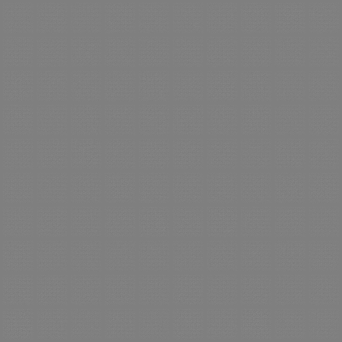

epoch: 0/15, batch: 10/600, G_loss: 0.8429265022277832, D_loss: (0.7546864151954651, 0.5631151795387268, 0.6355131268501282)
epoch: 0/15, batch: 20/600, G_loss: 1.0698240995407104, D_loss: (0.8370711803436279, 0.4204164147377014, 0.5648638010025024)
epoch: 0/15, batch: 30/600, G_loss: 1.4059669971466064, D_loss: (0.7608357071876526, 0.2813652455806732, 0.6339497566223145)
epoch: 0/15, batch: 40/600, G_loss: 1.8358999490737915, D_loss: (0.7337905168533325, 0.17415966093540192, 0.6511368751525879)
epoch: 0/15, batch: 50/600, G_loss: 2.265162229537964, D_loss: (0.6762191653251648, 0.10996432602405548, 0.7114415168762207)
epoch: 0/15, batch: 60/600, G_loss: 2.525148391723633, D_loss: (0.8476926684379578, 0.08384208381175995, 0.5654016733169556)
epoch: 0/15, batch: 70/600, G_loss: 2.7532248497009277, D_loss: (0.7029588222503662, 0.06622866541147232, 0.6885632276535034)
epoch: 0/15, batch: 80/600, G_loss: 2.982186794281006, D_loss: (0.7608874440193176, 0.05265970155596733, 0.6337457895278931

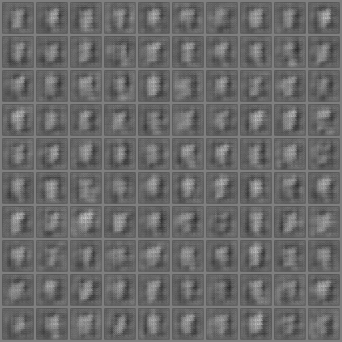

epoch: 0/15, batch: 110/600, G_loss: 3.234466791152954, D_loss: (0.7025290727615356, 0.04418794810771942, 0.6912119388580322)
epoch: 0/15, batch: 120/600, G_loss: 2.6059584617614746, D_loss: (0.7503232359886169, 0.07882639765739441, 0.6438535451889038)
epoch: 0/15, batch: 130/600, G_loss: 2.669466972351074, D_loss: (0.6612046957015991, 0.072836734354496, 0.7325826287269592)
epoch: 0/15, batch: 140/600, G_loss: 2.503697633743286, D_loss: (0.9794824719429016, 0.08760987222194672, 0.48017606139183044)
epoch: 0/15, batch: 150/600, G_loss: 3.1315014362335205, D_loss: (0.7760157585144043, 0.04548478499054909, 0.629362165927887)
epoch: 0/15, batch: 160/600, G_loss: 2.8246121406555176, D_loss: (0.8585357069969177, 0.06404227018356323, 0.5667827725410461)
epoch: 0/15, batch: 170/600, G_loss: 1.921608567237854, D_loss: (0.7892264723777771, 0.1594078093767166, 0.6155267953872681)
epoch: 0/15, batch: 180/600, G_loss: 2.1918535232543945, D_loss: (1.158754587173462, 0.11948581039905548, 0.3810363709

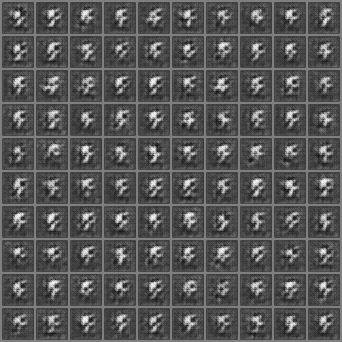

epoch: 0/15, batch: 210/600, G_loss: 3.2713623046875, D_loss: (0.7804903984069824, 0.03967718407511711, 0.6178200244903564)
epoch: 0/15, batch: 220/600, G_loss: 2.245894193649292, D_loss: (0.7243401408195496, 0.11488066613674164, 0.6636636257171631)
epoch: 0/15, batch: 230/600, G_loss: 3.380061626434326, D_loss: (0.9563054442405701, 0.03552716225385666, 0.4936671853065491)
epoch: 0/15, batch: 240/600, G_loss: 2.8587605953216553, D_loss: (0.6791907548904419, 0.06034226715564728, 0.7164090871810913)
epoch: 0/15, batch: 250/600, G_loss: 3.0426430702209473, D_loss: (0.9600949287414551, 0.04955020546913147, 0.4930064380168915)
epoch: 0/15, batch: 260/600, G_loss: 2.394735097885132, D_loss: (0.5834038257598877, 0.09770471602678299, 0.8212876915931702)
epoch: 0/15, batch: 270/600, G_loss: 2.020106554031372, D_loss: (0.6115671992301941, 0.14650902152061462, 0.791666567325592)
epoch: 0/15, batch: 280/600, G_loss: 1.937058925628662, D_loss: (0.7778315544128418, 0.15894681215286255, 0.62343114614

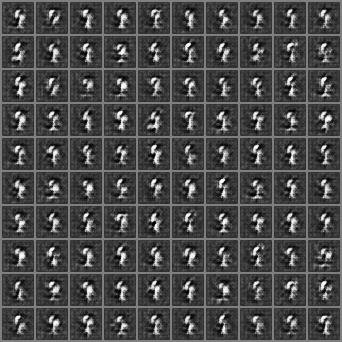

epoch: 0/15, batch: 310/600, G_loss: 2.6009676456451416, D_loss: (0.6836123466491699, 0.07885643094778061, 0.7173140645027161)
epoch: 0/15, batch: 320/600, G_loss: 2.509403944015503, D_loss: (0.7903911471366882, 0.08730235695838928, 0.6164267063140869)
epoch: 0/15, batch: 330/600, G_loss: 2.168755531311035, D_loss: (0.8018842935562134, 0.12386618554592133, 0.6123663187026978)
epoch: 0/15, batch: 340/600, G_loss: 3.084059238433838, D_loss: (1.0253115892410278, 0.04884428158402443, 0.4554176330566406)
epoch: 0/15, batch: 350/600, G_loss: 2.8048007488250732, D_loss: (1.0922141075134277, 0.06514343619346619, 0.4225371181964874)
epoch: 0/15, batch: 360/600, G_loss: 1.3673794269561768, D_loss: (0.4155219793319702, 0.3020085096359253, 1.0901141166687012)
epoch: 0/15, batch: 370/600, G_loss: 2.4216833114624023, D_loss: (0.6863630414009094, 0.09732378274202347, 0.7148599028587341)
epoch: 0/15, batch: 380/600, G_loss: 2.1219303607940674, D_loss: (0.6848189830780029, 0.13141827285289764, 0.718187

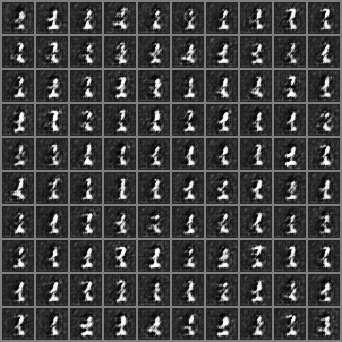

epoch: 0/15, batch: 410/600, G_loss: 3.230618953704834, D_loss: (1.0241892337799072, 0.04216264188289642, 0.45745158195495605)
epoch: 0/15, batch: 420/600, G_loss: 1.9154531955718994, D_loss: (0.9240974187850952, 0.16787146031856537, 0.5219444632530212)
epoch: 0/15, batch: 430/600, G_loss: 2.5948586463928223, D_loss: (0.824871838092804, 0.08003566414117813, 0.5909580588340759)
epoch: 0/15, batch: 440/600, G_loss: 2.423842668533325, D_loss: (0.7280286550521851, 0.09589695185422897, 0.6791548132896423)
epoch: 0/15, batch: 450/600, G_loss: 2.6237947940826416, D_loss: (0.7825549244880676, 0.0799068734049797, 0.6264669299125671)
epoch: 0/15, batch: 460/600, G_loss: 0.8932582139968872, D_loss: (0.4232601225376129, 0.5391838550567627, 1.073352336883545)
epoch: 0/15, batch: 470/600, G_loss: 1.3934738636016846, D_loss: (0.9189655184745789, 0.2903597354888916, 0.5171197056770325)
epoch: 0/15, batch: 480/600, G_loss: 1.806113600730896, D_loss: (0.9453563094139099, 0.1873423159122467, 0.5095862746

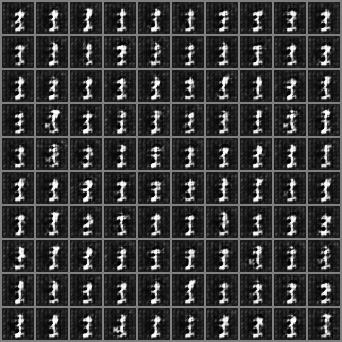

epoch: 0/15, batch: 510/600, G_loss: 1.9047850370407104, D_loss: (0.6427304744720459, 0.16499584913253784, 0.7607253789901733)
epoch: 0/15, batch: 520/600, G_loss: 1.9811538457870483, D_loss: (0.8217819929122925, 0.15581265091896057, 0.6035444736480713)
epoch: 0/15, batch: 530/600, G_loss: 2.2564656734466553, D_loss: (0.8709855675697327, 0.11484099179506302, 0.5572561025619507)
epoch: 0/15, batch: 540/600, G_loss: 2.0516130924224854, D_loss: (0.6513295769691467, 0.14209719002246857, 0.754909873008728)
epoch: 0/15, batch: 550/600, G_loss: 2.731808662414551, D_loss: (0.8866531848907471, 0.06913907825946808, 0.5489947199821472)
epoch: 0/15, batch: 560/600, G_loss: 2.248185873031616, D_loss: (0.6007136702537537, 0.11657805740833282, 0.8120285868644714)
epoch: 0/15, batch: 570/600, G_loss: 1.9785264730453491, D_loss: (0.8881028890609741, 0.15277010202407837, 0.5481314659118652)
epoch: 0/15, batch: 580/600, G_loss: 2.949380874633789, D_loss: (1.0079383850097656, 0.05539003387093544, 0.468856

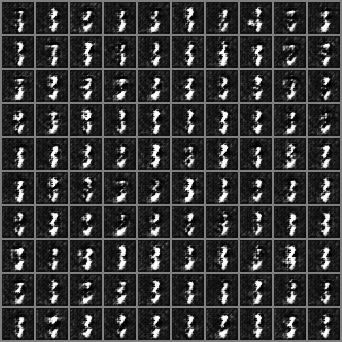

epoch: 1/15, batch: 10/600, G_loss: 2.800194025039673, D_loss: (1.0294201374053955, 0.06415114551782608, 0.45960572361946106)
epoch: 1/15, batch: 20/600, G_loss: 2.6929852962493896, D_loss: (0.9818747639656067, 0.07261265069246292, 0.4849218726158142)
epoch: 1/15, batch: 30/600, G_loss: 2.788252592086792, D_loss: (1.1135658025741577, 0.06592431664466858, 0.41473811864852905)
epoch: 1/15, batch: 40/600, G_loss: 1.327511191368103, D_loss: (0.47351309657096863, 0.3207165598869324, 0.9849052429199219)
epoch: 1/15, batch: 50/600, G_loss: 1.1346499919891357, D_loss: (0.4420144259929657, 0.3972610533237457, 1.0443075895309448)
epoch: 1/15, batch: 60/600, G_loss: 1.562022089958191, D_loss: (0.6286694407463074, 0.24279485642910004, 0.7738308906555176)
epoch: 1/15, batch: 70/600, G_loss: 2.8389391899108887, D_loss: (1.000366449356079, 0.06228123605251312, 0.47518494725227356)
epoch: 1/15, batch: 80/600, G_loss: 2.4671242237091064, D_loss: (0.8624826669692993, 0.0910664051771164, 0.56932657957077

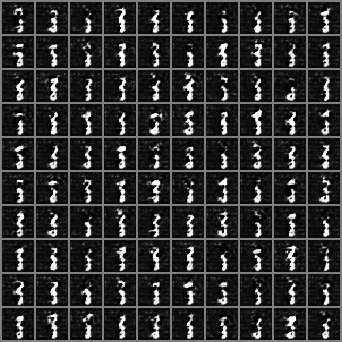

epoch: 1/15, batch: 110/600, G_loss: 2.137099504470825, D_loss: (0.9298157691955566, 0.12988081574440002, 0.5262822508811951)
epoch: 1/15, batch: 120/600, G_loss: 1.2437615394592285, D_loss: (0.49568307399749756, 0.3499033749103546, 0.9632164239883423)
epoch: 1/15, batch: 130/600, G_loss: 1.8572852611541748, D_loss: (0.6670721173286438, 0.17471067607402802, 0.738711416721344)
epoch: 1/15, batch: 140/600, G_loss: 1.969925045967102, D_loss: (0.8564984798431396, 0.1578492671251297, 0.5817757248878479)
epoch: 1/15, batch: 150/600, G_loss: 1.9008033275604248, D_loss: (0.6910446882247925, 0.1658257097005844, 0.7238243818283081)
epoch: 1/15, batch: 160/600, G_loss: 2.014986515045166, D_loss: (0.7761207818984985, 0.15092504024505615, 0.6340570449829102)
epoch: 1/15, batch: 170/600, G_loss: 2.8274927139282227, D_loss: (1.133009433746338, 0.06431183218955994, 0.4072685241699219)
epoch: 1/15, batch: 180/600, G_loss: 1.7372462749481201, D_loss: (0.6793125867843628, 0.2027784138917923, 0.7301164865

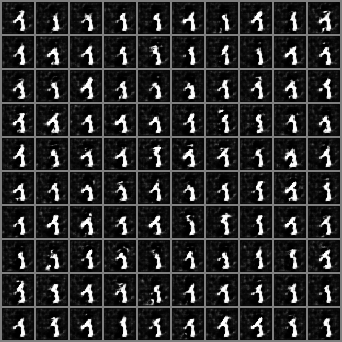

epoch: 1/15, batch: 210/600, G_loss: 2.5980358123779297, D_loss: (0.9199311137199402, 0.08088947087526321, 0.5427801012992859)
epoch: 1/15, batch: 220/600, G_loss: 2.870149850845337, D_loss: (1.2257641553878784, 0.06087879836559296, 0.36825329065322876)
epoch: 1/15, batch: 230/600, G_loss: 2.0988330841064453, D_loss: (0.8428832292556763, 0.13937076926231384, 0.5896085500717163)
epoch: 1/15, batch: 240/600, G_loss: 1.4872965812683105, D_loss: (0.6294801831245422, 0.2646096348762512, 0.7932690382003784)
epoch: 1/15, batch: 250/600, G_loss: 2.0324552059173584, D_loss: (0.6680599451065063, 0.14702852070331573, 0.7485134601593018)
epoch: 1/15, batch: 260/600, G_loss: 1.6958227157592773, D_loss: (0.7677260041236877, 0.2086094468832016, 0.6481810212135315)
epoch: 1/15, batch: 270/600, G_loss: 2.32295298576355, D_loss: (0.9001228213310242, 0.10687224566936493, 0.547228991985321)
epoch: 1/15, batch: 280/600, G_loss: 2.6761674880981445, D_loss: (1.303727149963379, 0.07316232472658157, 0.33826982

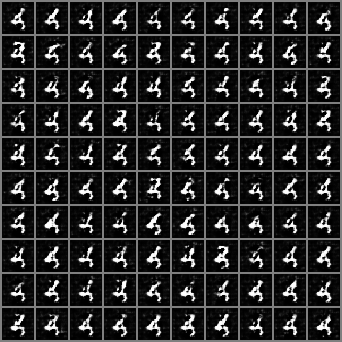

epoch: 1/15, batch: 310/600, G_loss: 2.0476760864257812, D_loss: (0.8149250149726868, 0.1449415236711502, 0.6159953474998474)
epoch: 1/15, batch: 320/600, G_loss: 1.9584834575653076, D_loss: (1.0475212335586548, 0.1590145230293274, 0.4513916075229645)
epoch: 1/15, batch: 330/600, G_loss: 1.6714205741882324, D_loss: (0.6923432350158691, 0.21600407361984253, 0.724905252456665)
epoch: 1/15, batch: 340/600, G_loss: 1.4957318305969238, D_loss: (0.6197407245635986, 0.2655050754547119, 0.815239667892456)
epoch: 1/15, batch: 350/600, G_loss: 2.1111338138580322, D_loss: (0.9300433993339539, 0.13303130865097046, 0.5309023857116699)
epoch: 1/15, batch: 360/600, G_loss: 1.0197099447250366, D_loss: (0.5027833580970764, 0.4715569317340851, 0.9655093550682068)
epoch: 1/15, batch: 370/600, G_loss: 1.7829315662384033, D_loss: (0.8381473422050476, 0.19057729840278625, 0.5954719185829163)
epoch: 1/15, batch: 380/600, G_loss: 1.856689453125, D_loss: (0.8028420805931091, 0.1754889041185379, 0.6264864206314

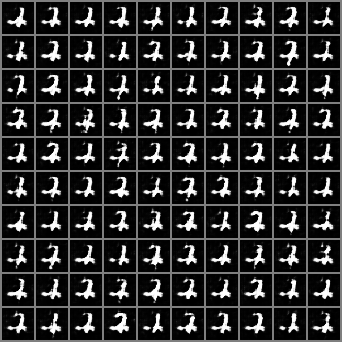

epoch: 1/15, batch: 410/600, G_loss: 2.31797194480896, D_loss: (1.0514694452285767, 0.1099451556801796, 0.4568820893764496)
epoch: 1/15, batch: 420/600, G_loss: 2.500122547149658, D_loss: (1.156699776649475, 0.09102988988161087, 0.40462493896484375)
epoch: 1/15, batch: 430/600, G_loss: 1.8836766481399536, D_loss: (0.8113428354263306, 0.17319899797439575, 0.6068382859230042)
epoch: 1/15, batch: 440/600, G_loss: 2.149402379989624, D_loss: (0.9290614128112793, 0.13651232421398163, 0.5384858846664429)
epoch: 1/15, batch: 450/600, G_loss: 1.879459261894226, D_loss: (0.8370925784111023, 0.1735358089208603, 0.5941368937492371)
epoch: 1/15, batch: 460/600, G_loss: 2.0901808738708496, D_loss: (0.9606196880340576, 0.14077657461166382, 0.5116177797317505)
epoch: 1/15, batch: 470/600, G_loss: 1.257678747177124, D_loss: (0.5820677280426025, 0.34995025396347046, 0.8629463315010071)
epoch: 1/15, batch: 480/600, G_loss: 2.202097177505493, D_loss: (1.036469578742981, 0.12441668659448624, 0.467325866222

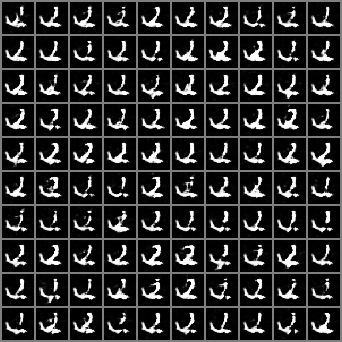

epoch: 1/15, batch: 510/600, G_loss: 1.5408498048782349, D_loss: (0.5205994248390198, 0.2533023953437805, 0.9294142723083496)
epoch: 1/15, batch: 520/600, G_loss: 2.5850467681884766, D_loss: (1.2570878267288208, 0.08279411494731903, 0.35874706506729126)
epoch: 1/15, batch: 530/600, G_loss: 1.850606083869934, D_loss: (0.8966079950332642, 0.177416130900383, 0.550864577293396)
epoch: 1/15, batch: 540/600, G_loss: 2.175499677658081, D_loss: (1.0125775337219238, 0.12854400277137756, 0.4813484847545624)
epoch: 1/15, batch: 550/600, G_loss: 2.0355825424194336, D_loss: (0.7967314720153809, 0.14836600422859192, 0.6281607747077942)
epoch: 1/15, batch: 560/600, G_loss: 1.4637303352355957, D_loss: (0.6752235293388367, 0.28125303983688354, 0.7420800924301147)
epoch: 1/15, batch: 570/600, G_loss: 1.9558650255203247, D_loss: (0.7562568187713623, 0.16443891823291779, 0.6657727956771851)
epoch: 1/15, batch: 580/600, G_loss: 1.4014149904251099, D_loss: (0.6432198286056519, 0.2975156903266907, 0.78552848

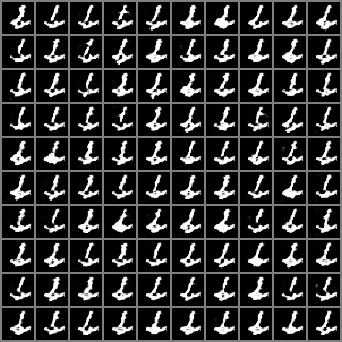

epoch: 2/15, batch: 10/600, G_loss: 1.9233832359313965, D_loss: (0.7909752130508423, 0.1666264533996582, 0.6322019696235657)
epoch: 2/15, batch: 20/600, G_loss: 2.0240519046783447, D_loss: (0.9106641411781311, 0.15249405801296234, 0.5443080067634583)
epoch: 2/15, batch: 30/600, G_loss: 2.2642242908477783, D_loss: (0.8782786726951599, 0.11656945943832397, 0.5692852139472961)
epoch: 2/15, batch: 40/600, G_loss: 1.4570904970169067, D_loss: (0.6840009093284607, 0.2805549204349518, 0.7388750314712524)
epoch: 2/15, batch: 50/600, G_loss: 2.297799587249756, D_loss: (1.2258729934692383, 0.11016957461833954, 0.3658280670642853)
epoch: 2/15, batch: 60/600, G_loss: 2.2094173431396484, D_loss: (1.0529742240905762, 0.1251170039176941, 0.4638708531856537)
epoch: 2/15, batch: 70/600, G_loss: 1.9053528308868408, D_loss: (0.8245052099227905, 0.17407946288585663, 0.5991560220718384)
epoch: 2/15, batch: 80/600, G_loss: 1.5415858030319214, D_loss: (0.6402194499969482, 0.252382755279541, 0.7735717296600342

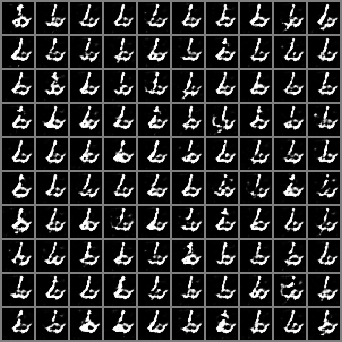

epoch: 2/15, batch: 110/600, G_loss: 2.8011398315429688, D_loss: (1.260623574256897, 0.06655504554510117, 0.3547774851322174)
epoch: 2/15, batch: 120/600, G_loss: 1.9410004615783691, D_loss: (0.8781617879867554, 0.16596058011054993, 0.5626392960548401)
epoch: 2/15, batch: 130/600, G_loss: 1.6438411474227905, D_loss: (0.6809666156768799, 0.23402296006679535, 0.7457714676856995)
epoch: 2/15, batch: 140/600, G_loss: 1.6616548299789429, D_loss: (0.77669358253479, 0.22196252644062042, 0.6522244811058044)
epoch: 2/15, batch: 150/600, G_loss: 2.4282844066619873, D_loss: (1.2056097984313965, 0.09811268001794815, 0.38000938296318054)
epoch: 2/15, batch: 160/600, G_loss: 1.8011271953582764, D_loss: (0.6981787085533142, 0.19026659429073334, 0.7275246977806091)
epoch: 2/15, batch: 170/600, G_loss: 2.1769726276397705, D_loss: (0.7810553908348083, 0.12930573523044586, 0.6467352509498596)
epoch: 2/15, batch: 180/600, G_loss: 2.5858047008514404, D_loss: (1.1339612007141113, 0.08292067795991898, 0.4206

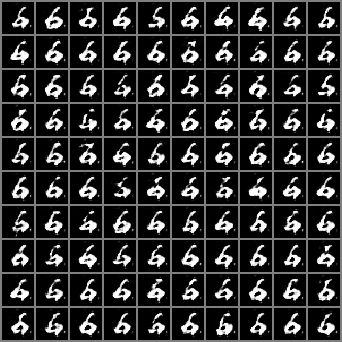

epoch: 2/15, batch: 210/600, G_loss: 2.5127665996551514, D_loss: (1.2732300758361816, 0.0911155492067337, 0.34941786527633667)
epoch: 2/15, batch: 220/600, G_loss: 1.896592140197754, D_loss: (0.8267502784729004, 0.1715104877948761, 0.6090081930160522)
epoch: 2/15, batch: 230/600, G_loss: 1.8685706853866577, D_loss: (0.7571061849594116, 0.17602115869522095, 0.6719467043876648)
epoch: 2/15, batch: 240/600, G_loss: 1.8767279386520386, D_loss: (0.9627334475517273, 0.1739596128463745, 0.513370931148529)
epoch: 2/15, batch: 250/600, G_loss: 1.9827402830123901, D_loss: (0.9250813126564026, 0.15788349509239197, 0.5347380042076111)
epoch: 2/15, batch: 260/600, G_loss: 1.579356074333191, D_loss: (0.7117217183113098, 0.2444808930158615, 0.702258825302124)
epoch: 2/15, batch: 270/600, G_loss: 2.3744285106658936, D_loss: (1.0003646612167358, 0.10367801785469055, 0.4898756146430969)
epoch: 2/15, batch: 280/600, G_loss: 1.841522216796875, D_loss: (0.8193202018737793, 0.18194904923439026, 0.6143800616

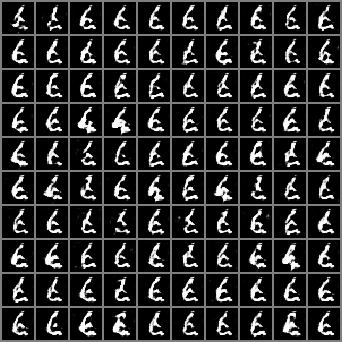

epoch: 2/15, batch: 310/600, G_loss: 2.020744562149048, D_loss: (1.0192527770996094, 0.15193574130535126, 0.4833686947822571)
epoch: 2/15, batch: 320/600, G_loss: 1.6602689027786255, D_loss: (0.6848160624504089, 0.22627359628677368, 0.7396227121353149)
epoch: 2/15, batch: 330/600, G_loss: 1.8996957540512085, D_loss: (0.7466965317726135, 0.17328549921512604, 0.6735822558403015)
epoch: 2/15, batch: 340/600, G_loss: 2.0460801124572754, D_loss: (0.8567779064178467, 0.14922891557216644, 0.5862793326377869)
epoch: 2/15, batch: 350/600, G_loss: 1.8483752012252808, D_loss: (0.8714784979820251, 0.18240396678447723, 0.5645875334739685)
epoch: 2/15, batch: 360/600, G_loss: 1.3121681213378906, D_loss: (0.5312085151672363, 0.3277674615383148, 0.9283093810081482)
epoch: 2/15, batch: 370/600, G_loss: 1.9970494508743286, D_loss: (0.8599808216094971, 0.15603137016296387, 0.5909379124641418)
epoch: 2/15, batch: 380/600, G_loss: 0.9031063318252563, D_loss: (0.493744432926178, 0.5444804430007935, 0.975969

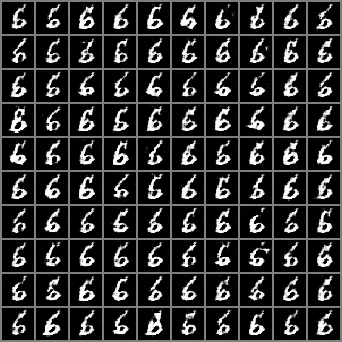

epoch: 2/15, batch: 410/600, G_loss: 2.0408966541290283, D_loss: (1.013950228691101, 0.14541839063167572, 0.4812690019607544)
epoch: 2/15, batch: 420/600, G_loss: 2.42252779006958, D_loss: (1.1243085861206055, 0.09793306142091751, 0.4143257439136505)
epoch: 2/15, batch: 430/600, G_loss: 1.9559931755065918, D_loss: (0.9092190265655518, 0.1620841771364212, 0.5474488735198975)
epoch: 2/15, batch: 440/600, G_loss: 1.8193527460098267, D_loss: (0.9680724143981934, 0.18861064314842224, 0.4996189773082733)
epoch: 2/15, batch: 450/600, G_loss: 1.711431860923767, D_loss: (0.7825176119804382, 0.21124544739723206, 0.6416866183280945)
epoch: 2/15, batch: 460/600, G_loss: 2.2272541522979736, D_loss: (1.1486722230911255, 0.12376240640878677, 0.412801593542099)
epoch: 2/15, batch: 470/600, G_loss: 2.089146375656128, D_loss: (1.0062798261642456, 0.13992562890052795, 0.4932917654514313)
epoch: 2/15, batch: 480/600, G_loss: 1.8445618152618408, D_loss: (0.8306623101234436, 0.1825188845396042, 0.6014435291

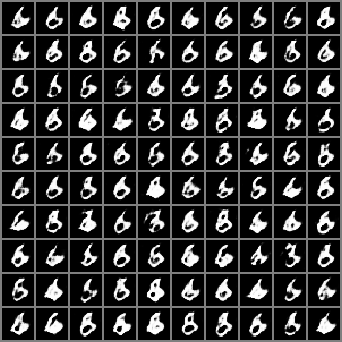

epoch: 2/15, batch: 510/600, G_loss: 2.2315218448638916, D_loss: (1.1007834672927856, 0.12501806020736694, 0.44195157289505005)
epoch: 2/15, batch: 520/600, G_loss: 1.7178258895874023, D_loss: (0.8278457522392273, 0.21272018551826477, 0.6032493710517883)
epoch: 2/15, batch: 530/600, G_loss: 1.9588208198547363, D_loss: (1.0242196321487427, 0.16144804656505585, 0.4673527181148529)
epoch: 2/15, batch: 540/600, G_loss: 1.8257839679718018, D_loss: (0.7459728717803955, 0.1898575723171234, 0.666110098361969)
epoch: 2/15, batch: 550/600, G_loss: 1.970933437347412, D_loss: (0.9483922719955444, 0.16140364110469818, 0.517676830291748)
epoch: 2/15, batch: 560/600, G_loss: 2.164907455444336, D_loss: (0.9442955255508423, 0.1279739886522293, 0.5314256548881531)
epoch: 2/15, batch: 570/600, G_loss: 4.2200398445129395, D_loss: (3.136960029602051, 0.01601545698940754, 0.04725038632750511)
epoch: 2/15, batch: 580/600, G_loss: 1.3869537115097046, D_loss: (0.8928983211517334, 0.29886314272880554, 0.5439972

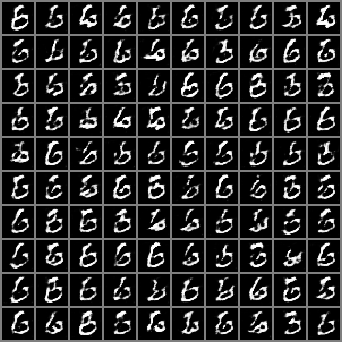

epoch: 3/15, batch: 10/600, G_loss: 1.7738888263702393, D_loss: (0.8650981783866882, 0.20329678058624268, 0.5746597051620483)
epoch: 3/15, batch: 20/600, G_loss: 1.589809536933899, D_loss: (0.8507084846496582, 0.24286170303821564, 0.5924192667007446)
epoch: 3/15, batch: 30/600, G_loss: 1.1904492378234863, D_loss: (0.5718213319778442, 0.3831186592578888, 0.8744545578956604)
epoch: 3/15, batch: 40/600, G_loss: 2.0405311584472656, D_loss: (1.017248272895813, 0.15010669827461243, 0.4808000922203064)
epoch: 3/15, batch: 50/600, G_loss: 1.603225588798523, D_loss: (0.7290406823158264, 0.24052661657333374, 0.6856152415275574)
epoch: 3/15, batch: 60/600, G_loss: 1.7417514324188232, D_loss: (0.7583798170089722, 0.20173513889312744, 0.6620925068855286)
epoch: 3/15, batch: 70/600, G_loss: 2.956608295440674, D_loss: (1.5709075927734375, 0.06046117842197418, 0.2519378364086151)
epoch: 3/15, batch: 80/600, G_loss: 1.8692370653152466, D_loss: (0.9462636709213257, 0.1758103370666504, 0.5197286009788513

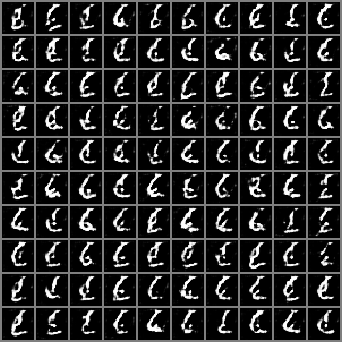

epoch: 3/15, batch: 110/600, G_loss: 1.994462013244629, D_loss: (0.9120944142341614, 0.15640711784362793, 0.5293452739715576)
epoch: 3/15, batch: 120/600, G_loss: 2.240401029586792, D_loss: (1.1256160736083984, 0.12199614197015762, 0.4204833209514618)
epoch: 3/15, batch: 130/600, G_loss: 1.7411935329437256, D_loss: (0.8135423064231873, 0.20528867840766907, 0.6097576022148132)
epoch: 3/15, batch: 140/600, G_loss: 1.4995840787887573, D_loss: (0.8392508029937744, 0.27662986516952515, 0.601688027381897)
epoch: 3/15, batch: 150/600, G_loss: 1.6349859237670898, D_loss: (0.9525964260101318, 0.2317875474691391, 0.512413740158081)
epoch: 3/15, batch: 160/600, G_loss: 1.751969575881958, D_loss: (1.0966660976409912, 0.19999994337558746, 0.4427151381969452)
epoch: 3/15, batch: 170/600, G_loss: 2.314995050430298, D_loss: (1.1142576932907104, 0.11078933626413345, 0.41939777135849)
epoch: 3/15, batch: 180/600, G_loss: 1.7007156610488892, D_loss: (0.7500706315040588, 0.21094252169132233, 0.66340100765

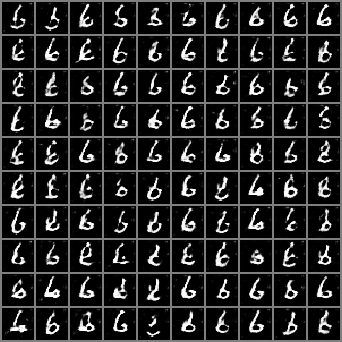

epoch: 3/15, batch: 210/600, G_loss: 1.3236050605773926, D_loss: (0.8262664079666138, 0.3250833749771118, 0.6056901812553406)
epoch: 3/15, batch: 220/600, G_loss: 1.0595712661743164, D_loss: (0.479807585477829, 0.45038041472435, 0.9991220235824585)
epoch: 3/15, batch: 230/600, G_loss: 1.690578579902649, D_loss: (0.8906128406524658, 0.21657590568065643, 0.5502368807792664)
epoch: 3/15, batch: 240/600, G_loss: 1.7140884399414062, D_loss: (1.0190620422363281, 0.21136748790740967, 0.4712863862514496)
epoch: 3/15, batch: 250/600, G_loss: 2.1920852661132812, D_loss: (0.9444023966789246, 0.1271304488182068, 0.5211925506591797)
epoch: 3/15, batch: 260/600, G_loss: 1.6014949083328247, D_loss: (0.8640286326408386, 0.23857824504375458, 0.5774194002151489)
epoch: 3/15, batch: 270/600, G_loss: 1.7441366910934448, D_loss: (0.7865012288093567, 0.20416077971458435, 0.635031521320343)
epoch: 3/15, batch: 280/600, G_loss: 2.019314765930176, D_loss: (1.0604909658432007, 0.15167559683322906, 0.45280292630

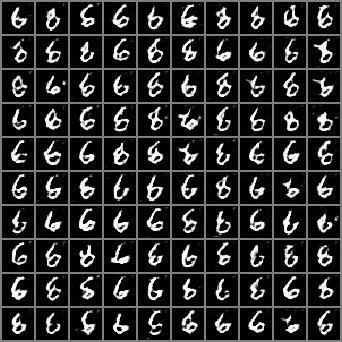

epoch: 3/15, batch: 310/600, G_loss: 1.815132737159729, D_loss: (1.048661708831787, 0.18809939920902252, 0.4604632556438446)
epoch: 3/15, batch: 320/600, G_loss: 1.8604135513305664, D_loss: (0.9603683352470398, 0.18191447854042053, 0.5056192278862)
epoch: 3/15, batch: 330/600, G_loss: 1.5572624206542969, D_loss: (0.5746204257011414, 0.2567855417728424, 0.8727385997772217)
epoch: 3/15, batch: 340/600, G_loss: 1.4442275762557983, D_loss: (1.0547049045562744, 0.2835938632488251, 0.4450205862522125)
epoch: 3/15, batch: 350/600, G_loss: 1.5353349447250366, D_loss: (0.9593967199325562, 0.25714436173439026, 0.5086705088615417)
epoch: 3/15, batch: 360/600, G_loss: 1.5111665725708008, D_loss: (0.849388599395752, 0.26190415024757385, 0.5800138711929321)
epoch: 3/15, batch: 370/600, G_loss: 1.4719362258911133, D_loss: (0.8649754524230957, 0.2778710722923279, 0.589118480682373)
epoch: 3/15, batch: 380/600, G_loss: 1.5985625982284546, D_loss: (0.955142617225647, 0.23435430228710175, 0.5048509836196

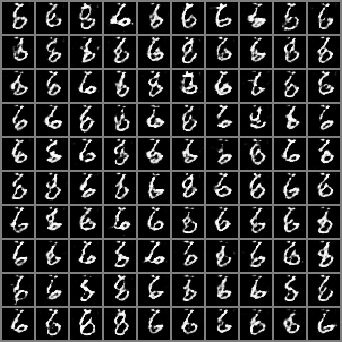

epoch: 3/15, batch: 410/600, G_loss: 1.6937036514282227, D_loss: (0.9634473919868469, 0.21576200425624847, 0.5115795731544495)
epoch: 3/15, batch: 420/600, G_loss: 1.798691749572754, D_loss: (0.9629259705543518, 0.19687476754188538, 0.5248481631278992)
epoch: 3/15, batch: 430/600, G_loss: 1.638503909111023, D_loss: (0.7364054322242737, 0.2314879298210144, 0.6854966878890991)
epoch: 3/15, batch: 440/600, G_loss: 1.785631537437439, D_loss: (0.980238139629364, 0.19402265548706055, 0.4936680495738983)
epoch: 3/15, batch: 450/600, G_loss: 1.5861438512802124, D_loss: (0.6518355011940002, 0.2416607141494751, 0.7726913690567017)
epoch: 3/15, batch: 460/600, G_loss: 1.5614570379257202, D_loss: (0.815151035785675, 0.2543192207813263, 0.6221382021903992)
epoch: 3/15, batch: 470/600, G_loss: 1.5633753538131714, D_loss: (0.8740402460098267, 0.2526651620864868, 0.5717515349388123)
epoch: 3/15, batch: 480/600, G_loss: 1.641453504562378, D_loss: (0.7765694260597229, 0.22698992490768433, 0.635338187217

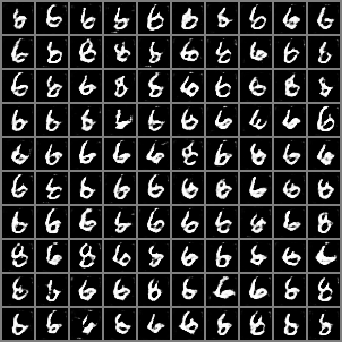

epoch: 3/15, batch: 510/600, G_loss: 1.7465031147003174, D_loss: (0.8793942928314209, 0.20194560289382935, 0.5643736124038696)
epoch: 3/15, batch: 520/600, G_loss: 2.3088772296905518, D_loss: (1.3473353385925293, 0.11114566773176193, 0.32056769728660583)
epoch: 3/15, batch: 530/600, G_loss: 1.3520636558532715, D_loss: (0.7792675495147705, 0.3144717514514923, 0.6508244872093201)
epoch: 3/15, batch: 540/600, G_loss: 2.2757396697998047, D_loss: (1.3083736896514893, 0.11686019599437714, 0.3391861617565155)
epoch: 3/15, batch: 550/600, G_loss: 2.1445748805999756, D_loss: (1.029590368270874, 0.13378198444843292, 0.46021607518196106)
epoch: 3/15, batch: 560/600, G_loss: 1.8225226402282715, D_loss: (0.9641115665435791, 0.18690668046474457, 0.5073734521865845)
epoch: 3/15, batch: 570/600, G_loss: 1.8910642862319946, D_loss: (0.927300214767456, 0.17506033182144165, 0.5322252511978149)
epoch: 3/15, batch: 580/600, G_loss: 1.8437434434890747, D_loss: (1.0445181131362915, 0.18565185368061066, 0.458

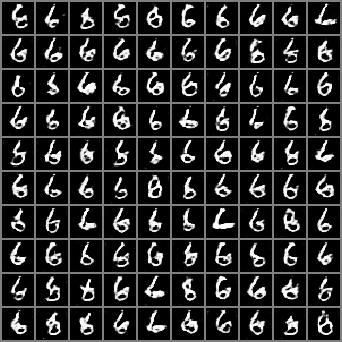

epoch: 4/15, batch: 10/600, G_loss: 1.8978804349899292, D_loss: (0.9947590827941895, 0.17377378046512604, 0.4951593279838562)
epoch: 4/15, batch: 20/600, G_loss: 1.4845691919326782, D_loss: (0.7190697193145752, 0.2718285322189331, 0.6993282437324524)
epoch: 4/15, batch: 30/600, G_loss: 1.2460548877716064, D_loss: (0.5490096807479858, 0.35682472586631775, 0.8984441161155701)
epoch: 4/15, batch: 40/600, G_loss: 2.180408000946045, D_loss: (1.162996768951416, 0.12951616942882538, 0.4016793966293335)
epoch: 4/15, batch: 50/600, G_loss: 1.852396845817566, D_loss: (0.8848378658294678, 0.17968735098838806, 0.5632054805755615)
epoch: 4/15, batch: 60/600, G_loss: 1.6383452415466309, D_loss: (0.8386317491531372, 0.23019714653491974, 0.5945049524307251)
epoch: 4/15, batch: 70/600, G_loss: 2.7000343799591064, D_loss: (1.6827077865600586, 0.07390838861465454, 0.21802955865859985)
epoch: 4/15, batch: 80/600, G_loss: 1.6684067249298096, D_loss: (0.9146915674209595, 0.21805918216705322, 0.5299046039581

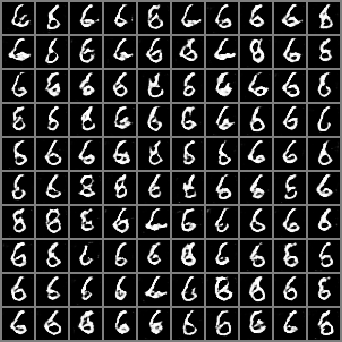

epoch: 4/15, batch: 110/600, G_loss: 1.6266326904296875, D_loss: (0.9315127730369568, 0.23658080399036407, 0.5178960561752319)
epoch: 4/15, batch: 120/600, G_loss: 2.4499313831329346, D_loss: (1.2003663778305054, 0.09975076466798782, 0.37822219729423523)
epoch: 4/15, batch: 130/600, G_loss: 1.6192148923873901, D_loss: (0.8496363759040833, 0.23553262650966644, 0.600246787071228)
epoch: 4/15, batch: 140/600, G_loss: 2.0875072479248047, D_loss: (0.9269501566886902, 0.14097999036312103, 0.5330469012260437)
epoch: 4/15, batch: 150/600, G_loss: 0.8600739240646362, D_loss: (0.4307326078414917, 0.5777689218521118, 1.0989371538162231)
epoch: 4/15, batch: 160/600, G_loss: 1.8762619495391846, D_loss: (1.296714425086975, 0.17657268047332764, 0.3374512493610382)
epoch: 4/15, batch: 170/600, G_loss: 1.57210373878479, D_loss: (0.8545058369636536, 0.24469096958637238, 0.5729469060897827)
epoch: 4/15, batch: 180/600, G_loss: 1.5759823322296143, D_loss: (0.6895700097084045, 0.24431997537612915, 0.730799

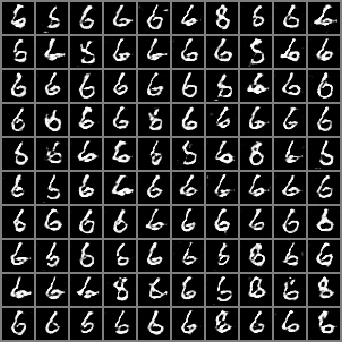

epoch: 4/15, batch: 210/600, G_loss: 2.0476784706115723, D_loss: (1.3035050630569458, 0.1469326615333557, 0.3357453942298889)
epoch: 4/15, batch: 220/600, G_loss: 3.353935956954956, D_loss: (2.4410789012908936, 0.03870988264679909, 0.09941097348928452)
epoch: 4/15, batch: 230/600, G_loss: 1.502690315246582, D_loss: (0.9730038642883301, 0.26769429445266724, 0.5022705793380737)
epoch: 4/15, batch: 240/600, G_loss: 1.5817804336547852, D_loss: (0.897083580493927, 0.2451467663049698, 0.5591068863868713)
epoch: 4/15, batch: 250/600, G_loss: 1.8939703702926636, D_loss: (1.1268178224563599, 0.17427581548690796, 0.41797715425491333)
epoch: 4/15, batch: 260/600, G_loss: 2.0067179203033447, D_loss: (1.2137030363082886, 0.15523335337638855, 0.37387615442276)
epoch: 4/15, batch: 270/600, G_loss: 1.7164279222488403, D_loss: (0.9137995839118958, 0.20720060169696808, 0.5287517309188843)
epoch: 4/15, batch: 280/600, G_loss: 1.773675799369812, D_loss: (1.0326133966445923, 0.1966927945613861, 0.467775791

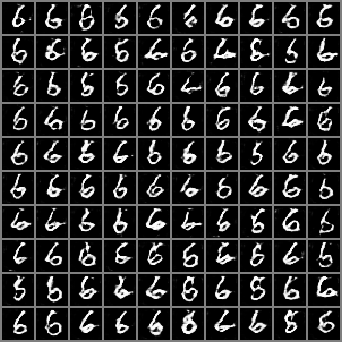

epoch: 4/15, batch: 310/600, G_loss: 1.734108328819275, D_loss: (0.901506245136261, 0.2073017656803131, 0.5539445281028748)
epoch: 4/15, batch: 320/600, G_loss: 1.8425233364105225, D_loss: (1.0173251628875732, 0.18470682203769684, 0.4835057854652405)
epoch: 4/15, batch: 330/600, G_loss: 1.9217591285705566, D_loss: (1.0794081687927246, 0.17027106881141663, 0.44531944394111633)
epoch: 4/15, batch: 340/600, G_loss: 1.848439335823059, D_loss: (1.1025395393371582, 0.1824362426996231, 0.43743252754211426)
epoch: 4/15, batch: 350/600, G_loss: 1.993557333946228, D_loss: (1.1474462747573853, 0.157626673579216, 0.40096819400787354)
epoch: 4/15, batch: 360/600, G_loss: 2.746673345565796, D_loss: (1.424360990524292, 0.07111109048128128, 0.292280912399292)
epoch: 4/15, batch: 370/600, G_loss: 1.651007056236267, D_loss: (0.9544268250465393, 0.22429029643535614, 0.5124475955963135)
epoch: 4/15, batch: 380/600, G_loss: 1.631096363067627, D_loss: (0.9116268157958984, 0.2343580275774002, 0.5348705649375

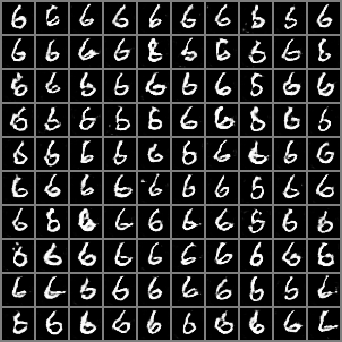

epoch: 4/15, batch: 410/600, G_loss: 1.5193668603897095, D_loss: (0.9544277787208557, 0.2589794099330902, 0.5165448188781738)
epoch: 4/15, batch: 420/600, G_loss: 1.6383553743362427, D_loss: (0.9968159198760986, 0.23263339698314667, 0.48741039633750916)
epoch: 4/15, batch: 430/600, G_loss: 1.5697600841522217, D_loss: (0.9887210726737976, 0.2499074935913086, 0.4946044087409973)
epoch: 4/15, batch: 440/600, G_loss: 2.343751907348633, D_loss: (1.3392640352249146, 0.10717480629682541, 0.32762476801872253)
epoch: 4/15, batch: 450/600, G_loss: 1.6172751188278198, D_loss: (1.0277416706085205, 0.23428098857402802, 0.4709304869174957)
epoch: 4/15, batch: 460/600, G_loss: 1.8321146965026855, D_loss: (1.0539878606796265, 0.18612587451934814, 0.46332472562789917)
epoch: 4/15, batch: 470/600, G_loss: 1.8973305225372314, D_loss: (1.0900381803512573, 0.17096377909183502, 0.42858028411865234)
epoch: 4/15, batch: 480/600, G_loss: 2.190990686416626, D_loss: (1.3374300003051758, 0.12889982759952545, 0.32

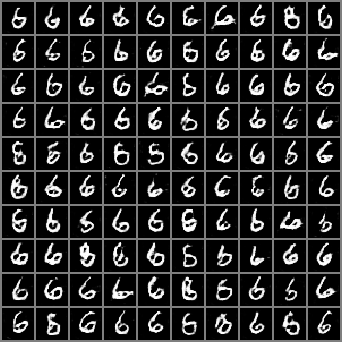

epoch: 4/15, batch: 510/600, G_loss: 1.3852359056472778, D_loss: (0.7686553001403809, 0.3079819977283478, 0.6619124412536621)
epoch: 4/15, batch: 520/600, G_loss: 1.543297290802002, D_loss: (0.8863500952720642, 0.25304850935935974, 0.5552464723587036)
epoch: 4/15, batch: 530/600, G_loss: 2.030378818511963, D_loss: (1.1566652059555054, 0.14934402704238892, 0.4094133675098419)
epoch: 4/15, batch: 540/600, G_loss: 1.50040602684021, D_loss: (1.012893795967102, 0.2674463987350464, 0.4764437973499298)
epoch: 4/15, batch: 550/600, G_loss: 1.6763510704040527, D_loss: (0.9968231916427612, 0.21732200682163239, 0.4842488169670105)
epoch: 4/15, batch: 560/600, G_loss: 1.395501971244812, D_loss: (0.7447525858879089, 0.2978701889514923, 0.6742466688156128)
epoch: 4/15, batch: 570/600, G_loss: 1.8931825160980225, D_loss: (0.9877190589904785, 0.17525789141654968, 0.49776583909988403)
epoch: 4/15, batch: 580/600, G_loss: 1.7008793354034424, D_loss: (0.86127769947052, 0.21145597100257874, 0.587996184825

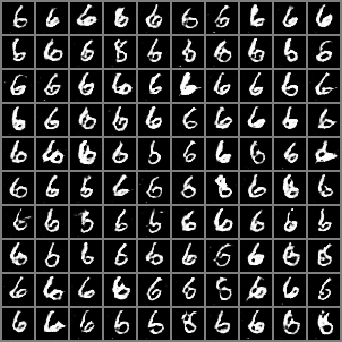

epoch: 5/15, batch: 10/600, G_loss: 1.780267596244812, D_loss: (1.0453146696090698, 0.1974538415670395, 0.4510076940059662)
epoch: 5/15, batch: 20/600, G_loss: 2.520547389984131, D_loss: (1.9095572233200073, 0.09148897230625153, 0.17406925559043884)
epoch: 5/15, batch: 30/600, G_loss: 1.505475640296936, D_loss: (1.1847807168960571, 0.265121191740036, 0.38567879796028137)
epoch: 5/15, batch: 40/600, G_loss: 1.4347819089889526, D_loss: (1.096325397491455, 0.2808972895145416, 0.42420533299446106)
epoch: 5/15, batch: 50/600, G_loss: 1.3100438117980957, D_loss: (0.9608697295188904, 0.330206036567688, 0.5092580914497375)
epoch: 5/15, batch: 60/600, G_loss: 1.3415788412094116, D_loss: (1.0192770957946777, 0.319372296333313, 0.46624836325645447)
epoch: 5/15, batch: 70/600, G_loss: 1.3605858087539673, D_loss: (0.8545591235160828, 0.31293463706970215, 0.5786313414573669)
epoch: 5/15, batch: 80/600, G_loss: 1.582705020904541, D_loss: (0.9486710429191589, 0.2454131841659546, 0.5057518482208252)
ep

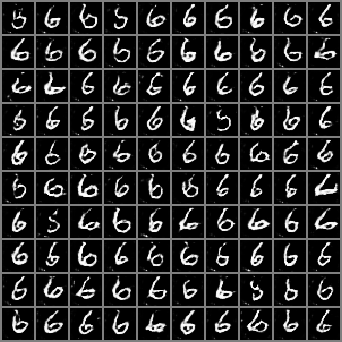

epoch: 5/15, batch: 110/600, G_loss: 2.1075544357299805, D_loss: (1.3786063194274902, 0.13836464285850525, 0.3106900453567505)
epoch: 5/15, batch: 120/600, G_loss: 1.6973217725753784, D_loss: (1.0078492164611816, 0.2159024178981781, 0.48258841037750244)
epoch: 5/15, batch: 130/600, G_loss: 1.2877978086471558, D_loss: (0.9112524390220642, 0.3417312502861023, 0.538136899471283)
epoch: 5/15, batch: 140/600, G_loss: 2.185570240020752, D_loss: (1.445349097251892, 0.12566380202770233, 0.2845943868160248)
epoch: 5/15, batch: 150/600, G_loss: 1.8404219150543213, D_loss: (1.028976559638977, 0.18523241579532623, 0.464155912399292)
epoch: 5/15, batch: 160/600, G_loss: 1.4852906465530396, D_loss: (0.9214299917221069, 0.27246442437171936, 0.5342927575111389)
epoch: 5/15, batch: 170/600, G_loss: 1.7581883668899536, D_loss: (1.0218771696090698, 0.20030611753463745, 0.469060480594635)
epoch: 5/15, batch: 180/600, G_loss: 0.9618717432022095, D_loss: (0.5901998281478882, 0.5017780065536499, 0.8373259902

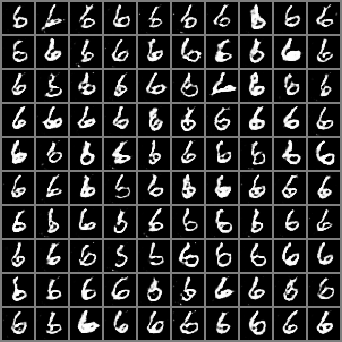

epoch: 5/15, batch: 210/600, G_loss: 1.6321282386779785, D_loss: (0.9276688098907471, 0.22795940935611725, 0.5345898866653442)
epoch: 5/15, batch: 220/600, G_loss: 2.073509693145752, D_loss: (1.0837281942367554, 0.14387094974517822, 0.4307771921157837)
epoch: 5/15, batch: 230/600, G_loss: 1.3032591342926025, D_loss: (0.6282516717910767, 0.3374640643596649, 0.800330400466919)
epoch: 5/15, batch: 240/600, G_loss: 1.5495938062667847, D_loss: (1.0019211769104004, 0.2508034408092499, 0.47645461559295654)
epoch: 5/15, batch: 250/600, G_loss: 1.7729498147964478, D_loss: (0.9583322405815125, 0.20164422690868378, 0.5057336091995239)
epoch: 5/15, batch: 260/600, G_loss: 1.5297836065292358, D_loss: (0.7495163083076477, 0.26226121187210083, 0.6779725551605225)
epoch: 5/15, batch: 270/600, G_loss: 1.657440185546875, D_loss: (1.0525368452072144, 0.22222816944122314, 0.46150344610214233)
epoch: 5/15, batch: 280/600, G_loss: 1.559256911277771, D_loss: (0.837497353553772, 0.24853576719760895, 0.5877599

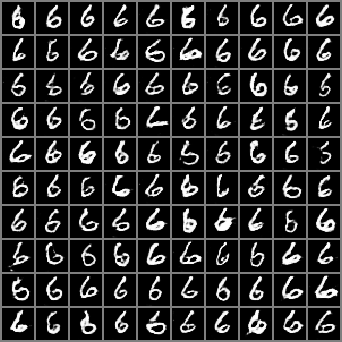

epoch: 5/15, batch: 310/600, G_loss: 1.9571483135223389, D_loss: (1.2614645957946777, 0.16032837331295013, 0.3562901020050049)
epoch: 5/15, batch: 320/600, G_loss: 2.087442636489868, D_loss: (1.2830520868301392, 0.14054398238658905, 0.34705650806427)
epoch: 5/15, batch: 330/600, G_loss: 2.1521003246307373, D_loss: (1.22698175907135, 0.1335415542125702, 0.3635268807411194)
epoch: 5/15, batch: 340/600, G_loss: 1.5306659936904907, D_loss: (0.8000527024269104, 0.25750941038131714, 0.6211931705474854)
epoch: 5/15, batch: 350/600, G_loss: 1.6363264322280884, D_loss: (0.9530459046363831, 0.22885443270206451, 0.5150352716445923)
epoch: 5/15, batch: 360/600, G_loss: 1.9683326482772827, D_loss: (1.0169156789779663, 0.15930068492889404, 0.4765298366546631)
epoch: 5/15, batch: 370/600, G_loss: 1.579166293144226, D_loss: (0.9209502339363098, 0.24140200018882751, 0.5242747664451599)
epoch: 5/15, batch: 380/600, G_loss: 1.9819608926773071, D_loss: (1.021812081336975, 0.15768323838710785, 0.4692794084

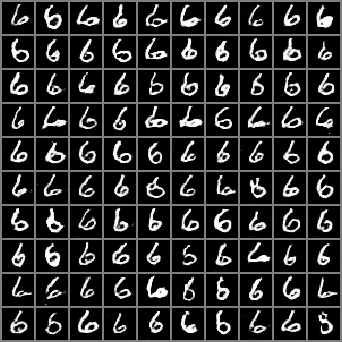

epoch: 5/15, batch: 410/600, G_loss: 1.710970163345337, D_loss: (0.9557579755783081, 0.21270222961902618, 0.5015413761138916)
epoch: 5/15, batch: 420/600, G_loss: 1.4771935939788818, D_loss: (0.8341405987739563, 0.2770470082759857, 0.599495530128479)
epoch: 5/15, batch: 430/600, G_loss: 1.7748924493789673, D_loss: (1.094377875328064, 0.19379521906375885, 0.4296787977218628)
epoch: 5/15, batch: 440/600, G_loss: 1.3642361164093018, D_loss: (0.8771530389785767, 0.3103443384170532, 0.5622497797012329)
epoch: 5/15, batch: 450/600, G_loss: 0.6702085733413696, D_loss: (0.3874157965183258, 0.784689724445343, 1.1974159479141235)
epoch: 5/15, batch: 460/600, G_loss: 1.452646017074585, D_loss: (1.090218424797058, 0.28144583106040955, 0.4238167107105255)
epoch: 5/15, batch: 470/600, G_loss: 1.4941502809524536, D_loss: (1.0556560754776, 0.2671249508857727, 0.44290342926979065)
epoch: 5/15, batch: 480/600, G_loss: 1.4567140340805054, D_loss: (0.8739422559738159, 0.28036749362945557, 0.56262171268463

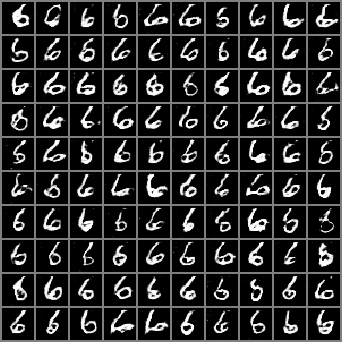

epoch: 5/15, batch: 510/600, G_loss: 1.5837867259979248, D_loss: (0.9518332481384277, 0.2446257472038269, 0.5065246820449829)
epoch: 5/15, batch: 520/600, G_loss: 1.6346888542175293, D_loss: (1.0313222408294678, 0.23276498913764954, 0.4641748070716858)
epoch: 5/15, batch: 530/600, G_loss: 1.1966265439987183, D_loss: (0.6095290184020996, 0.37653422355651855, 0.8059488534927368)
epoch: 5/15, batch: 540/600, G_loss: 1.8388354778289795, D_loss: (1.1985812187194824, 0.18942327797412872, 0.3748129606246948)
epoch: 5/15, batch: 550/600, G_loss: 2.1741743087768555, D_loss: (1.3005291223526, 0.1291448473930359, 0.33811190724372864)
epoch: 5/15, batch: 560/600, G_loss: 1.5074135065078735, D_loss: (0.7894933819770813, 0.2643054127693176, 0.6375805139541626)
epoch: 5/15, batch: 570/600, G_loss: 0.915264904499054, D_loss: (0.4598864018917084, 0.5511162877082825, 1.0364468097686768)
epoch: 5/15, batch: 580/600, G_loss: 1.6843234300613403, D_loss: (1.1234195232391357, 0.22094446420669556, 0.415291517

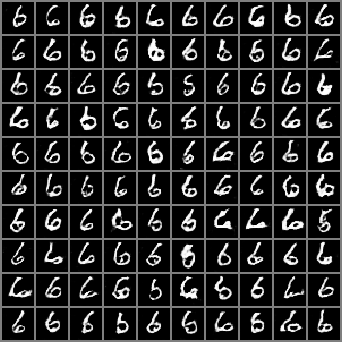

epoch: 6/15, batch: 10/600, G_loss: 1.7719746828079224, D_loss: (0.9609394669532776, 0.19642280042171478, 0.4973916709423065)
epoch: 6/15, batch: 20/600, G_loss: 1.372201681137085, D_loss: (0.7929542660713196, 0.313030481338501, 0.6307868957519531)
epoch: 6/15, batch: 30/600, G_loss: 2.909125328063965, D_loss: (2.223231315612793, 0.060147665441036224, 0.12213113903999329)
epoch: 6/15, batch: 40/600, G_loss: 1.578495979309082, D_loss: (0.9171147346496582, 0.23912321031093597, 0.5300555229187012)
epoch: 6/15, batch: 50/600, G_loss: 1.2020143270492554, D_loss: (0.6807395815849304, 0.37157368659973145, 0.7330882549285889)
epoch: 6/15, batch: 60/600, G_loss: 1.707854151725769, D_loss: (0.9374613165855408, 0.20978280901908875, 0.5199038982391357)
epoch: 6/15, batch: 70/600, G_loss: 1.6837698221206665, D_loss: (1.0832539796829224, 0.21714162826538086, 0.4376786947250366)
epoch: 6/15, batch: 80/600, G_loss: 1.3952980041503906, D_loss: (1.0526634454727173, 0.29588425159454346, 0.448513567447662

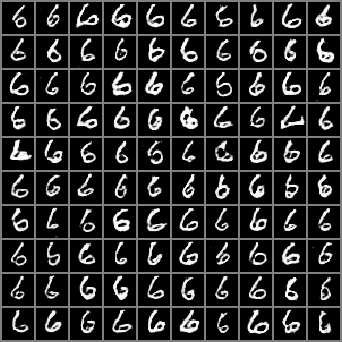

epoch: 6/15, batch: 110/600, G_loss: 1.6073635816574097, D_loss: (0.8529276251792908, 0.2365548461675644, 0.5898592472076416)
epoch: 6/15, batch: 120/600, G_loss: 1.5756475925445557, D_loss: (1.1033209562301636, 0.24825690686702728, 0.4249398708343506)
epoch: 6/15, batch: 130/600, G_loss: 1.806309700012207, D_loss: (1.0013172626495361, 0.19141052663326263, 0.49019840359687805)
epoch: 6/15, batch: 140/600, G_loss: 1.5007274150848389, D_loss: (0.9656243324279785, 0.26688557863235474, 0.510066568851471)
epoch: 6/15, batch: 150/600, G_loss: 1.662115216255188, D_loss: (1.0650967359542847, 0.22201265394687653, 0.4400835335254669)
epoch: 6/15, batch: 160/600, G_loss: 1.6749833822250366, D_loss: (1.078771710395813, 0.22310930490493774, 0.43366947770118713)
epoch: 6/15, batch: 170/600, G_loss: 1.5664798021316528, D_loss: (0.8781857490539551, 0.24442623555660248, 0.561593234539032)
epoch: 6/15, batch: 180/600, G_loss: 1.3850780725479126, D_loss: (0.8153460621833801, 0.3085450828075409, 0.6280465

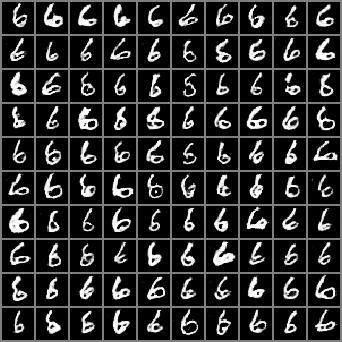

epoch: 6/15, batch: 210/600, G_loss: 1.4255691766738892, D_loss: (1.0740933418273926, 0.2868014872074127, 0.4444738030433655)
epoch: 6/15, batch: 220/600, G_loss: 1.4098008871078491, D_loss: (0.8123911023139954, 0.29395198822021484, 0.6087441444396973)
epoch: 6/15, batch: 230/600, G_loss: 1.5766170024871826, D_loss: (0.9289174675941467, 0.24136096239089966, 0.5266019105911255)
epoch: 6/15, batch: 240/600, G_loss: 1.3519706726074219, D_loss: (0.8035288453102112, 0.3187657594680786, 0.6139779686927795)
epoch: 6/15, batch: 250/600, G_loss: 1.3547009229660034, D_loss: (0.7493322491645813, 0.3160015940666199, 0.6776884198188782)
epoch: 6/15, batch: 260/600, G_loss: 2.237710475921631, D_loss: (1.379632592201233, 0.12266676872968674, 0.3111051619052887)
epoch: 6/15, batch: 270/600, G_loss: 1.4785836935043335, D_loss: (0.8715948462486267, 0.2717472016811371, 0.5744388699531555)
epoch: 6/15, batch: 280/600, G_loss: 1.7221266031265259, D_loss: (0.9880968332290649, 0.20786477625370026, 0.49018287

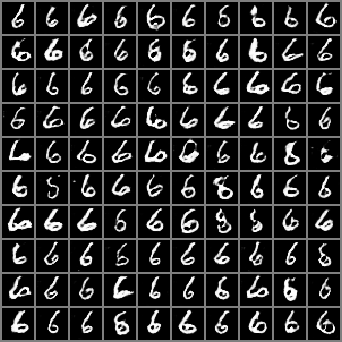

epoch: 6/15, batch: 310/600, G_loss: 1.6901588439941406, D_loss: (0.9767494797706604, 0.21271789073944092, 0.5029480457305908)
epoch: 6/15, batch: 320/600, G_loss: 1.498684287071228, D_loss: (1.0268638134002686, 0.2656339406967163, 0.4633726477622986)
epoch: 6/15, batch: 330/600, G_loss: 1.7125730514526367, D_loss: (0.8878716826438904, 0.20898953080177307, 0.5458129048347473)
epoch: 6/15, batch: 340/600, G_loss: 1.6606861352920532, D_loss: (0.9797008633613586, 0.2237340360879898, 0.5041465163230896)
epoch: 6/15, batch: 350/600, G_loss: 1.7844533920288086, D_loss: (1.0467300415039062, 0.1962718367576599, 0.45506706833839417)
epoch: 6/15, batch: 360/600, G_loss: 1.482161283493042, D_loss: (0.9131891131401062, 0.2744181454181671, 0.5339168310165405)
epoch: 6/15, batch: 370/600, G_loss: 1.7879347801208496, D_loss: (1.1443272829055786, 0.1959696263074875, 0.40260955691337585)
epoch: 6/15, batch: 380/600, G_loss: 1.6365714073181152, D_loss: (0.9744133949279785, 0.2329048365354538, 0.51354837

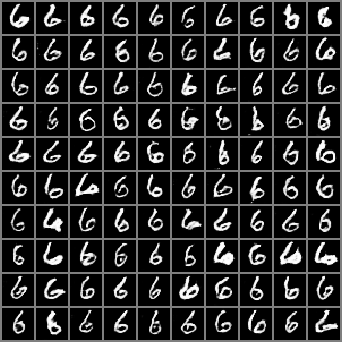

epoch: 6/15, batch: 410/600, G_loss: 1.5591639280319214, D_loss: (0.983690083026886, 0.2527167797088623, 0.49262332916259766)
epoch: 6/15, batch: 420/600, G_loss: 1.4752851724624634, D_loss: (0.9196839928627014, 0.2752310335636139, 0.5374639630317688)
epoch: 6/15, batch: 430/600, G_loss: 1.7136757373809814, D_loss: (0.9904588460922241, 0.20953893661499023, 0.4869839549064636)
epoch: 6/15, batch: 440/600, G_loss: 1.6110159158706665, D_loss: (1.0522611141204834, 0.2374487817287445, 0.44959649443626404)
epoch: 6/15, batch: 450/600, G_loss: 0.7725191712379456, D_loss: (0.38227105140686035, 0.6474980115890503, 1.2159980535507202)
epoch: 6/15, batch: 460/600, G_loss: 1.5963610410690308, D_loss: (1.0224453210830688, 0.23642800748348236, 0.46278467774391174)
epoch: 6/15, batch: 470/600, G_loss: 1.9190460443496704, D_loss: (1.2313203811645508, 0.16553223133087158, 0.36442065238952637)
epoch: 6/15, batch: 480/600, G_loss: 1.5410035848617554, D_loss: (0.9141274094581604, 0.25500041246414185, 0.52

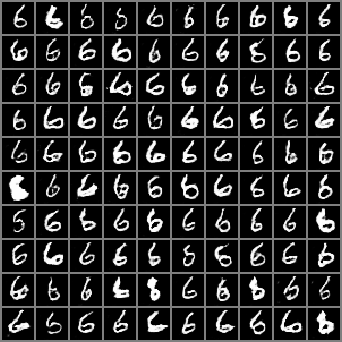

epoch: 6/15, batch: 510/600, G_loss: 1.4662731885910034, D_loss: (1.0190138816833496, 0.27732905745506287, 0.47626861929893494)
epoch: 6/15, batch: 520/600, G_loss: 1.2368823289871216, D_loss: (0.5563222765922546, 0.3602655529975891, 0.8885024189949036)
epoch: 6/15, batch: 530/600, G_loss: 1.6044772863388062, D_loss: (1.0349675416946411, 0.2409510612487793, 0.4568413197994232)
epoch: 6/15, batch: 540/600, G_loss: 2.0315911769866943, D_loss: (1.1943199634552002, 0.14990273118019104, 0.38480156660079956)
epoch: 6/15, batch: 550/600, G_loss: 1.5504652261734009, D_loss: (1.2079601287841797, 0.2519306242465973, 0.37602996826171875)
epoch: 6/15, batch: 560/600, G_loss: 1.3084527254104614, D_loss: (0.938886284828186, 0.3316674530506134, 0.5149186849594116)
epoch: 6/15, batch: 570/600, G_loss: 1.510143756866455, D_loss: (0.9021059274673462, 0.2613967955112457, 0.5442182421684265)
epoch: 6/15, batch: 580/600, G_loss: 1.549667477607727, D_loss: (0.9528079032897949, 0.2546493113040924, 0.51238125

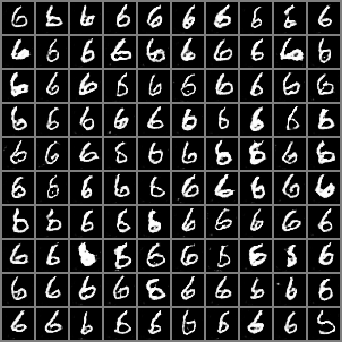

epoch: 7/15, batch: 10/600, G_loss: 1.744877576828003, D_loss: (1.1597048044204712, 0.2039172351360321, 0.39363178610801697)
epoch: 7/15, batch: 20/600, G_loss: 1.216801404953003, D_loss: (0.6312937140464783, 0.37136709690093994, 0.8031653761863708)
epoch: 7/15, batch: 30/600, G_loss: 1.8860546350479126, D_loss: (1.0614383220672607, 0.17506152391433716, 0.43894803524017334)
epoch: 7/15, batch: 40/600, G_loss: 1.5248397588729858, D_loss: (0.9076306223869324, 0.25836312770843506, 0.5370661616325378)
epoch: 7/15, batch: 50/600, G_loss: 1.4868136644363403, D_loss: (0.8830675482749939, 0.27023717761039734, 0.5487534999847412)
epoch: 7/15, batch: 60/600, G_loss: 1.6075555086135864, D_loss: (1.1029449701309204, 0.2332485318183899, 0.4234447777271271)
epoch: 7/15, batch: 70/600, G_loss: 1.7247234582901, D_loss: (0.9772505760192871, 0.20563343167304993, 0.4883067309856415)
epoch: 7/15, batch: 80/600, G_loss: 1.6863473653793335, D_loss: (1.0048717260360718, 0.21657203137874603, 0.470858722925186

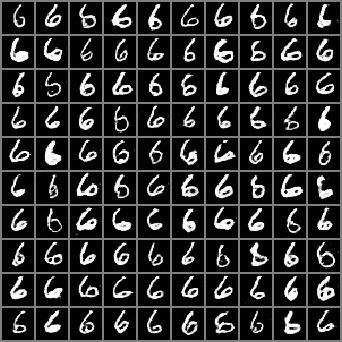

epoch: 7/15, batch: 110/600, G_loss: 1.323153018951416, D_loss: (0.9324352741241455, 0.3236052393913269, 0.5351245999336243)
epoch: 7/15, batch: 120/600, G_loss: 1.0197006464004517, D_loss: (0.7509135603904724, 0.4679839313030243, 0.6703144311904907)
epoch: 7/15, batch: 130/600, G_loss: 1.5621254444122314, D_loss: (1.1222598552703857, 0.2489212453365326, 0.415065199136734)
epoch: 7/15, batch: 140/600, G_loss: 1.5603255033493042, D_loss: (0.9223490357398987, 0.25285768508911133, 0.5261987447738647)
epoch: 7/15, batch: 150/600, G_loss: 1.2449241876602173, D_loss: (0.7410946488380432, 0.358625590801239, 0.6804436445236206)
epoch: 7/15, batch: 160/600, G_loss: 1.8384777307510376, D_loss: (1.1212928295135498, 0.18605941534042358, 0.4202377200126648)
epoch: 7/15, batch: 170/600, G_loss: 1.9838703870773315, D_loss: (1.2247035503387451, 0.15749327838420868, 0.3664458096027374)
epoch: 7/15, batch: 180/600, G_loss: 2.073779344558716, D_loss: (1.2695188522338867, 0.14634761214256287, 0.3510679304

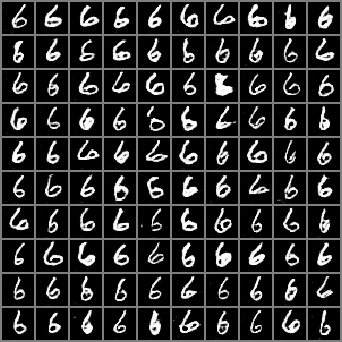

epoch: 7/15, batch: 210/600, G_loss: 0.9891158938407898, D_loss: (0.46944594383239746, 0.48340684175491333, 0.999143123626709)
epoch: 7/15, batch: 220/600, G_loss: 1.772435188293457, D_loss: (1.365696907043457, 0.19857120513916016, 0.30996569991111755)
epoch: 7/15, batch: 230/600, G_loss: 1.2484418153762817, D_loss: (0.959103524684906, 0.3558565378189087, 0.5101335644721985)
epoch: 7/15, batch: 240/600, G_loss: 1.497318148612976, D_loss: (0.9094511270523071, 0.2721679210662842, 0.5372627377510071)
epoch: 7/15, batch: 250/600, G_loss: 1.2848321199417114, D_loss: (0.6942009925842285, 0.3404211401939392, 0.7239194512367249)
epoch: 7/15, batch: 260/600, G_loss: 1.3357113599777222, D_loss: (0.8233042359352112, 0.3216457664966583, 0.5961508750915527)
epoch: 7/15, batch: 270/600, G_loss: 1.6250818967819214, D_loss: (0.8530313372612, 0.23182512819766998, 0.5840131640434265)
epoch: 7/15, batch: 280/600, G_loss: 1.2328214645385742, D_loss: (0.8592033386230469, 0.3597075343132019, 0.5757060050964

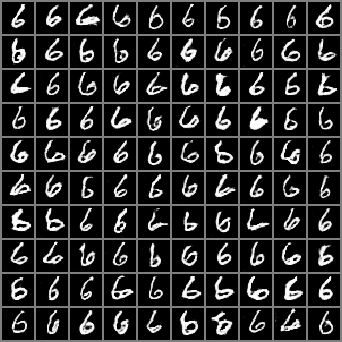

epoch: 7/15, batch: 310/600, G_loss: 1.6797577142715454, D_loss: (1.0237644910812378, 0.21647384762763977, 0.47123631834983826)
epoch: 7/15, batch: 320/600, G_loss: 1.465404987335205, D_loss: (0.8695897459983826, 0.27879050374031067, 0.5705977082252502)
epoch: 7/15, batch: 330/600, G_loss: 1.3733758926391602, D_loss: (0.8314321041107178, 0.3128267824649811, 0.5988821983337402)
epoch: 7/15, batch: 340/600, G_loss: 1.3323553800582886, D_loss: (0.7851458787918091, 0.32286298274993896, 0.6488773226737976)
epoch: 7/15, batch: 350/600, G_loss: 1.661370873451233, D_loss: (1.032958745956421, 0.22405005991458893, 0.4539887607097626)
epoch: 7/15, batch: 360/600, G_loss: 1.337372899055481, D_loss: (0.8765988945960999, 0.3214814364910126, 0.5536145567893982)
epoch: 7/15, batch: 370/600, G_loss: 2.102782726287842, D_loss: (1.4134902954101562, 0.14183305203914642, 0.2966420650482178)
epoch: 7/15, batch: 380/600, G_loss: 1.170747995376587, D_loss: (0.6749921441078186, 0.3875659704208374, 0.7518945336

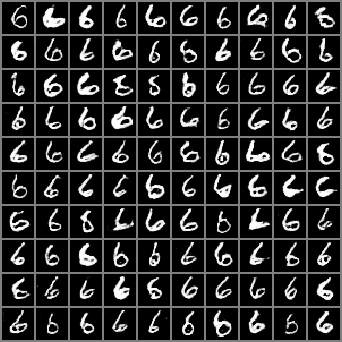

epoch: 7/15, batch: 410/600, G_loss: 1.1972739696502686, D_loss: (0.7900843620300293, 0.3908504247665405, 0.6307002902030945)
epoch: 7/15, batch: 420/600, G_loss: 1.5707688331604004, D_loss: (1.0396933555603027, 0.24676093459129333, 0.4624673128128052)
epoch: 7/15, batch: 430/600, G_loss: 1.7753430604934692, D_loss: (1.0333070755004883, 0.19651347398757935, 0.4633815884590149)
epoch: 7/15, batch: 440/600, G_loss: 1.5511261224746704, D_loss: (0.8857555389404297, 0.2522936761379242, 0.5686333179473877)
epoch: 7/15, batch: 450/600, G_loss: 1.5675090551376343, D_loss: (1.049801230430603, 0.24735918641090393, 0.44879740476608276)
epoch: 7/15, batch: 460/600, G_loss: 1.6508411169052124, D_loss: (1.052654504776001, 0.22474388778209686, 0.4472932517528534)
epoch: 7/15, batch: 470/600, G_loss: 1.6001673936843872, D_loss: (0.906039297580719, 0.2356005609035492, 0.5425440073013306)
epoch: 7/15, batch: 480/600, G_loss: 1.6331466436386108, D_loss: (0.9181393384933472, 0.23137107491493225, 0.5210422

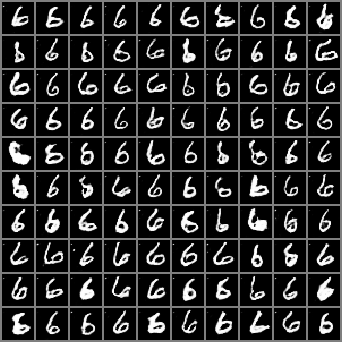

epoch: 7/15, batch: 510/600, G_loss: 1.5770705938339233, D_loss: (1.1254324913024902, 0.2445618212223053, 0.40841782093048096)
epoch: 7/15, batch: 520/600, G_loss: 1.3943191766738892, D_loss: (1.1944842338562012, 0.30164363980293274, 0.3659992516040802)
epoch: 7/15, batch: 530/600, G_loss: 1.428002119064331, D_loss: (0.8937658667564392, 0.28899556398391724, 0.5395442247390747)
epoch: 7/15, batch: 540/600, G_loss: 1.7858824729919434, D_loss: (1.160325288772583, 0.19557926058769226, 0.3979811370372772)
epoch: 7/15, batch: 550/600, G_loss: 2.5267820358276367, D_loss: (1.6946905851364136, 0.08955564349889755, 0.21562615036964417)
epoch: 7/15, batch: 560/600, G_loss: 1.7439934015274048, D_loss: (1.0017036199569702, 0.2010289430618286, 0.471574068069458)
epoch: 7/15, batch: 570/600, G_loss: 1.7167202234268188, D_loss: (1.128931999206543, 0.2113807052373886, 0.4203421473503113)
epoch: 7/15, batch: 580/600, G_loss: 1.5305520296096802, D_loss: (1.0403825044631958, 0.2596725523471832, 0.45867416

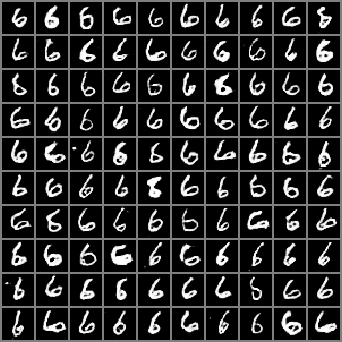

epoch: 8/15, batch: 10/600, G_loss: 2.0007216930389404, D_loss: (1.144641399383545, 0.1561257392168045, 0.3932461142539978)
epoch: 8/15, batch: 20/600, G_loss: 1.64434814453125, D_loss: (0.9083622097969055, 0.2273230105638504, 0.5330207943916321)
epoch: 8/15, batch: 30/600, G_loss: 1.37163507938385, D_loss: (0.7493894696235657, 0.31246665120124817, 0.6781314611434937)
epoch: 8/15, batch: 40/600, G_loss: 1.3721178770065308, D_loss: (0.6955800652503967, 0.30515027046203613, 0.7205584049224854)
epoch: 8/15, batch: 50/600, G_loss: 1.5559234619140625, D_loss: (1.0374139547348022, 0.25042709708213806, 0.4700314700603485)
epoch: 8/15, batch: 60/600, G_loss: 1.610234022140503, D_loss: (0.9411705136299133, 0.23692893981933594, 0.5197351574897766)
epoch: 8/15, batch: 70/600, G_loss: 1.2806462049484253, D_loss: (0.8810473084449768, 0.34273919463157654, 0.5607821941375732)
epoch: 8/15, batch: 80/600, G_loss: 2.25911021232605, D_loss: (1.5769494771957397, 0.12036456167697906, 0.24761717021465302)
e

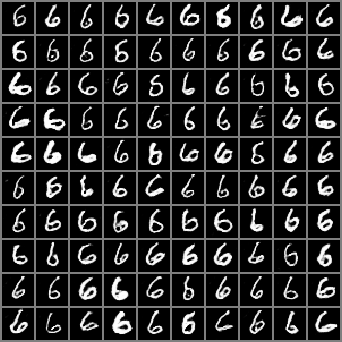

epoch: 8/15, batch: 110/600, G_loss: 2.2202320098876953, D_loss: (1.3872442245483398, 0.12302951514720917, 0.30172261595726013)
epoch: 8/15, batch: 120/600, G_loss: 1.450135350227356, D_loss: (0.8226540088653564, 0.2856569290161133, 0.6088827252388)
epoch: 8/15, batch: 130/600, G_loss: 1.7582417726516724, D_loss: (1.0734750032424927, 0.20209848880767822, 0.43776795268058777)
epoch: 8/15, batch: 140/600, G_loss: 1.7863249778747559, D_loss: (1.1800799369812012, 0.19570785760879517, 0.38462188839912415)
epoch: 8/15, batch: 150/600, G_loss: 1.2460262775421143, D_loss: (0.7727954387664795, 0.356413334608078, 0.6395728588104248)
epoch: 8/15, batch: 160/600, G_loss: 2.6249048709869385, D_loss: (1.8218226432800293, 0.08153591305017471, 0.18855467438697815)
epoch: 8/15, batch: 170/600, G_loss: 1.4437698125839233, D_loss: (1.015721321105957, 0.288326621055603, 0.48008131980895996)
epoch: 8/15, batch: 180/600, G_loss: 2.0510661602020264, D_loss: (1.4034857749938965, 0.14518879354000092, 0.2965862

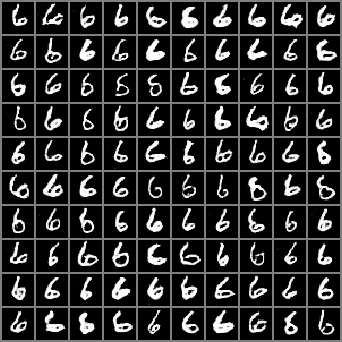

epoch: 8/15, batch: 210/600, G_loss: 1.2715166807174683, D_loss: (0.7000394463539124, 0.3474271893501282, 0.702066957950592)
epoch: 8/15, batch: 220/600, G_loss: 1.6136425733566284, D_loss: (1.062981128692627, 0.23423564434051514, 0.4453181028366089)
epoch: 8/15, batch: 230/600, G_loss: 1.63352632522583, D_loss: (1.0259618759155273, 0.2309776246547699, 0.47589871287345886)
epoch: 8/15, batch: 240/600, G_loss: 1.153163194656372, D_loss: (0.6243128776550293, 0.40365639328956604, 0.8116418719291687)
epoch: 8/15, batch: 250/600, G_loss: 1.8870673179626465, D_loss: (1.1161930561065674, 0.17554086446762085, 0.41418734192848206)
epoch: 8/15, batch: 260/600, G_loss: 1.7675257921218872, D_loss: (0.9717622399330139, 0.19903698563575745, 0.5016790628433228)
epoch: 8/15, batch: 270/600, G_loss: 1.5315845012664795, D_loss: (1.019571304321289, 0.25905609130859375, 0.4851832687854767)
epoch: 8/15, batch: 280/600, G_loss: 1.8736833333969116, D_loss: (1.252954125404358, 0.17940549552440643, 0.363040775

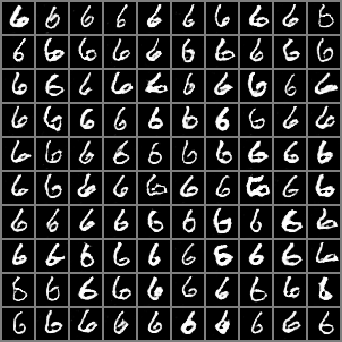

epoch: 8/15, batch: 310/600, G_loss: 1.9598654508590698, D_loss: (1.3234200477600098, 0.16242927312850952, 0.330234557390213)
epoch: 8/15, batch: 320/600, G_loss: 1.301547884941101, D_loss: (0.7158534526824951, 0.3341628611087799, 0.6927972435951233)
epoch: 8/15, batch: 330/600, G_loss: 1.3523118495941162, D_loss: (0.8333268761634827, 0.3174598813056946, 0.5976225137710571)
epoch: 8/15, batch: 340/600, G_loss: 1.6649090051651, D_loss: (1.0301955938339233, 0.222741037607193, 0.4592759609222412)
epoch: 8/15, batch: 350/600, G_loss: 1.6131762266159058, D_loss: (1.0764521360397339, 0.2395378053188324, 0.43558061122894287)
epoch: 8/15, batch: 360/600, G_loss: 1.473738431930542, D_loss: (0.9376188516616821, 0.27608492970466614, 0.5207713842391968)
epoch: 8/15, batch: 370/600, G_loss: 1.5369380712509155, D_loss: (1.050644040107727, 0.258828341960907, 0.4567532241344452)
epoch: 8/15, batch: 380/600, G_loss: 1.5554478168487549, D_loss: (0.83857262134552, 0.2502972483634949, 0.5852872729301453)


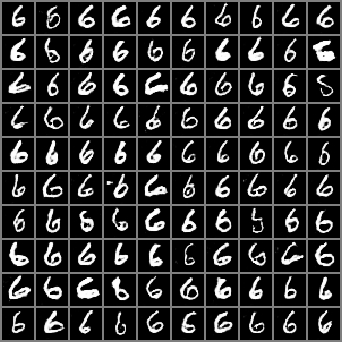

epoch: 8/15, batch: 410/600, G_loss: 2.0743541717529297, D_loss: (1.241613745689392, 0.1428176909685135, 0.35934680700302124)
epoch: 8/15, batch: 420/600, G_loss: 1.7610218524932861, D_loss: (1.0112196207046509, 0.2055470496416092, 0.4781164228916168)
epoch: 8/15, batch: 430/600, G_loss: 1.664321780204773, D_loss: (0.9955368041992188, 0.2231416255235672, 0.4842551350593567)
epoch: 8/15, batch: 440/600, G_loss: 1.793908715248108, D_loss: (1.012839913368225, 0.19403819739818573, 0.48332059383392334)
epoch: 8/15, batch: 450/600, G_loss: 1.5018894672393799, D_loss: (0.9844108819961548, 0.2689680755138397, 0.49157410860061646)
epoch: 8/15, batch: 460/600, G_loss: 1.4430793523788452, D_loss: (0.9880006909370422, 0.28082674741744995, 0.48201027512550354)
epoch: 8/15, batch: 470/600, G_loss: 1.4500126838684082, D_loss: (0.8676381707191467, 0.2827121913433075, 0.5657284259796143)
epoch: 8/15, batch: 480/600, G_loss: 1.7400513887405396, D_loss: (0.91387540102005, 0.20616109669208527, 0.531782150

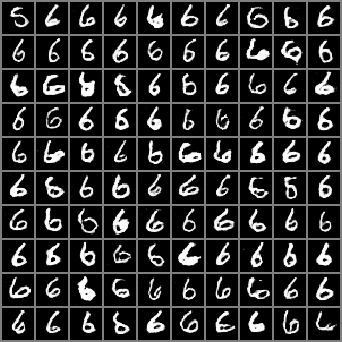

epoch: 8/15, batch: 510/600, G_loss: 2.12337327003479, D_loss: (1.4301223754882812, 0.13372540473937988, 0.28920722007751465)
epoch: 8/15, batch: 520/600, G_loss: 1.5891952514648438, D_loss: (0.9702070355415344, 0.24261367321014404, 0.5033106803894043)
epoch: 8/15, batch: 530/600, G_loss: 1.5638985633850098, D_loss: (0.953483521938324, 0.24574171006679535, 0.49771565198898315)
epoch: 8/15, batch: 540/600, G_loss: 1.5797566175460815, D_loss: (1.0176844596862793, 0.24271251261234283, 0.47021785378456116)
epoch: 8/15, batch: 550/600, G_loss: 1.5828940868377686, D_loss: (1.0226905345916748, 0.2432517409324646, 0.4756520390510559)
epoch: 8/15, batch: 560/600, G_loss: 1.444873332977295, D_loss: (0.9581949710845947, 0.2803899645805359, 0.49754807353019714)
epoch: 8/15, batch: 570/600, G_loss: 1.6650657653808594, D_loss: (0.9860339164733887, 0.22186332941055298, 0.4792356789112091)
epoch: 8/15, batch: 580/600, G_loss: 1.790725827217102, D_loss: (1.2102992534637451, 0.1923968344926834, 0.374778

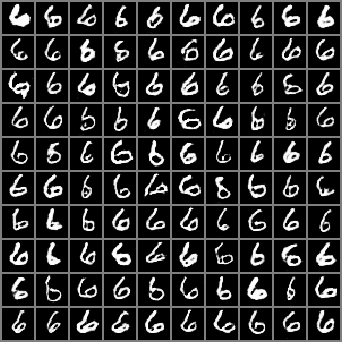

epoch: 9/15, batch: 10/600, G_loss: 1.3916908502578735, D_loss: (0.9296631813049316, 0.29963815212249756, 0.5251318216323853)
epoch: 9/15, batch: 20/600, G_loss: 2.0670723915100098, D_loss: (1.1757782697677612, 0.14450660347938538, 0.3882209360599518)
epoch: 9/15, batch: 30/600, G_loss: 2.193474769592285, D_loss: (1.6195237636566162, 0.1300952285528183, 0.23495471477508545)
epoch: 9/15, batch: 40/600, G_loss: 1.4583406448364258, D_loss: (0.7891979813575745, 0.2767205536365509, 0.6267270445823669)
epoch: 9/15, batch: 50/600, G_loss: 1.3438485860824585, D_loss: (0.8105599880218506, 0.3154783844947815, 0.6226332187652588)
epoch: 9/15, batch: 60/600, G_loss: 0.9223484992980957, D_loss: (0.5003672242164612, 0.5336171984672546, 1.0009582042694092)
epoch: 9/15, batch: 70/600, G_loss: 1.508025050163269, D_loss: (1.0182090997695923, 0.2635568678379059, 0.4738966226577759)
epoch: 9/15, batch: 80/600, G_loss: 1.5675173997879028, D_loss: (1.1117329597473145, 0.2492881566286087, 0.4219661056995392)

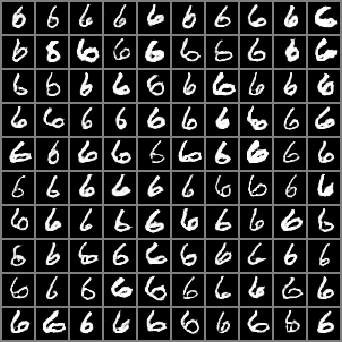

epoch: 9/15, batch: 110/600, G_loss: 1.5261379480361938, D_loss: (0.8986928462982178, 0.2599453926086426, 0.5487954020500183)
epoch: 9/15, batch: 120/600, G_loss: 1.6963049173355103, D_loss: (1.1214964389801025, 0.21554981172084808, 0.412007600069046)
epoch: 9/15, batch: 130/600, G_loss: 1.7736179828643799, D_loss: (1.0289207696914673, 0.19614838063716888, 0.4628836512565613)
epoch: 9/15, batch: 140/600, G_loss: 1.9883809089660645, D_loss: (1.1411676406860352, 0.15739984810352325, 0.3949388861656189)
epoch: 9/15, batch: 150/600, G_loss: 1.6022148132324219, D_loss: (0.9078473448753357, 0.24172423779964447, 0.5316873788833618)
epoch: 9/15, batch: 160/600, G_loss: 1.2173975706100464, D_loss: (0.7088462114334106, 0.3691260516643524, 0.7196653485298157)
epoch: 9/15, batch: 170/600, G_loss: 1.6354597806930542, D_loss: (1.1681534051895142, 0.2286207377910614, 0.39243531227111816)
epoch: 9/15, batch: 180/600, G_loss: 1.2823344469070435, D_loss: (0.7612895965576172, 0.34316352009773254, 0.66320

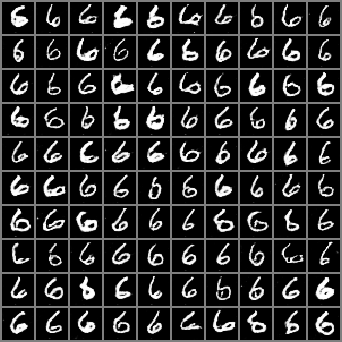

epoch: 9/15, batch: 210/600, G_loss: 3.089327812194824, D_loss: (1.8989741802215576, 0.053982071578502655, 0.1786334365606308)
epoch: 9/15, batch: 220/600, G_loss: 1.3854824304580688, D_loss: (0.9804123044013977, 0.3024637699127197, 0.4830625653266907)
epoch: 9/15, batch: 230/600, G_loss: 1.7892875671386719, D_loss: (1.006374716758728, 0.1957494020462036, 0.4771946668624878)
epoch: 9/15, batch: 240/600, G_loss: 1.9826250076293945, D_loss: (1.2794965505599976, 0.1601383239030838, 0.3496389389038086)
epoch: 9/15, batch: 250/600, G_loss: 1.8975318670272827, D_loss: (1.061748743057251, 0.17351120710372925, 0.4448680877685547)
epoch: 9/15, batch: 260/600, G_loss: 1.1972213983535767, D_loss: (0.6949555277824402, 0.38219258189201355, 0.7209660410881042)
epoch: 9/15, batch: 270/600, G_loss: 1.583376407623291, D_loss: (0.8771013617515564, 0.24309687316417694, 0.5636693835258484)
epoch: 9/15, batch: 280/600, G_loss: 1.7372691631317139, D_loss: (1.2270746231079102, 0.21069416403770447, 0.37049049

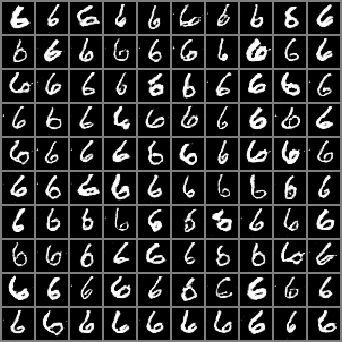

epoch: 9/15, batch: 310/600, G_loss: 1.7050843238830566, D_loss: (1.1128714084625244, 0.21152105927467346, 0.4134680926799774)
epoch: 9/15, batch: 320/600, G_loss: 1.4286361932754517, D_loss: (0.8624790906906128, 0.28652724623680115, 0.5745426416397095)
epoch: 9/15, batch: 330/600, G_loss: 1.6014736890792847, D_loss: (1.0251502990722656, 0.2367466539144516, 0.4783245325088501)
epoch: 9/15, batch: 340/600, G_loss: 1.7408872842788696, D_loss: (1.041334629058838, 0.203450545668602, 0.4570384919643402)
epoch: 9/15, batch: 350/600, G_loss: 1.4545369148254395, D_loss: (0.9001057147979736, 0.27946481108665466, 0.555223286151886)
epoch: 9/15, batch: 360/600, G_loss: 1.9499006271362305, D_loss: (1.218854308128357, 0.1657606065273285, 0.3667237162590027)
epoch: 9/15, batch: 370/600, G_loss: 1.8697807788848877, D_loss: (0.9791708588600159, 0.1768054962158203, 0.49547863006591797)
epoch: 9/15, batch: 380/600, G_loss: 2.2065515518188477, D_loss: (1.4562381505966187, 0.12539763748645782, 0.286573678

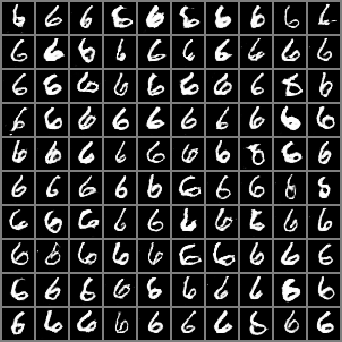

epoch: 9/15, batch: 410/600, G_loss: 0.8101035952568054, D_loss: (0.48475199937820435, 0.6218202710151672, 0.9863998293876648)
epoch: 9/15, batch: 420/600, G_loss: 1.9912970066070557, D_loss: (1.1352087259292603, 0.15630635619163513, 0.40849459171295166)
epoch: 9/15, batch: 430/600, G_loss: 1.1084824800491333, D_loss: (0.6779096126556396, 0.4273984134197235, 0.7337207794189453)
epoch: 9/15, batch: 440/600, G_loss: 1.4520493745803833, D_loss: (0.7528955340385437, 0.2788003087043762, 0.6593709588050842)
epoch: 9/15, batch: 450/600, G_loss: 1.4894336462020874, D_loss: (1.0298339128494263, 0.26873403787612915, 0.4625823199748993)
epoch: 9/15, batch: 460/600, G_loss: 1.9134864807128906, D_loss: (1.3961035013198853, 0.1728651374578476, 0.2972913682460785)
epoch: 9/15, batch: 470/600, G_loss: 1.3366308212280273, D_loss: (0.8093114495277405, 0.3244750201702118, 0.611005425453186)
epoch: 9/15, batch: 480/600, G_loss: 1.6552897691726685, D_loss: (0.860786497592926, 0.22133055329322815, 0.5652667

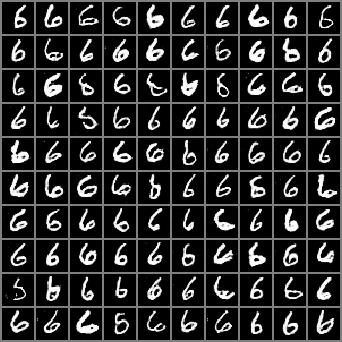

epoch: 9/15, batch: 510/600, G_loss: 2.0272057056427, D_loss: (1.2184909582138062, 0.1472787857055664, 0.3647967278957367)
epoch: 9/15, batch: 520/600, G_loss: 2.062816619873047, D_loss: (1.4294530153274536, 0.1452798694372177, 0.28931090235710144)
epoch: 9/15, batch: 530/600, G_loss: 1.497482419013977, D_loss: (0.7804712653160095, 0.2667842209339142, 0.6261972188949585)
epoch: 9/15, batch: 540/600, G_loss: 1.8144880533218384, D_loss: (1.0528854131698608, 0.18983037769794464, 0.44399797916412354)
epoch: 9/15, batch: 550/600, G_loss: 1.4469821453094482, D_loss: (0.7863457202911377, 0.2835257947444916, 0.6315500140190125)
epoch: 9/15, batch: 560/600, G_loss: 1.659101128578186, D_loss: (1.1300997734069824, 0.22698645293712616, 0.4072505831718445)
epoch: 9/15, batch: 570/600, G_loss: 1.6551860570907593, D_loss: (1.0728341341018677, 0.2285274863243103, 0.4429936707019806)
epoch: 9/15, batch: 580/600, G_loss: 1.4809602499008179, D_loss: (0.9762628674507141, 0.27651962637901306, 0.49942210316

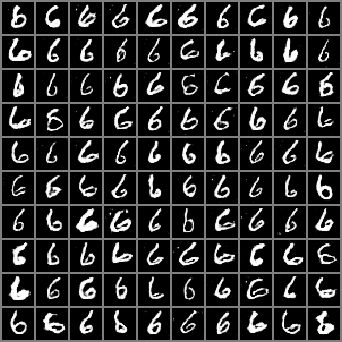

epoch: 10/15, batch: 10/600, G_loss: 1.8368644714355469, D_loss: (1.173507809638977, 0.18330921232700348, 0.3857954144477844)
epoch: 10/15, batch: 20/600, G_loss: 1.5273098945617676, D_loss: (0.9167525768280029, 0.2569824457168579, 0.5387094020843506)
epoch: 10/15, batch: 30/600, G_loss: 1.273827075958252, D_loss: (0.8677664995193481, 0.348194420337677, 0.564455509185791)
epoch: 10/15, batch: 40/600, G_loss: 1.6135095357894897, D_loss: (0.9109992384910583, 0.23324094712734222, 0.5369919538497925)
epoch: 10/15, batch: 50/600, G_loss: 1.8872076272964478, D_loss: (1.3717361688613892, 0.1734413504600525, 0.3024536073207855)
epoch: 10/15, batch: 60/600, G_loss: 1.7720428705215454, D_loss: (1.2338790893554688, 0.1985480934381485, 0.36795830726623535)
epoch: 10/15, batch: 70/600, G_loss: 1.6710309982299805, D_loss: (1.045784831047058, 0.2196899801492691, 0.45374178886413574)
epoch: 10/15, batch: 80/600, G_loss: 1.268585205078125, D_loss: (0.6797596216201782, 0.34482112526893616, 0.73695230484

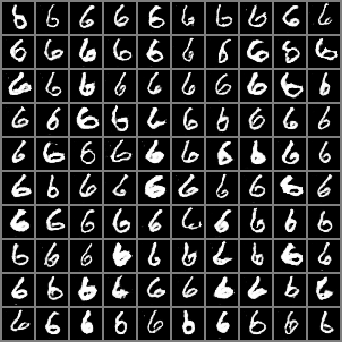

epoch: 10/15, batch: 110/600, G_loss: 1.482706904411316, D_loss: (0.924175500869751, 0.26872825622558594, 0.537834882736206)
epoch: 10/15, batch: 120/600, G_loss: 0.9058156609535217, D_loss: (0.5320936441421509, 0.5457870364189148, 0.9208821058273315)
epoch: 10/15, batch: 130/600, G_loss: 1.644289255142212, D_loss: (1.0129092931747437, 0.22910068929195404, 0.46576353907585144)
epoch: 10/15, batch: 140/600, G_loss: 1.903964638710022, D_loss: (1.2646584510803223, 0.17044007778167725, 0.34910640120506287)
epoch: 10/15, batch: 150/600, G_loss: 1.4837857484817505, D_loss: (0.8559823036193848, 0.27050116658210754, 0.5797920823097229)
epoch: 10/15, batch: 160/600, G_loss: 1.521942138671875, D_loss: (0.8567484021186829, 0.2622854709625244, 0.5865536332130432)
epoch: 10/15, batch: 170/600, G_loss: 1.5388057231903076, D_loss: (1.0737016201019287, 0.25185626745224, 0.43800365924835205)
epoch: 10/15, batch: 180/600, G_loss: 1.8537639379501343, D_loss: (0.9870002865791321, 0.18111540377140045, 0.48

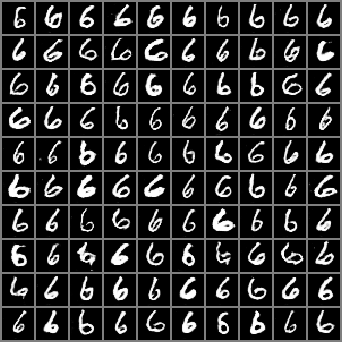

epoch: 10/15, batch: 210/600, G_loss: 1.4554580450057983, D_loss: (0.9885685443878174, 0.2801741659641266, 0.4862470328807831)
epoch: 10/15, batch: 220/600, G_loss: 1.1192004680633545, D_loss: (0.8066414594650269, 0.4160176217556, 0.6175844669342041)
epoch: 10/15, batch: 230/600, G_loss: 1.3857678174972534, D_loss: (0.9302770495414734, 0.30033135414123535, 0.5261533856391907)
epoch: 10/15, batch: 240/600, G_loss: 1.453398585319519, D_loss: (0.878633975982666, 0.28112292289733887, 0.5669362545013428)
epoch: 10/15, batch: 250/600, G_loss: 2.0514044761657715, D_loss: (1.5164036750793457, 0.14912012219429016, 0.2601812779903412)
epoch: 10/15, batch: 260/600, G_loss: 1.4973924160003662, D_loss: (0.7572051286697388, 0.2706640064716339, 0.6480292677879333)
epoch: 10/15, batch: 270/600, G_loss: 2.524528980255127, D_loss: (1.7365272045135498, 0.08960060775279999, 0.20286330580711365)
epoch: 10/15, batch: 280/600, G_loss: 1.3239681720733643, D_loss: (0.7968733310699463, 0.3253036141395569, 0.622

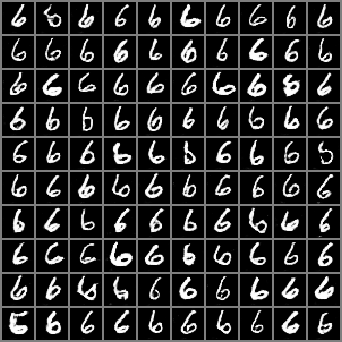

epoch: 10/15, batch: 310/600, G_loss: 1.1248695850372314, D_loss: (0.844285786151886, 0.4145047068595886, 0.5857522487640381)
epoch: 10/15, batch: 320/600, G_loss: 1.6680716276168823, D_loss: (0.9604038000106812, 0.22059741616249084, 0.504672110080719)
epoch: 10/15, batch: 330/600, G_loss: 0.9477649927139282, D_loss: (0.5852055549621582, 0.5200017690658569, 0.841890275478363)
epoch: 10/15, batch: 340/600, G_loss: 1.718156337738037, D_loss: (1.1846160888671875, 0.2090860903263092, 0.3841329514980316)
epoch: 10/15, batch: 350/600, G_loss: 1.7212754487991333, D_loss: (1.2101194858551025, 0.20746886730194092, 0.3685440123081207)
epoch: 10/15, batch: 360/600, G_loss: 1.3999125957489014, D_loss: (0.8945141434669495, 0.30031806230545044, 0.5420213937759399)
epoch: 10/15, batch: 370/600, G_loss: 1.334255337715149, D_loss: (0.8784045577049255, 0.31878727674484253, 0.5596876740455627)
epoch: 10/15, batch: 380/600, G_loss: 1.5395654439926147, D_loss: (0.9234755039215088, 0.256715327501297, 0.5233

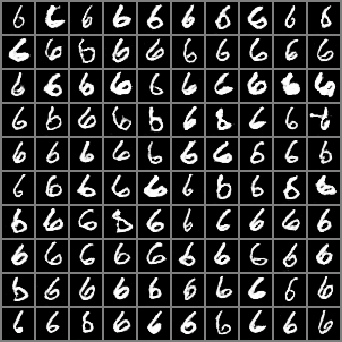

epoch: 10/15, batch: 410/600, G_loss: 1.3744828701019287, D_loss: (0.7314616441726685, 0.31889808177948, 0.6818207502365112)
epoch: 10/15, batch: 420/600, G_loss: 1.6428507566452026, D_loss: (1.0074512958526611, 0.2249080091714859, 0.480665385723114)
epoch: 10/15, batch: 430/600, G_loss: 1.036253809928894, D_loss: (0.6342912912368774, 0.46063652634620667, 0.7836829423904419)
epoch: 10/15, batch: 440/600, G_loss: 1.4313392639160156, D_loss: (0.6474564075469971, 0.29243960976600647, 0.7692819833755493)
epoch: 10/15, batch: 450/600, G_loss: 1.4988272190093994, D_loss: (1.0201287269592285, 0.26801377534866333, 0.4605094790458679)
epoch: 10/15, batch: 460/600, G_loss: 1.554235816001892, D_loss: (0.8706051111221313, 0.2512791156768799, 0.5689589977264404)
epoch: 10/15, batch: 470/600, G_loss: 1.5509848594665527, D_loss: (0.9409077167510986, 0.25161096453666687, 0.5249305963516235)
epoch: 10/15, batch: 480/600, G_loss: 1.828041434288025, D_loss: (1.2117078304290771, 0.18655407428741455, 0.368

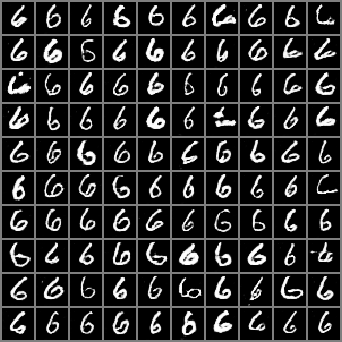

epoch: 10/15, batch: 510/600, G_loss: 1.2954456806182861, D_loss: (0.7054746747016907, 0.3349102735519409, 0.7061315178871155)
epoch: 10/15, batch: 520/600, G_loss: 1.2860572338104248, D_loss: (0.7771889567375183, 0.3429827392101288, 0.6545851230621338)
epoch: 10/15, batch: 530/600, G_loss: 2.094341993331909, D_loss: (1.3590409755706787, 0.14009061455726624, 0.31528088450431824)
epoch: 10/15, batch: 540/600, G_loss: 1.3131141662597656, D_loss: (0.7542849183082581, 0.32825446128845215, 0.6525894403457642)
epoch: 10/15, batch: 550/600, G_loss: 1.5298871994018555, D_loss: (0.9506083130836487, 0.257039338350296, 0.5152422189712524)
epoch: 10/15, batch: 560/600, G_loss: 1.3841140270233154, D_loss: (0.8449061512947083, 0.3032808005809784, 0.5870668292045593)
epoch: 10/15, batch: 570/600, G_loss: 1.7620769739151, D_loss: (1.2181875705718994, 0.20111213624477386, 0.3834368586540222)
epoch: 10/15, batch: 580/600, G_loss: 1.3874177932739258, D_loss: (0.7313812971115112, 0.3046712577342987, 0.688

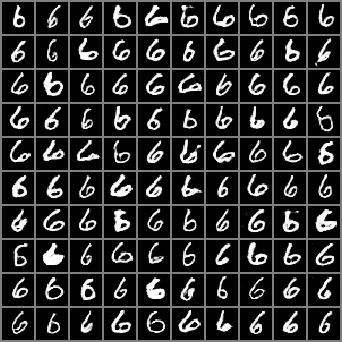

epoch: 11/15, batch: 10/600, G_loss: 1.4163966178894043, D_loss: (1.0863264799118042, 0.29251810908317566, 0.42553871870040894)
epoch: 11/15, batch: 20/600, G_loss: 1.2868117094039917, D_loss: (0.6645578145980835, 0.3416990637779236, 0.7437926530838013)
epoch: 11/15, batch: 30/600, G_loss: 1.2868212461471558, D_loss: (0.7075140476226807, 0.3363298177719116, 0.7049091458320618)
epoch: 11/15, batch: 40/600, G_loss: 1.1623455286026, D_loss: (0.7201207876205444, 0.39971694350242615, 0.6897999048233032)
epoch: 11/15, batch: 50/600, G_loss: 1.4946345090866089, D_loss: (0.8296530246734619, 0.2684951722621918, 0.5973979830741882)
epoch: 11/15, batch: 60/600, G_loss: 0.9992823600769043, D_loss: (0.49287089705467224, 0.4873960018157959, 0.9725042581558228)
epoch: 11/15, batch: 70/600, G_loss: 1.547447919845581, D_loss: (0.9579719305038452, 0.2513737380504608, 0.5083048343658447)
epoch: 11/15, batch: 80/600, G_loss: 2.37477970123291, D_loss: (1.4489407539367676, 0.1086227297782898, 0.288205981254

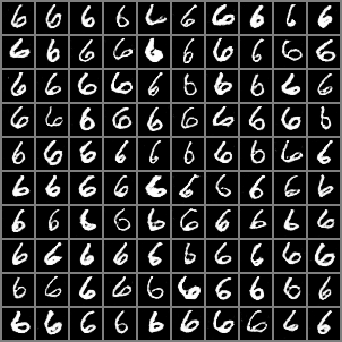

epoch: 11/15, batch: 110/600, G_loss: 1.6914974451065063, D_loss: (0.9514721035957336, 0.21697711944580078, 0.5073167681694031)
epoch: 11/15, batch: 120/600, G_loss: 1.763541579246521, D_loss: (0.896514892578125, 0.199446901679039, 0.5452640652656555)
epoch: 11/15, batch: 130/600, G_loss: 2.2045722007751465, D_loss: (1.1446800231933594, 0.12392179667949677, 0.39346474409103394)
epoch: 11/15, batch: 140/600, G_loss: 1.520232081413269, D_loss: (0.8302223682403564, 0.25829261541366577, 0.5991405248641968)
epoch: 11/15, batch: 150/600, G_loss: 1.3712936639785767, D_loss: (0.6709167957305908, 0.3083730638027191, 0.7381775379180908)
epoch: 11/15, batch: 160/600, G_loss: 1.5324432849884033, D_loss: (0.9342601895332336, 0.2565181851387024, 0.5289503931999207)
epoch: 11/15, batch: 170/600, G_loss: 1.2671133279800415, D_loss: (0.6819128394126892, 0.34851309657096863, 0.7423272728919983)
epoch: 11/15, batch: 180/600, G_loss: 1.39604914188385, D_loss: (0.8315394520759583, 0.29599297046661377, 0.59

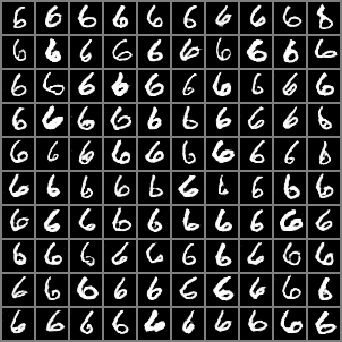

epoch: 11/15, batch: 210/600, G_loss: 1.6806678771972656, D_loss: (0.9749494194984436, 0.2171531319618225, 0.48667222261428833)
epoch: 11/15, batch: 220/600, G_loss: 0.7463060617446899, D_loss: (0.4842434227466583, 0.6810754537582397, 0.9951159954071045)
epoch: 11/15, batch: 230/600, G_loss: 1.735134482383728, D_loss: (0.8796228170394897, 0.2024892270565033, 0.5506719350814819)
epoch: 11/15, batch: 240/600, G_loss: 2.586169719696045, D_loss: (1.682680368423462, 0.08296176046133041, 0.21573659777641296)
epoch: 11/15, batch: 250/600, G_loss: 1.446872591972351, D_loss: (0.9185238480567932, 0.28027987480163574, 0.5372876524925232)
epoch: 11/15, batch: 260/600, G_loss: 2.8649444580078125, D_loss: (1.8467531204223633, 0.06534962356090546, 0.1836220622062683)
epoch: 11/15, batch: 270/600, G_loss: 1.5683677196502686, D_loss: (1.1778173446655273, 0.24539069831371307, 0.38133490085601807)
epoch: 11/15, batch: 280/600, G_loss: 0.9106578826904297, D_loss: (0.42264601588249207, 0.5365990400314331, 

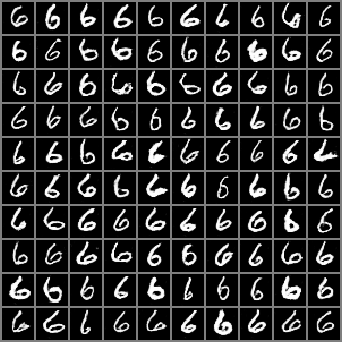

epoch: 11/15, batch: 310/600, G_loss: 1.2135353088378906, D_loss: (0.7903317809104919, 0.3735959231853485, 0.6298350691795349)
epoch: 11/15, batch: 320/600, G_loss: 1.5039455890655518, D_loss: (0.8821048140525818, 0.2651074230670929, 0.5527695417404175)
epoch: 11/15, batch: 330/600, G_loss: 1.6821955442428589, D_loss: (0.9865156412124634, 0.22000129520893097, 0.48610424995422363)
epoch: 11/15, batch: 340/600, G_loss: 1.75156831741333, D_loss: (1.1258865594863892, 0.2030525952577591, 0.40684425830841064)
epoch: 11/15, batch: 350/600, G_loss: 1.5611236095428467, D_loss: (0.9592679738998413, 0.25270870327949524, 0.4951316714286804)
epoch: 11/15, batch: 360/600, G_loss: 1.9321125745773315, D_loss: (1.1585079431533813, 0.16502666473388672, 0.3881319761276245)
epoch: 11/15, batch: 370/600, G_loss: 1.8511021137237549, D_loss: (1.1126402616500854, 0.18243025243282318, 0.4182317852973938)
epoch: 11/15, batch: 380/600, G_loss: 1.588956356048584, D_loss: (0.9038608074188232, 0.24148184061050415, 

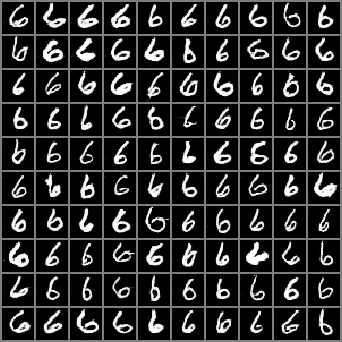

epoch: 11/15, batch: 410/600, G_loss: 1.9590742588043213, D_loss: (1.0255343914031982, 0.16106148064136505, 0.47091275453567505)
epoch: 11/15, batch: 420/600, G_loss: 1.3946532011032104, D_loss: (0.9769317507743835, 0.2930096685886383, 0.5009966492652893)
epoch: 11/15, batch: 430/600, G_loss: 1.572365164756775, D_loss: (1.0913165807724, 0.24551180005073547, 0.43500176072120667)
epoch: 11/15, batch: 440/600, G_loss: 1.51739501953125, D_loss: (0.750375509262085, 0.259615033864975, 0.6611784100532532)
epoch: 11/15, batch: 450/600, G_loss: 1.2895878553390503, D_loss: (0.8559058308601379, 0.33678844571113586, 0.5762832164764404)
epoch: 11/15, batch: 460/600, G_loss: 1.2157323360443115, D_loss: (0.6796935796737671, 0.37059104442596436, 0.7347275018692017)
epoch: 11/15, batch: 470/600, G_loss: 1.804367184638977, D_loss: (1.0569024085998535, 0.19166964292526245, 0.4499293863773346)
epoch: 11/15, batch: 480/600, G_loss: 1.7275269031524658, D_loss: (0.8649593591690063, 0.20641222596168518, 0.570

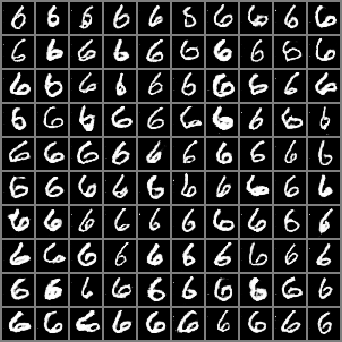

epoch: 11/15, batch: 510/600, G_loss: 1.279229760169983, D_loss: (0.723859965801239, 0.3448050320148468, 0.6980775594711304)
epoch: 11/15, batch: 520/600, G_loss: 1.6047558784484863, D_loss: (0.9313781261444092, 0.2365359514951706, 0.5147478580474854)
epoch: 11/15, batch: 530/600, G_loss: 1.5565975904464722, D_loss: (1.072105050086975, 0.24776676297187805, 0.44547349214553833)
epoch: 11/15, batch: 540/600, G_loss: 1.5054081678390503, D_loss: (0.9245416522026062, 0.26643672585487366, 0.5346139073371887)
epoch: 11/15, batch: 550/600, G_loss: 1.4325960874557495, D_loss: (0.9649344086647034, 0.29441410303115845, 0.4937118887901306)
epoch: 11/15, batch: 560/600, G_loss: 1.7983884811401367, D_loss: (1.3557472229003906, 0.1888374388217926, 0.3079448342323303)
epoch: 11/15, batch: 570/600, G_loss: 1.322525143623352, D_loss: (0.7506456971168518, 0.32607537508010864, 0.6604908108711243)
epoch: 11/15, batch: 580/600, G_loss: 1.5123003721237183, D_loss: (0.9502569437026978, 0.2662704586982727, 0.5

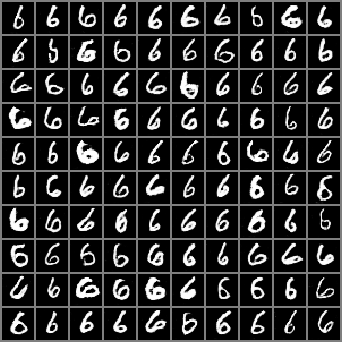

epoch: 12/15, batch: 10/600, G_loss: 1.3643531799316406, D_loss: (0.8177301287651062, 0.30790427327156067, 0.6050414443016052)
epoch: 12/15, batch: 20/600, G_loss: 1.8902959823608398, D_loss: (1.1767699718475342, 0.17142944037914276, 0.39124810695648193)
epoch: 12/15, batch: 30/600, G_loss: 1.5575963258743286, D_loss: (0.8911454081535339, 0.25096529722213745, 0.5516278147697449)
epoch: 12/15, batch: 40/600, G_loss: 2.2222037315368652, D_loss: (1.4518957138061523, 0.12366574257612228, 0.27866020798683167)
epoch: 12/15, batch: 50/600, G_loss: 1.7231462001800537, D_loss: (1.0280356407165527, 0.2049318104982376, 0.4719776511192322)
epoch: 12/15, batch: 60/600, G_loss: 1.094580054283142, D_loss: (0.5539438128471375, 0.4236389398574829, 0.8873435854911804)
epoch: 12/15, batch: 70/600, G_loss: 1.8678637742996216, D_loss: (1.0503734350204468, 0.1817760467529297, 0.4568968117237091)
epoch: 12/15, batch: 80/600, G_loss: 1.7326160669326782, D_loss: (0.9993655681610107, 0.20719271898269653, 0.4816

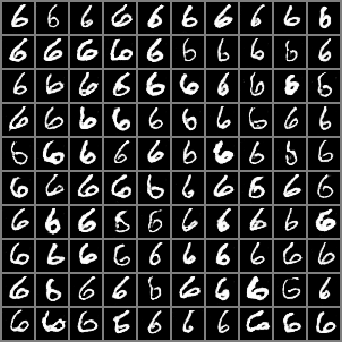

epoch: 12/15, batch: 110/600, G_loss: 1.5887521505355835, D_loss: (0.9076055884361267, 0.24325089156627655, 0.5366957187652588)
epoch: 12/15, batch: 120/600, G_loss: 1.7243893146514893, D_loss: (0.9412150382995605, 0.2105349749326706, 0.5143105387687683)
epoch: 12/15, batch: 130/600, G_loss: 1.7209380865097046, D_loss: (0.8952380418777466, 0.21324443817138672, 0.5499615669250488)
epoch: 12/15, batch: 140/600, G_loss: 1.3341244459152222, D_loss: (0.7282162308692932, 0.32641804218292236, 0.6986033916473389)
epoch: 12/15, batch: 150/600, G_loss: 1.4269970655441284, D_loss: (0.8700826168060303, 0.2916465103626251, 0.5607988238334656)
epoch: 12/15, batch: 160/600, G_loss: 1.625221610069275, D_loss: (0.9699295163154602, 0.2313217967748642, 0.4965629577636719)
epoch: 12/15, batch: 170/600, G_loss: 2.533413887023926, D_loss: (1.8364803791046143, 0.09695997089147568, 0.18713544309139252)
epoch: 12/15, batch: 180/600, G_loss: 1.3703755140304565, D_loss: (0.9765166640281677, 0.30558064579963684, 

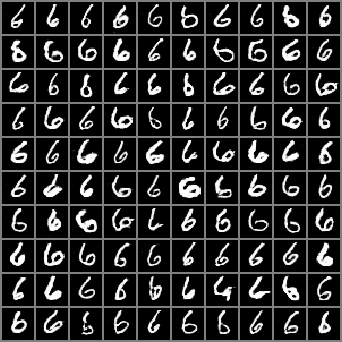

epoch: 12/15, batch: 210/600, G_loss: 1.635003685951233, D_loss: (0.8877821564674377, 0.2266690880060196, 0.5408945679664612)
epoch: 12/15, batch: 220/600, G_loss: 1.7064563035964966, D_loss: (1.0429836511611938, 0.20887401700019836, 0.458662748336792)
epoch: 12/15, batch: 230/600, G_loss: 1.7303898334503174, D_loss: (1.0001370906829834, 0.21186424791812897, 0.473499596118927)
epoch: 12/15, batch: 240/600, G_loss: 2.4302806854248047, D_loss: (1.5169343948364258, 0.09774346649646759, 0.2637927532196045)
epoch: 12/15, batch: 250/600, G_loss: 2.1281914710998535, D_loss: (1.40122389793396, 0.13659057021141052, 0.3032419681549072)
epoch: 12/15, batch: 260/600, G_loss: 2.1831276416778564, D_loss: (1.3915256261825562, 0.12963108718395233, 0.2988613247871399)
epoch: 12/15, batch: 270/600, G_loss: 1.1631017923355103, D_loss: (0.5623496174812317, 0.39890334010124207, 0.8914432525634766)
epoch: 12/15, batch: 280/600, G_loss: 1.6077302694320679, D_loss: (0.9995784163475037, 0.23320619761943817, 0.

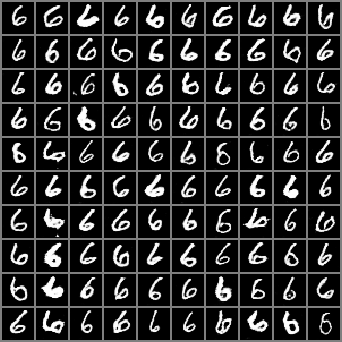

epoch: 12/15, batch: 310/600, G_loss: 2.0324132442474365, D_loss: (1.2967743873596191, 0.15167823433876038, 0.3423265218734741)
epoch: 12/15, batch: 320/600, G_loss: 1.3940081596374512, D_loss: (0.7336477637290955, 0.2989111840724945, 0.682279109954834)
epoch: 12/15, batch: 330/600, G_loss: 1.6320799589157104, D_loss: (1.18354070186615, 0.22971323132514954, 0.38510650396347046)
epoch: 12/15, batch: 340/600, G_loss: 1.6506266593933105, D_loss: (0.9809166193008423, 0.22641317546367645, 0.49895989894866943)
epoch: 12/15, batch: 350/600, G_loss: 1.4372339248657227, D_loss: (0.7942572236061096, 0.2902686595916748, 0.6337831616401672)
epoch: 12/15, batch: 360/600, G_loss: 1.535456657409668, D_loss: (0.8642141819000244, 0.2588675618171692, 0.5778789520263672)
epoch: 12/15, batch: 370/600, G_loss: 1.5921345949172974, D_loss: (0.9628087878227234, 0.24136234819889069, 0.50823974609375)
epoch: 12/15, batch: 380/600, G_loss: 1.2314956188201904, D_loss: (0.8058738708496094, 0.368997722864151, 0.610

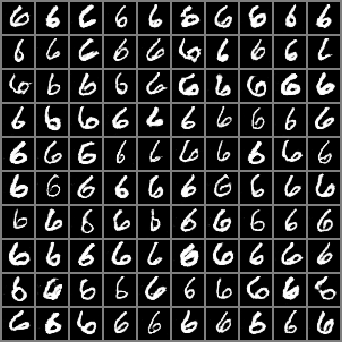

epoch: 12/15, batch: 410/600, G_loss: 2.148696184158325, D_loss: (1.1235238313674927, 0.1332591027021408, 0.4188234806060791)
epoch: 12/15, batch: 420/600, G_loss: 1.6603937149047852, D_loss: (0.8144196271896362, 0.2285957783460617, 0.6164876818656921)
epoch: 12/15, batch: 430/600, G_loss: 1.486207127571106, D_loss: (1.004622220993042, 0.2690095901489258, 0.483148455619812)
epoch: 12/15, batch: 440/600, G_loss: 1.323921799659729, D_loss: (0.6775234341621399, 0.3260475993156433, 0.7316055297851562)
epoch: 12/15, batch: 450/600, G_loss: 1.6560155153274536, D_loss: (0.9289687871932983, 0.22098909318447113, 0.5134576559066772)
epoch: 12/15, batch: 460/600, G_loss: 1.7182697057724, D_loss: (0.8944693803787231, 0.2081412672996521, 0.5510735511779785)
epoch: 12/15, batch: 470/600, G_loss: 2.0982351303100586, D_loss: (1.2882652282714844, 0.1420322060585022, 0.3377246558666229)
epoch: 12/15, batch: 480/600, G_loss: 1.5645325183868408, D_loss: (0.8044496178627014, 0.2509751617908478, 0.619457721

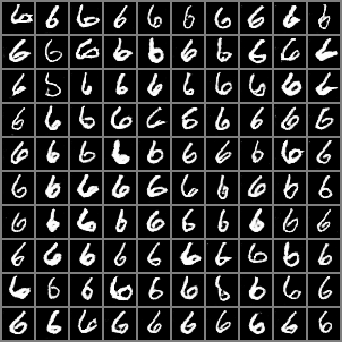

epoch: 12/15, batch: 510/600, G_loss: 1.4283138513565063, D_loss: (0.8717182278633118, 0.29255250096321106, 0.563957929611206)
epoch: 12/15, batch: 520/600, G_loss: 1.8658225536346436, D_loss: (1.0439242124557495, 0.1800360083580017, 0.4555695354938507)
epoch: 12/15, batch: 530/600, G_loss: 1.770196557044983, D_loss: (0.9995520114898682, 0.20197893679141998, 0.4850360155105591)
epoch: 12/15, batch: 540/600, G_loss: 1.6302142143249512, D_loss: (1.2322791814804077, 0.23219648003578186, 0.3643501400947571)
epoch: 12/15, batch: 550/600, G_loss: 1.6134229898452759, D_loss: (0.9090536236763, 0.23743833601474762, 0.5379553437232971)
epoch: 12/15, batch: 560/600, G_loss: 1.0236717462539673, D_loss: (0.6820250749588013, 0.472482293844223, 0.7331876158714294)
epoch: 12/15, batch: 570/600, G_loss: 2.0309643745422363, D_loss: (1.224198341369629, 0.1499822437763214, 0.3703731298446655)
epoch: 12/15, batch: 580/600, G_loss: 1.8478316068649292, D_loss: (0.932576060295105, 0.18096649646759033, 0.53184

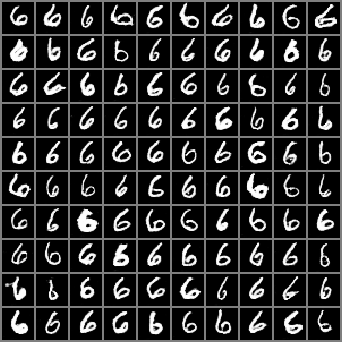

epoch: 13/15, batch: 10/600, G_loss: 1.442935585975647, D_loss: (0.9980131387710571, 0.28144559264183044, 0.4670688509941101)
epoch: 13/15, batch: 20/600, G_loss: 1.566697120666504, D_loss: (0.8038074970245361, 0.24630804359912872, 0.6206791400909424)
epoch: 13/15, batch: 30/600, G_loss: 1.3723276853561401, D_loss: (0.7795448899269104, 0.30726945400238037, 0.6407353281974792)
epoch: 13/15, batch: 40/600, G_loss: 1.5679887533187866, D_loss: (0.8605355024337769, 0.24916817247867584, 0.5820096731185913)
epoch: 13/15, batch: 50/600, G_loss: 1.7393287420272827, D_loss: (1.0201702117919922, 0.20356164872646332, 0.47680142521858215)
epoch: 13/15, batch: 60/600, G_loss: 2.2047998905181885, D_loss: (1.5597461462020874, 0.12455444037914276, 0.24619445204734802)
epoch: 13/15, batch: 70/600, G_loss: 1.537632942199707, D_loss: (0.8343127369880676, 0.2585534155368805, 0.5871347188949585)
epoch: 13/15, batch: 80/600, G_loss: 1.5899157524108887, D_loss: (0.7919821739196777, 0.24115240573883057, 0.6243

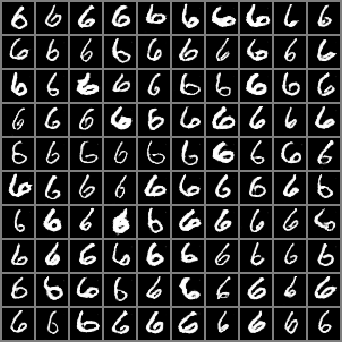

epoch: 13/15, batch: 110/600, G_loss: 1.968550443649292, D_loss: (1.1777501106262207, 0.15918679535388947, 0.3840338885784149)
epoch: 13/15, batch: 120/600, G_loss: 1.293911337852478, D_loss: (0.8506216406822205, 0.33391791582107544, 0.5880674719810486)
epoch: 13/15, batch: 130/600, G_loss: 1.2398192882537842, D_loss: (0.5300395488739014, 0.359541654586792, 0.9222959280014038)
epoch: 13/15, batch: 140/600, G_loss: 1.8305891752243042, D_loss: (1.1058353185653687, 0.18807515501976013, 0.41901442408561707)
epoch: 13/15, batch: 150/600, G_loss: 1.494125247001648, D_loss: (0.7442596554756165, 0.27222853899002075, 0.6611075401306152)
epoch: 13/15, batch: 160/600, G_loss: 1.7871302366256714, D_loss: (1.0415972471237183, 0.19319581985473633, 0.4515925347805023)
epoch: 13/15, batch: 170/600, G_loss: 1.5929234027862549, D_loss: (0.7917001247406006, 0.24383544921875, 0.6337013244628906)
epoch: 13/15, batch: 180/600, G_loss: 1.6626269817352295, D_loss: (0.8258325457572937, 0.2251890003681183, 0.59

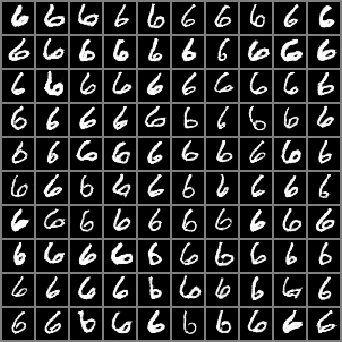

epoch: 13/15, batch: 210/600, G_loss: 1.4287917613983154, D_loss: (0.7521370649337769, 0.2891128361225128, 0.6527543067932129)
epoch: 13/15, batch: 220/600, G_loss: 1.9726355075836182, D_loss: (1.1937607526779175, 0.15878280997276306, 0.3738322854042053)
epoch: 13/15, batch: 230/600, G_loss: 2.72794771194458, D_loss: (2.0660810470581055, 0.07389065623283386, 0.1483749896287918)
epoch: 13/15, batch: 240/600, G_loss: 1.7519358396530151, D_loss: (0.9557661414146423, 0.20049835741519928, 0.4987693130970001)
epoch: 13/15, batch: 250/600, G_loss: 1.5768845081329346, D_loss: (0.9632901549339294, 0.2444905787706375, 0.4966374337673187)
epoch: 13/15, batch: 260/600, G_loss: 2.0064096450805664, D_loss: (1.2054675817489624, 0.15495629608631134, 0.3707982003688812)
epoch: 13/15, batch: 270/600, G_loss: 1.437474250793457, D_loss: (0.7711374163627625, 0.2835632264614105, 0.6403585076332092)
epoch: 13/15, batch: 280/600, G_loss: 1.442258358001709, D_loss: (0.8933593034744263, 0.29520198702812195, 0.5

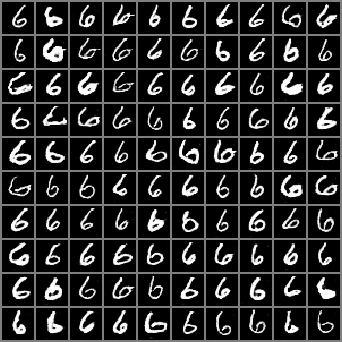

epoch: 13/15, batch: 310/600, G_loss: 2.0056862831115723, D_loss: (1.2149357795715332, 0.15120133757591248, 0.3750694990158081)
epoch: 13/15, batch: 320/600, G_loss: 1.7152780294418335, D_loss: (0.8748883605003357, 0.21176819503307343, 0.5555657744407654)
epoch: 13/15, batch: 330/600, G_loss: 1.3633569478988647, D_loss: (0.8361425995826721, 0.3137591779232025, 0.5935423374176025)
epoch: 13/15, batch: 340/600, G_loss: 1.5647659301757812, D_loss: (0.9210155606269836, 0.2461196929216385, 0.5270602703094482)
epoch: 13/15, batch: 350/600, G_loss: 1.3400812149047852, D_loss: (0.6689027547836304, 0.3214162588119507, 0.7555246949195862)
epoch: 13/15, batch: 360/600, G_loss: 1.9713835716247559, D_loss: (1.054323434829712, 0.1576053649187088, 0.4497406780719757)
epoch: 13/15, batch: 370/600, G_loss: 1.4128434658050537, D_loss: (0.746396541595459, 0.29734572768211365, 0.6829958558082581)
epoch: 13/15, batch: 380/600, G_loss: 1.7708507776260376, D_loss: (0.9872944355010986, 0.19790835678577423, 0.

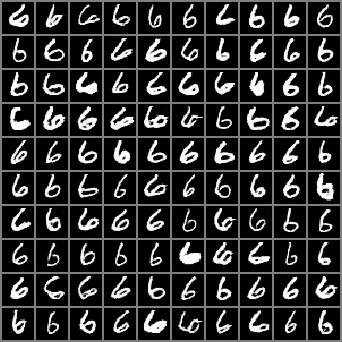

epoch: 13/15, batch: 410/600, G_loss: 1.4661532640457153, D_loss: (0.733600378036499, 0.2754858434200287, 0.6848830580711365)
epoch: 13/15, batch: 420/600, G_loss: 1.231764793395996, D_loss: (0.939918041229248, 0.36027857661247253, 0.5215161442756653)
epoch: 13/15, batch: 430/600, G_loss: 1.612597942352295, D_loss: (0.9475623369216919, 0.23334679007530212, 0.516615092754364)
epoch: 13/15, batch: 440/600, G_loss: 1.597111701965332, D_loss: (0.7330709099769592, 0.23922158777713776, 0.674741804599762)
epoch: 13/15, batch: 450/600, G_loss: 1.7768511772155762, D_loss: (1.070440649986267, 0.19593876600265503, 0.4447684586048126)
epoch: 13/15, batch: 460/600, G_loss: 1.646143913269043, D_loss: (1.090165376663208, 0.2285555899143219, 0.43203356862068176)
epoch: 13/15, batch: 470/600, G_loss: 1.958203911781311, D_loss: (0.9623289704322815, 0.1595131903886795, 0.5072599649429321)
epoch: 13/15, batch: 480/600, G_loss: 2.1601202487945557, D_loss: (1.3737775087356567, 0.134248748421669, 0.317425996

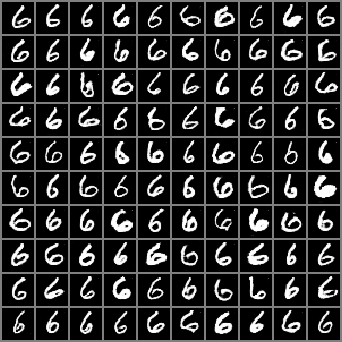

epoch: 13/15, batch: 510/600, G_loss: 1.6516112089157104, D_loss: (0.8308885097503662, 0.22407479584217072, 0.5886502265930176)
epoch: 13/15, batch: 520/600, G_loss: 1.4108200073242188, D_loss: (0.8332840800285339, 0.2943341135978699, 0.5893404483795166)
epoch: 13/15, batch: 530/600, G_loss: 1.840449333190918, D_loss: (0.9819648265838623, 0.1841827630996704, 0.4960101246833801)
epoch: 13/15, batch: 540/600, G_loss: 1.4754247665405273, D_loss: (0.6861577033996582, 0.2740978002548218, 0.7149050235748291)
epoch: 13/15, batch: 550/600, G_loss: 1.383277416229248, D_loss: (0.6730164885520935, 0.3087482154369354, 0.7519348859786987)
epoch: 13/15, batch: 560/600, G_loss: 1.4234966039657593, D_loss: (0.8363592028617859, 0.2892107665538788, 0.5999030470848083)
epoch: 13/15, batch: 570/600, G_loss: 1.2068034410476685, D_loss: (0.5963456630706787, 0.37341228127479553, 0.8238911628723145)
epoch: 13/15, batch: 580/600, G_loss: 2.3367056846618652, D_loss: (1.33984375, 0.10772603750228882, 0.323242157

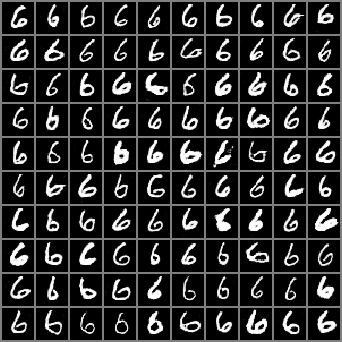

epoch: 14/15, batch: 10/600, G_loss: 2.1374073028564453, D_loss: (1.1531107425689697, 0.13441047072410583, 0.39304444193840027)
epoch: 14/15, batch: 20/600, G_loss: 2.265340566635132, D_loss: (1.2086349725723267, 0.11644472181797028, 0.38081246614456177)
epoch: 14/15, batch: 30/600, G_loss: 0.9561132788658142, D_loss: (0.424174040555954, 0.5095186829566956, 1.0928435325622559)
epoch: 14/15, batch: 40/600, G_loss: 1.2737913131713867, D_loss: (0.8080775737762451, 0.34778842329978943, 0.6109148263931274)
epoch: 14/15, batch: 50/600, G_loss: 2.5201711654663086, D_loss: (1.443495512008667, 0.08932237327098846, 0.2800641655921936)
epoch: 14/15, batch: 60/600, G_loss: 1.7222117185592651, D_loss: (0.9841157793998718, 0.2111385315656662, 0.488321453332901)
epoch: 14/15, batch: 70/600, G_loss: 2.050234079360962, D_loss: (1.218522310256958, 0.15053248405456543, 0.3693391680717468)
epoch: 14/15, batch: 80/600, G_loss: 1.7808773517608643, D_loss: (1.0833544731140137, 0.19469663500785828, 0.43623030

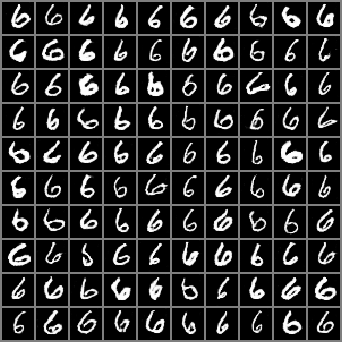

epoch: 14/15, batch: 110/600, G_loss: 1.703157663345337, D_loss: (0.9654242992401123, 0.213716521859169, 0.5052838325500488)
epoch: 14/15, batch: 120/600, G_loss: 1.4486602544784546, D_loss: (0.6214639544487, 0.2812584936618805, 0.7939643859863281)
epoch: 14/15, batch: 130/600, G_loss: 1.8970516920089722, D_loss: (1.0170154571533203, 0.17205728590488434, 0.47747886180877686)
epoch: 14/15, batch: 140/600, G_loss: 1.7914419174194336, D_loss: (1.0793310403823853, 0.19381441175937653, 0.42740342020988464)
epoch: 14/15, batch: 150/600, G_loss: 2.404681921005249, D_loss: (1.4580940008163452, 0.10121951252222061, 0.2942853271961212)
epoch: 14/15, batch: 160/600, G_loss: 1.8738442659378052, D_loss: (0.9118373990058899, 0.1739356964826584, 0.5408627986907959)
epoch: 14/15, batch: 170/600, G_loss: 1.7965688705444336, D_loss: (0.9008309245109558, 0.19640637934207916, 0.5494418740272522)
epoch: 14/15, batch: 180/600, G_loss: 1.576568603515625, D_loss: (0.7580485343933105, 0.24472956359386444, 0.66

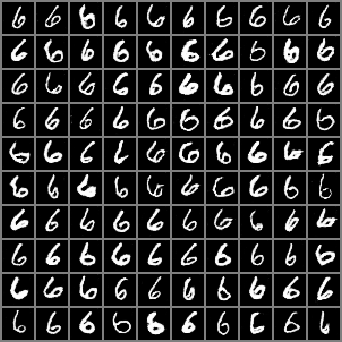

epoch: 14/15, batch: 210/600, G_loss: 1.347967505455017, D_loss: (0.8733564615249634, 0.31631001830101013, 0.5697173476219177)
epoch: 14/15, batch: 220/600, G_loss: 1.7666354179382324, D_loss: (0.7966051697731018, 0.19755500555038452, 0.6281563639640808)
epoch: 14/15, batch: 230/600, G_loss: 1.6762402057647705, D_loss: (1.0383473634719849, 0.21974295377731323, 0.46311214566230774)
epoch: 14/15, batch: 240/600, G_loss: 1.6894932985305786, D_loss: (0.8674415349960327, 0.21782773733139038, 0.5717401504516602)
epoch: 14/15, batch: 250/600, G_loss: 1.5956168174743652, D_loss: (0.8692047595977783, 0.24367107450962067, 0.5719001293182373)
epoch: 14/15, batch: 260/600, G_loss: 1.6733471155166626, D_loss: (0.910440981388092, 0.2180449664592743, 0.5405071377754211)
epoch: 14/15, batch: 270/600, G_loss: 1.9963264465332031, D_loss: (0.9968883395195007, 0.1561584323644638, 0.48353055119514465)
epoch: 14/15, batch: 280/600, G_loss: 2.15476393699646, D_loss: (1.0748200416564941, 0.13474394381046295, 

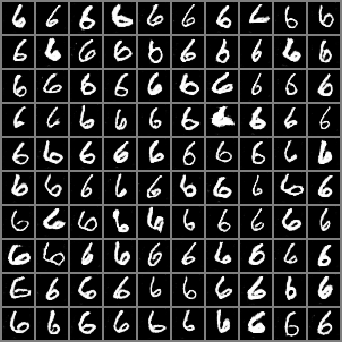

epoch: 14/15, batch: 310/600, G_loss: 1.339759111404419, D_loss: (0.5796663165092468, 0.3243473470211029, 0.8709830641746521)
epoch: 14/15, batch: 320/600, G_loss: 1.9970886707305908, D_loss: (1.1925705671310425, 0.15994465351104736, 0.3798385560512543)
epoch: 14/15, batch: 330/600, G_loss: 2.119860887527466, D_loss: (1.1677359342575073, 0.13475535809993744, 0.38873863220214844)
epoch: 14/15, batch: 340/600, G_loss: 1.9508676528930664, D_loss: (1.1728715896606445, 0.15963780879974365, 0.38213661313056946)
epoch: 14/15, batch: 350/600, G_loss: 1.7725799083709717, D_loss: (1.053767442703247, 0.19872523844242096, 0.4433223009109497)
epoch: 14/15, batch: 360/600, G_loss: 1.2369104623794556, D_loss: (0.6334081292152405, 0.3627113699913025, 0.7747571468353271)
epoch: 14/15, batch: 370/600, G_loss: 1.4231303930282593, D_loss: (0.8077038526535034, 0.29392150044441223, 0.6163157820701599)
epoch: 14/15, batch: 380/600, G_loss: 1.9929683208465576, D_loss: (1.0200053453445435, 0.15472882986068726,

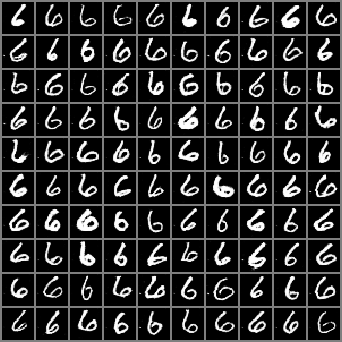

epoch: 14/15, batch: 410/600, G_loss: 2.126479148864746, D_loss: (1.0782009363174438, 0.13467763364315033, 0.4358770251274109)
epoch: 14/15, batch: 420/600, G_loss: 1.6939729452133179, D_loss: (0.8969568014144897, 0.214839369058609, 0.5467322468757629)
epoch: 14/15, batch: 430/600, G_loss: 1.743126392364502, D_loss: (0.8844162821769714, 0.20393167436122894, 0.5601780414581299)
epoch: 14/15, batch: 440/600, G_loss: 1.8936272859573364, D_loss: (0.9689808487892151, 0.17605210840702057, 0.5077038407325745)
epoch: 14/15, batch: 450/600, G_loss: 1.7720969915390015, D_loss: (1.1250313520431519, 0.19775079190731049, 0.4126552641391754)
epoch: 14/15, batch: 460/600, G_loss: 1.141298532485962, D_loss: (0.5954639911651611, 0.4026047885417938, 0.8359469771385193)
epoch: 14/15, batch: 470/600, G_loss: 1.8724092245101929, D_loss: (0.9989607334136963, 0.17914648354053497, 0.4834308326244354)
epoch: 14/15, batch: 480/600, G_loss: 1.5755929946899414, D_loss: (0.9149286150932312, 0.24769726395606995, 0.

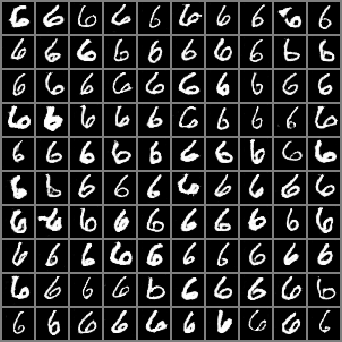

epoch: 14/15, batch: 510/600, G_loss: 1.398331642150879, D_loss: (0.6332386136054993, 0.29973918199539185, 0.7910861968994141)
epoch: 14/15, batch: 520/600, G_loss: 1.5292460918426514, D_loss: (0.911350429058075, 0.256558895111084, 0.520815372467041)
epoch: 14/15, batch: 530/600, G_loss: 1.8051385879516602, D_loss: (0.9634080529212952, 0.1913115680217743, 0.5066422820091248)
epoch: 14/15, batch: 540/600, G_loss: 1.6120834350585938, D_loss: (0.9810171723365784, 0.24085575342178345, 0.48884621262550354)
epoch: 14/15, batch: 550/600, G_loss: 1.7322787046432495, D_loss: (0.8219466209411621, 0.2052886188030243, 0.6020443439483643)
epoch: 14/15, batch: 560/600, G_loss: 1.7660151720046997, D_loss: (0.9769887328147888, 0.20258909463882446, 0.500744104385376)
epoch: 14/15, batch: 570/600, G_loss: 1.3382103443145752, D_loss: (0.6515634059906006, 0.3238580822944641, 0.7768089175224304)
epoch: 14/15, batch: 580/600, G_loss: 1.7294533252716064, D_loss: (0.822221040725708, 0.20740173757076263, 0.600

In [70]:
device = torch.device("cuda")
num_epochs = 15
num_val_samples = 100
z_val = norm_noise(num_val_samples)
model = Model(hparams['batch_size'])
desired_label = 8
noise_label= torch.cuda.LongTensor(num_val_samples,1).fill_(desired_label)

for epoch in range(num_epochs):
    # Train epoch
    for n_batch, (real_samples,real_labels) in enumerate(data_loader):
        
        # Prepare batch data
        real_samples = Variable(real_samples).cuda()
        real_labels = Variable(real_labels).cuda()  
        # Update model weights
        loss_g, loss_d = model.step_optimization(real_samples,real_labels,norm_noise(num_val_samples),hparams)
        
        # Show current loss
        if (n_batch) % 10 == 0:
            print(f"epoch: {epoch}/{num_epochs}, batch: {n_batch}/{len(data_loader)}, G_loss: {loss_g}, D_loss: {loss_d}")    
          
        # Show fake samples
        if (n_batch) % 100 == 0:
            val_fake_samples,noise_label = model.generate_samples(num_val_samples,n=noise_label,z=norm_noise(num_val_samples))
            val_fake_samples=val_fake_samples.data.cpu()
            display_batch_images(val_fake_samples)

Finally, we display a couple of examples of the images generated by the CGAN. During training, we realized that the generated images are all from the same class but don't correspond to the appropiate class. In future implementations, we would need to improve this.

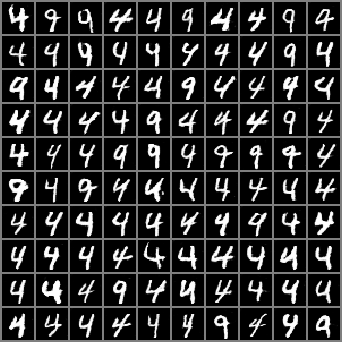

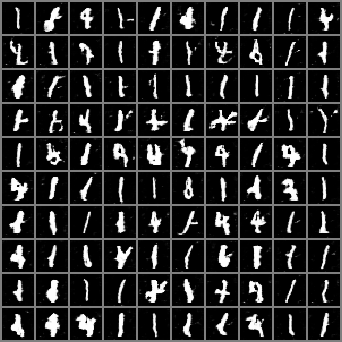

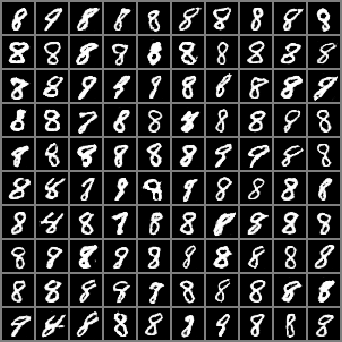

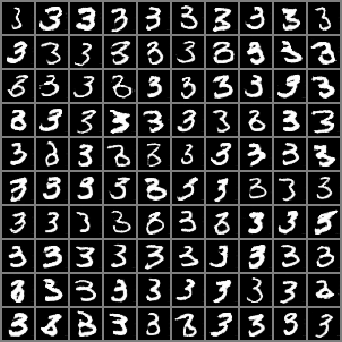

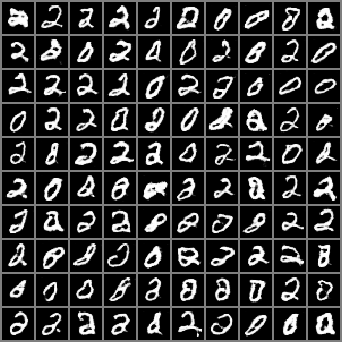

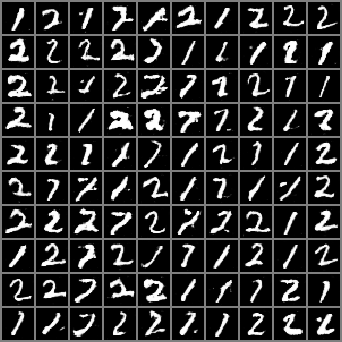

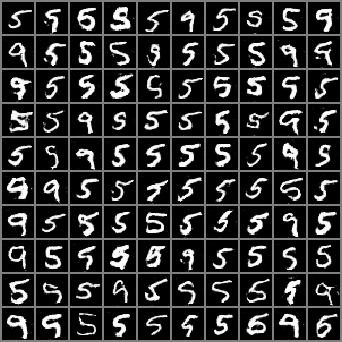

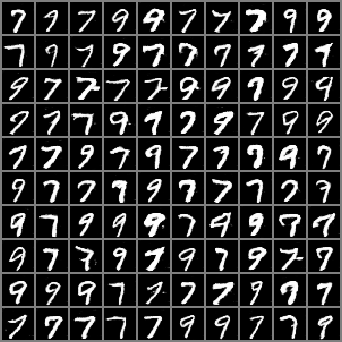

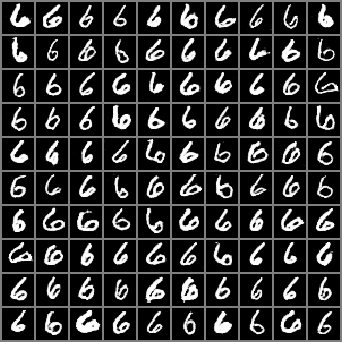

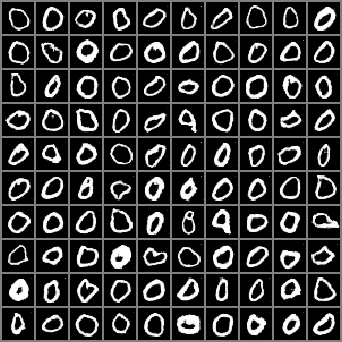

In [74]:
model_8=model
desired_label = 0
noise_label= torch.cuda.LongTensor(hparams['batch_size'],1).fill_(desired_label)

val_fake_samples,noise_label = model_8.generate_samples(num_val_samples,n=noise_label,z=norm_noise(num_val_samples))
val_fake_samples=val_fake_samples.data.cpu()
display_batch_images(val_fake_samples)

desired_label = 1
noise_label= torch.cuda.LongTensor(hparams['batch_size'],1).fill_(desired_label)

val_fake_samples,noise_label = model.generate_samples(num_val_samples,n=noise_label,z=norm_noise(num_val_samples))
val_fake_samples=val_fake_samples.data.cpu()
display_batch_images(val_fake_samples)

desired_label = 2
noise_label= torch.cuda.LongTensor(hparams['batch_size'],1).fill_(desired_label)

val_fake_samples,noise_label = model.generate_samples(num_val_samples,n=noise_label,z=norm_noise(num_val_samples))
val_fake_samples=val_fake_samples.data.cpu()
display_batch_images(val_fake_samples)

desired_label = 3
noise_label= torch.cuda.LongTensor(hparams['batch_size'],1).fill_(desired_label)

val_fake_samples,noise_label = model.generate_samples(num_val_samples,n=noise_label,z=norm_noise(num_val_samples))
val_fake_samples=val_fake_samples.data.cpu()
display_batch_images(val_fake_samples)

desired_label = 4
noise_label= torch.cuda.LongTensor(hparams['batch_size'],1).fill_(desired_label)

val_fake_samples,noise_label = model.generate_samples(num_val_samples,n=noise_label,z=norm_noise(num_val_samples))
val_fake_samples=val_fake_samples.data.cpu()
display_batch_images(val_fake_samples)

desired_label = 5
noise_label= torch.cuda.LongTensor(hparams['batch_size'],1).fill_(desired_label)

val_fake_samples,noise_label = model.generate_samples(num_val_samples,n=noise_label,z=norm_noise(num_val_samples))
val_fake_samples=val_fake_samples.data.cpu()
display_batch_images(val_fake_samples)

desired_label = 6
noise_label= torch.cuda.LongTensor(hparams['batch_size'],1).fill_(desired_label)

val_fake_samples,noise_label = model.generate_samples(num_val_samples,n=noise_label,z=norm_noise(num_val_samples))
val_fake_samples=val_fake_samples.data.cpu()
display_batch_images(val_fake_samples)

desired_label = 7
noise_label= torch.cuda.LongTensor(hparams['batch_size'],1).fill_(desired_label)

val_fake_samples,noise_label = model.generate_samples(num_val_samples,n=noise_label,z=norm_noise(num_val_samples))
val_fake_samples=val_fake_samples.data.cpu()
display_batch_images(val_fake_samples)

desired_label = 8
noise_label= torch.cuda.LongTensor(hparams['batch_size'],1).fill_(desired_label)

val_fake_samples,noise_label = model.generate_samples(num_val_samples,n=noise_label,z=norm_noise(num_val_samples))
val_fake_samples=val_fake_samples.data.cpu()
display_batch_images(val_fake_samples)

desired_label = 9
noise_label= torch.cuda.LongTensor(hparams['batch_size'],1).fill_(desired_label)

val_fake_samples,noise_label = model.generate_samples(num_val_samples,n=noise_label,z=norm_noise(num_val_samples))
val_fake_samples=val_fake_samples.data.cpu()
display_batch_images(val_fake_samples)
